In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import model_functions
from sklearn.inspection import partial_dependence #,plot_partial_dependence
from lime.lime_tabular import LimeTabularExplainer
import lime
import lime.lime_tabular
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
import embeddings_functions
import model_functions
import nltk
from sklearn.svm import SVC
from nltk import word_tokenize
import sklearn
print(sklearn.__version__)
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from gensim.models import Word2Vec
from sklearn.inspection import PartialDependenceDisplay
from scipy.stats import pearsonr
np.random.seed(3)
import gensim

1.5.1


In [2]:
pd.set_option('display.max_columns', None)

In [3]:
df_proc = pd.read_parquet('df_proc.parquet', engine='pyarrow')
df_proc['text_tok'] = df_proc['text_tok'].apply(lambda x: x.tolist())
features1 = pd.read_csv("final_df_datasets_features.csv")
random_words_list = pd.read_csv("random_words_list.csv")

In [4]:
features_2 = pd.concat([pd.read_csv("features_lexical_new_chunk_9.csv"),
                        pd.read_csv("features_lexical_new_chunk_8.csv"),
                        pd.read_csv("features_lexical_new_chunk_7.csv"),
                        pd.read_csv("features_lexical_new_chunk_6.csv"),
                        pd.read_csv("features_lexical_new_chunk_5.csv"),
                        pd.read_csv("features_lexical_new_chunk_4.csv"),
                        pd.read_csv("features_lexical_new_chunk_3.csv"),
                        pd.read_csv("features_lexical_new_chunk_2.csv"),
                        pd.read_csv("features_lexical_new_chunk_1.csv"),
                        pd.read_csv("features_lexical_new_chunk_0.csv"),
                       ])

features_2["score"] = features_2["score"]*100/50

/tmp/ipykernel_202030/869677855.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  features_2 = pd.concat([pd.read_csv("features_lexical_new_chunk_9.csv"),


In [5]:
model_name = "w2v"
tokenized_corpus = list(df_proc['text_tok'].values)
word_embeddings = embeddings_functions.Word2VecEmbeddings(tokenized_corpus[:len(tokenized_corpus)],model_name)
word_embeddings.train_model(window = 3,min_count = 1, seed = 1,sg = 1,vector_size=300,norm = True,epochs = 5)

In [6]:
model = gensim.models.Word2Vec.load(model_name + ".bin")

In [7]:
vocab = list(model.wv.key_to_index.keys())

In [8]:
vocab[:10]

['lunch',
 'meal',
 'find',
 'lot',
 'nothing',
 'many',
 'last',
 'drinks',
 'long',
 'everything']

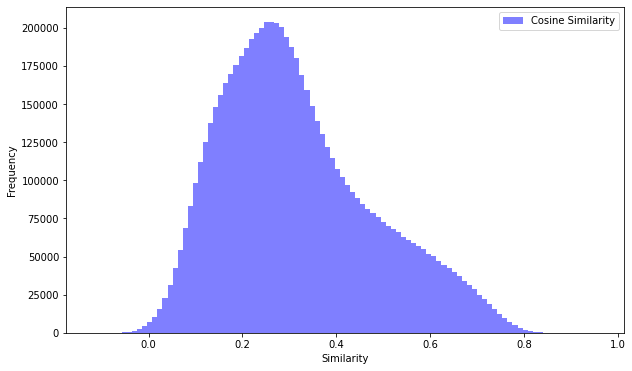

In [9]:
words = list(random_words_list["word"].unique())
embeddings = word_embeddings.get_embeddings(words = words)
similarity = embeddings_functions.Similarity2(embeddings_df = embeddings)
df_cosine = similarity.get_cosine_similarity_of_all_words2().drop_duplicates()
df_cosine["first_second"] = df_cosine["First"] + "_" + df_cosine["Last"]

plt.figure(figsize=(10, 6))
plt.hist(df_cosine["similarity"], bins=100, color="blue", alpha=0.5, label="Cosine Similarity")
plt.xlabel("Similarity")
plt.ylabel("Frequency")
plt.legend()
plt.show()

In [10]:
embeddings

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
sleeveless,0.072021,0.077493,-0.018667,0.007085,0.021156,-0.106702,-0.117378,0.069261,-0.001268,-0.015483,-0.007329,-0.007484,0.035061,-0.076507,-0.089324,-0.046891,-0.053613,0.007437,0.049272,-0.018489,-0.003759,0.036864,0.098874,0.021042,0.075007,0.008526,0.016830,0.016291,0.033637,0.019225,0.027828,-0.004648,-0.044828,-0.094183,0.029326,0.027327,0.003203,-0.071110,0.012302,0.015389,0.029587,-0.018396,0.063668,-0.076891,-0.056709,0.008939,0.022593,0.010773,-0.037940,0.017973,0.000857,0.025005,-0.048174,0.075418,-0.036782,-0.015247,-0.002177,-0.097013,0.012096,-0.014531,-0.000878,0.024872,-0.088789,-0.011343,0.026503,-0.023365,0.033380,-0.034694,-0.033621,0.089085,-0.122137,0.081104,-0.032272,-0.045599,0.061411,0.040088,-0.032343,-0.068364,0.030904,0.029373,0.055599,-0.028931,-0.029109,0.058111,0.017119,0.051879,0.006372,-0.032683,-0.001743,-0.001880,0.045715,-0.080342,-0.041574,-0.033180,-0.050554,-0.157061,0.126387,-0.006324,-0.036198,-0.058234,-0.030895,-0.021147,0.048932,-0.005644,-0.060179,-0.056150,-0.074391,0.029141,0.065078,0.126511,0.021696,-0.088459,0.004325,-0.009677,0.060167,-0.017483,-0.051108,0.050121,-0.002118,0.012791,0.002865,0.021748,-0.049674,0.046916,0.014679,0.085370,0.073731,0.025899,0.080461,-0.014198,-0.040678,0.028155,-0.005643,-0.117307,-0.006184,0.061102,0.043465,-0.009904,-0.066723,-0.043696,0.059675,-0.006365,-0.029169,-0.024146,-0.004456,0.009742,-0.054762,0.076879,-0.035347,-0.030749,0.001625,-0.037929,-0.033804,-0.101557,0.007025,0.073548,-0.057927,-0.035207,0.064468,-0.018520,-0.084311,0.129966,-0.205096,0.025627,-0.108748,-0.044804,0.030543,-0.088324,0.012653,0.122661,0.010013,-0.022553,0.060009,0.044308,-0.084421,-0.019797,0.092093,-0.044793,-0.043315,-0.028931,-0.104746,0.030373,-0.068313,-0.060277,0.039133,0.103118,-0.069427,0.029404,0.066021,-0.088426,-0.083356,-0.110147,-0.042104,-0.012099,0.001776,-0.022117,0.001896,-0.072419,0.016291,0.034768,-0.076743,0.003769,-0.031506,-0.058317,-0.079306,-0.016180,-0.026451,0.054003,-0.111373,-0.021367,0.065394,0.057965,0.030141,-0.068544,0.069608,0.022316,-0.007894,-0.074705,-0.115369,-0.078764,0.049192,0.013873,0.021278,-0.017449,-0.054988,0.007033,0.057616,0.112301,-0.023597,0.072055,0.046536,-0.023621,-0.106432,0.016087,-0.018381,-0.017970,-0.031318,0.001667,0.007147,-0.103106,-0.102117,-0.015975,-0.136436,-0.022829,0.032359,-0.139378,0.019489,-0.009217,-0.069642,0.017470,0.006040,0.045316,0.058330,0.051283,-0.087845,0.030590,0.046667,0.041085,0.035939,-0.116196,0.118172,-0.025329,-0.070404,0.007341,-0.022996,0.058302,0.009614,0.024202,-0.040343,0.051967,-0.017735,-0.050629,0.018507,-0.054572,0.028840,0.025297,0.071048,-0.013470,0.018705,-0.053972,0.047533,-0.106624,0.032446,0.098781,0.040135,-0.009629,-0.082671,0.029588,0.089155,0.126987,-0.047311,0.061723,0.099315,-0.032277,0.006504,0.119151,0.021434,0.021847,-0.005605,0.096148
itd,-0.027187,0.064434,0.031239,-0.038611,0.02

In [11]:
len(df_cosine)

6854253

In [12]:
len(features1)

6958315

In [13]:
df = df_cosine.merge(features_2,on = "first_second", how = "inner")

In [14]:
df

,similarity,First_x,Last_x,first_second,word1,word2,score,Unnamed: 0,First_y,Last_y,no_words_corpus,frequency_w1,frequency_w2,tf_rel_word1,tf_rel_word2,word1_length,word2_length,fraq_w1_w2,frequency_of_cooc_w_3,corr_w_3,freq_cooc_mult_fraq_w1_w2_w_3,frequency_of_cooc_w_5,corr_w_5,freq_cooc_mult_fraq_w1_w2_w_5,frequency_of_cooc_w_8,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_8,syn_match,syn_match_perc,syn1_count,syn2_count,are_synonyms,fraq_syn1_syn2,syn_match_mult_fraq_syn,ant_match,ant_match_perc,ant1_count,ant2_count,are_antonyms,fraq_ant1_ant2,ant_match_mult_fraq_ant,hypo_match,hypo_match_perc,hypo1_count,hypo2_count,is_hyponym,fraq_hypo1_hypo2,hypo_match_mult_fraq_hypo,hyper_match,hyper_match_perc,hyper1_count,hyper2_count,is_hypernym,fraq_hyper1_hyper2,hyper_match_mult_fraq_hyper,polysemy1,polysemy2,are_homonyms,common_homonyms,common_homonyms_perc,first_word_lemma,second_word_lemma,common_lemma,common_prefixes,common_suffixes,first_word_derivations,second_word_derivations,are_derivationally_related,word1_pos_tags,word2_pos_tags,common_pos_tags,same_pos_tags,first_word_dependencies,second_word_dependencies,first_word_dep_types,second_word_dep_types,first_word_head_words,second_word_head_words,first_word_dep_count,second_word_dep_count,common_dep_types,common_head_words,dep_count_diff
0,0.404904,cemetery,grave,cemetery_grave,cemetery,grave,0.80,284418,cemetery,grave,509377579,55,200,0.000011,0.000039,8,5,0.275000,2,0.138238,0.550000,4,0.219094,1.100000,4,0.295694,1.100000,0.0,0.0,13.0,24.0,False,0.541667,0.0,0.0,0.0,2.0,3.0,False,0.666667,0.0,0.0,0.0,0.0,95.0,False,0.000000,0.0,0.0,0.000000,0.0,40.0,False,0.000000,0.000000,11.0,15.0,False,0.0,0.0,bright,colour,False,0.0,0.0,"{'vividness', 'brilliancy', 'shine', 'brightne...","{'coloration', 'colouring', 'gloss', 'colorize...",False,['ADJ'],['NOUN'],0.0,False,"[('bright', 'ROOT', 'bright')]","[('colour', 'ROOT', 'colour')]",['ROOT'],['ROOT'],['bright'],['colour'],1.0,1.0,1.0,0.0,0.0
1,0.109180,cemetery,cone,cemetery_cone,cemetery,cone,0.14,284556,cemetery,cone,509377579,55,1233,0.000011,0.000242,8,4,0.044607,0,0.049624,0.000000,0,0.077677,0.000000,0,0.110995,0.000000,0.0,0.0,11.0,46.0,False,0.239130,0.0,0.0,0.0,0.0,4.0,False,0.000000,0.0,0.0,0.0,3.0,110.0,False,0.027273,0.0,0.0,0.000000,2.0,49.0,False,0.040816,0.000000,2.0,22.0,False,0.0,0.0,dude,stop,False,0.0,0.0,{'dandify'},"{'barricade', 'stop', 'blocking', 'discontinua...",False,['VERB'],['VERB'],1.0,True,"[('dude', 'ROOT', 'dude')]","[('stop', 'ROOT', 'stop')]",['ROOT'],['ROOT'],['dude'],['stop'],1.0,1.0,1.0,0.0,0.0
2,0.232391,cemetery,males,cemetery_males,cemetery,males,0.20,284566,cemetery,males,509377579,55,219,0.000011,0.000043,8,5,0.251142,0,0.087103,0.000000,0,0.129904,0.000000,0,0.212897,0.000000,0.0,0.0,5.0,12.0,False,0.416667,0.0,0.0,0.0,0.0,0.0,False,0.000000,0.0,0.0,0.0,46.0,41.0,False,1.121951,0.0,0.0,0.000000,21.0,24.0,False,0.875000,0.000000,7.0,10.0,False,0.0,0.0,jacket,stream,False,0.0,0.0,{'jacket'},"{'swarm', 'stream', 'flow', 'pelter', 'streaml...",False,['NOUN'],['VERB'],0.0,False,"[('jacket', 'ROOT', 'jacket')]","[('stream', 'ROOT', 'stream')]",['ROOT'],['ROOT'],['jacket'],['stream'],1.0,1.0,1.0,0.0,0.0
3,0.339895,cemetery,memorial,cemetery_memorial,cemetery,memorial,0.74,284812,cemetery,memorial,509377579,55,844,0.000011,0.000166,8,8,0.065166,5,0.051450,0.325829,5,0.103167,0.325829,5,0.176476,0.325829,0.0,0.0,7.0,4.0,False,1.750000,0.0,0.0,0.0,0.0,0.0,False,0.000000,0.0,0.0,0.0,1.0,17.0,False,0.058824,0.0,0.0,0.000000,2.0,8.0,False,0.250000,0.000000,1.0,3.0,False,0.0,0.0,cemetery,memorial,False,0.0,0.0,set(),"{'remember', 'memorialize', 'monumental', 'com...",False,['NOUN'],['VERB'],0.0,False,"[('cemetery', 'ROOT', 'cemetery')]","[('memorial', 'ROOT', 'memorial')]",['ROOT'],['ROOT'],['cemetery'],['memorial'],1.0,1.0,1.0,0.0,0.0
4,0.387634,mac,burger,mac_burger,burger,mac,0.56,273329,mac,burger,509377579,12857,58400,0.002524,0.011465,3,6,0.220154,373,0.607494,82.117483,570,0.639487,125.487842,823,0.65998

In [15]:
df["similarity_category"] = np.where(df["similarity"]>=0.5, 1, 0)
df = df.set_index("first_second")
df.sort_values("similarity",ascending=False)[:10]

,similarity,First_x,Last_x,word1,word2,score,Unnamed: 0,First_y,Last_y,no_words_corpus,frequency_w1,frequency_w2,tf_rel_word1,tf_rel_word2,word1_length,word2_length,fraq_w1_w2,frequency_of_cooc_w_3,corr_w_3,freq_cooc_mult_fraq_w1_w2_w_3,frequency_of_cooc_w_5,corr_w_5,freq_cooc_mult_fraq_w1_w2_w_5,frequency_of_cooc_w_8,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_8,syn_match,syn_match_perc,syn1_count,syn2_count,are_synonyms,fraq_syn1_syn2,syn_match_mult_fraq_syn,ant_match,ant_match_perc,ant1_count,ant2_count,are_antonyms,fraq_ant1_ant2,ant_match_mult_fraq_ant,hypo_match,hypo_match_perc,hypo1_count,hypo2_count,is_hyponym,fraq_hypo1_hypo2,hypo_match_mult_fraq_hypo,hyper_match,hyper_match_perc,hyper1_count,hyper2_count,is_hypernym,fraq_hyper1_hyper2,hyper_match_mult_fraq_hyper,polysemy1,polysemy2,are_homonyms,common_homonyms,common_homonyms_perc,first_word_lemma,second_word_lemma,common_lemma,common_prefixes,common_suffixes,first_word_derivations,second_word_derivations,are_derivationally_related,word1_pos_tags,word2_pos_tags,common_pos_tags,same_pos_tags,first_word_dependencies,second_word_dependencies,first_word_dep_types,second_word_dep_types,first_word_head_words,second_word_head_words,first_word_dep_count,second_word_dep_count,common_dep_types,common_head_words,dep_count_diff,similarity_category
first_second,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
daughter_son,0.889612,daughter,son,daughter,son,0.82,1352202,daughter,son,509377579,9601,9049,0.001885,0.001776,8,3,1.061001,202,0.969587,214.322246,280,0.975030,297.080340,371,0.976755,393.631451,0.0,0.000000,1.0,6.0,False,0.166667,0.000000,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.000000,1.0,13.0,False,0.076923,0.0,0.0,0.000000,4.0,14.0,False,0.285714,0.000000,2.0,5.0,False,0.0,0.000000,beach,coast,False,0.0,0.0,{'beach'},"{'slide', 'coaster', 'coastal', 'coast', 'glide'}",False,['VERB'],['PROPN'],0.0,False,"[('beach', 'ROOT', 'beach')]","[('coast', 'ROOT', 'coast')]",['ROOT'],['ROOT'],['beach'],['coast'],1.0,1.0,1.0,0.0,0.0,1
vehicle_car,0.848658,vehicle,car,car,vehicle,0.92,400903,vehicle,car,509377579,3376,39622,0.000663,0.007779,7,3,0.085205,232,0.830210,19.767604,484,0.888492,41.239311,864,0.919011,73.617283,0.0,0.000000,11.0,2.0,False,5.500000,0.000000,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.000000,83.0,13.0,False,6.384615,0.0,0.0,0.000000,4.0,6.0,False,0.666667,0.000000,5.0,4.0,False,0.0,0.000000,car,vehicle,False,0.0,0.0,"{'machinist', 'automobile', 'automobilist'}",{'vehicular'},False,['NOUN'],['NOUN'],1.0,True,"[('car', 'ROOT', 'car')]","[('vehicle', 'ROOT', 'vehicle')]",['ROOT'],['ROOT'],['car'],['vehicle'],1.0,1.0,1.0,0.0,0.0,1
reptiles_amphibians,0.829810,reptiles,amphibians,amphibians,reptiles,0.82,71290,reptiles,amphibians,509377579,72,8,0.000014,0.000002,8,10,9.000000,5,0.398591,45.000000,5,0.409282,45.000000,7,0.504127,63.000000,0.0,0.000000,1.0,14.0,False,0.071429,0.000000,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.000000,7.0,58.0,False,0.120690,0.0,0.0,0.000000,1.0,41.0,False,0.024390,0.000000,1.0,17.0,False,0.0,0.000000,aircraft,fly,False,0.0,0.0,set(),"{'flyer', 'wing', 'fly', 'flying', 'aviation',...",False,['NOUN'],['VERB'],0.0,False,"[('aircraft', 'ROOT', 'aircraft')]","[('flying', 'ROOT', 'flying')]",['ROOT'],['ROOT'],['aircraft'],['flying'],1.0,1.0,1.0,0.0,0.0,1
children_kids,0.803217,children,kids,children,kids,0.92,1200486,children,kids,509377579,6495,26793,0.001275,0.005260,8,4,0.242414,273,0.872493,66.179039,505,0.910424,122.419102,811,0.932252,196.597805,2.0,0.400000,5.0,4.0,False,1.250000,2.500000,0.0,0.0,0.0,0.0,False,0.0,0.0,13.0,0.270833,48.0,16.0,False,3.000000,39.0,6.0,0.400000,15.0,11.0,False,1.363636,8.181818,6.0,4.0,True,1.0,0.166667,fish,fish,True,3.0,0.0,"{'fishery', 'fishy', 'fish', 'fishing', 'fisher'}","{'fishing', 'fishery', 'fisher', 'fish'}",True,['NOUN'],['VERB'],0.0,False,"[('fish', 'ROOT', 'fish')]","[('fishing', 'ROOT', 'fishing')]",['ROOT'],['ROOT'],['fish'],['fishing'],1.0,1.0,1.0,0.0,0.0,1
mammals_amphibians,

In [16]:
X_statistical = df[['corr_w_3',"frequency_of_cooc_w_3",
                    "frequency_of_cooc_w_5","corr_w_5","freq_cooc_mult_fraq_w1_w2_w_5",
                    "frequency_of_cooc_w_8","corr_w_8","freq_cooc_mult_fraq_w1_w2_w_8",
     'frequency_w1','frequency_w2','tf_rel_word1', 'tf_rel_word2',
 'word1_length','word2_length','fraq_w1_w2','freq_cooc_mult_fraq_w1_w2_w_3',
]]

X_lexical = df[["score","syn_match","syn_match_perc","syn1_count","syn2_count","are_synonyms","fraq_syn1_syn2","syn_match_mult_fraq_syn",
"ant_match","ant_match_perc","ant1_count","ant2_count","are_antonyms","fraq_ant1_ant2","ant_match_mult_fraq_ant",
 "hypo_match","hypo_match_perc","hypo1_count","hypo2_count","is_hyponym","fraq_hypo1_hypo2","hypo_match_mult_fraq_hypo",
 "hyper_match","hyper_match_perc","hyper1_count","hyper2_count","is_hypernym","fraq_hyper1_hyper2","hyper_match_mult_fraq_hyper",
 "polysemy1","polysemy2",
 "are_homonyms","common_homonyms","common_homonyms_perc",
 "common_lemma",
 "common_prefixes",
 "common_suffixes",
 "are_derivationally_related",
 "common_pos_tags","same_pos_tags",
 "first_word_dep_count","second_word_dep_count","common_dep_types","dep_count_diff",
 "common_head_words",
]]



X_all = df[['corr_w_3',"frequency_of_cooc_w_3",
                    "frequency_of_cooc_w_5","corr_w_5","freq_cooc_mult_fraq_w1_w2_w_5",
                    "frequency_of_cooc_w_8","corr_w_8","freq_cooc_mult_fraq_w1_w2_w_8",
     'frequency_w1','frequency_w2','tf_rel_word1', 'tf_rel_word2',
 'word1_length','word2_length','fraq_w1_w2','freq_cooc_mult_fraq_w1_w2_w_3',
        "score",    
"syn_match","syn_match_perc","syn1_count","syn2_count","are_synonyms","fraq_syn1_syn2","syn_match_mult_fraq_syn",
"ant_match","ant_match_perc","ant1_count","ant2_count","are_antonyms","fraq_ant1_ant2","ant_match_mult_fraq_ant",
 "hypo_match","hypo_match_perc","hypo1_count","hypo2_count","is_hyponym","fraq_hypo1_hypo2","hypo_match_mult_fraq_hypo",
 "hyper_match","hyper_match_perc","hyper1_count","hyper2_count","is_hypernym","fraq_hyper1_hyper2","hyper_match_mult_fraq_hyper",
 "polysemy1","polysemy2",
 "are_homonyms","common_homonyms","common_homonyms_perc",
 "common_lemma",
 "common_prefixes",
 "common_suffixes",
 "are_derivationally_related",
 "common_pos_tags","same_pos_tags",
 "first_word_dep_count","second_word_dep_count","common_dep_types","dep_count_diff",
 "common_head_words",]]

In [17]:
df

,similarity,First_x,Last_x,word1,word2,score,Unnamed: 0,First_y,Last_y,no_words_corpus,frequency_w1,frequency_w2,tf_rel_word1,tf_rel_word2,word1_length,word2_length,fraq_w1_w2,frequency_of_cooc_w_3,corr_w_3,freq_cooc_mult_fraq_w1_w2_w_3,frequency_of_cooc_w_5,corr_w_5,freq_cooc_mult_fraq_w1_w2_w_5,frequency_of_cooc_w_8,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_8,syn_match,syn_match_perc,syn1_count,syn2_count,are_synonyms,fraq_syn1_syn2,syn_match_mult_fraq_syn,ant_match,ant_match_perc,ant1_count,ant2_count,are_antonyms,fraq_ant1_ant2,ant_match_mult_fraq_ant,hypo_match,hypo_match_perc,hypo1_count,hypo2_count,is_hyponym,fraq_hypo1_hypo2,hypo_match_mult_fraq_hypo,hyper_match,hyper_match_perc,hyper1_count,hyper2_count,is_hypernym,fraq_hyper1_hyper2,hyper_match_mult_fraq_hyper,polysemy1,polysemy2,are_homonyms,common_homonyms,common_homonyms_perc,first_word_lemma,second_word_lemma,common_lemma,common_prefixes,common_suffixes,first_word_derivations,second_word_derivations,are_derivationally_related,word1_pos_tags,word2_pos_tags,common_pos_tags,same_pos_tags,first_word_dependencies,second_word_dependencies,first_word_dep_types,second_word_dep_types,first_word_head_words,second_word_head_words,first_word_dep_count,second_word_dep_count,common_dep_types,common_head_words,dep_count_diff,similarity_category
first_second,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
cemetery_grave,0.404904,cemetery,grave,cemetery,grave,0.80,284418,cemetery,grave,509377579,55,200,0.000011,0.000039,8,5,0.275000,2,0.138238,0.550000,4,0.219094,1.100000,4,0.295694,1.100000,0.0,0.0,13.0,24.0,False,0.541667,0.0,0.0,0.0,2.0,3.0,False,0.666667,0.0,0.0,0.0,0.0,95.0,False,0.000000,0.0,0.0,0.000000,0.0,40.0,False,0.000000,0.000000,11.0,15.0,False,0.0,0.0,bright,colour,False,0.0,0.0,"{'vividness', 'brilliancy', 'shine', 'brightne...","{'coloration', 'colouring', 'gloss', 'colorize...",False,['ADJ'],['NOUN'],0.0,False,"[('bright', 'ROOT', 'bright')]","[('colour', 'ROOT', 'colour')]",['ROOT'],['ROOT'],['bright'],['colour'],1.0,1.0,1.0,0.0,0.0,0
cemetery_cone,0.109180,cemetery,cone,cemetery,cone,0.14,284556,cemetery,cone,509377579,55,1233,0.000011,0.000242,8,4,0.044607,0,0.049624,0.000000,0,0.077677,0.000000,0,0.110995,0.000000,0.0,0.0,11.0,46.0,False,0.239130,0.0,0.0,0.0,0.0,4.0,False,0.000000,0.0,0.0,0.0,3.0,110.0,False,0.027273,0.0,0.0,0.000000,2.0,49.0,False,0.040816,0.000000,2.0,22.0,False,0.0,0.0,dude,stop,False,0.0,0.0,{'dandify'},"{'barricade', 'stop', 'blocking', 'discontinua...",False,['VERB'],['VERB'],1.0,True,"[('dude', 'ROOT', 'dude')]","[('stop', 'ROOT', 'stop')]",['ROOT'],['ROOT'],['dude'],['stop'],1.0,1.0,1.0,0.0,0.0,0
cemetery_males,0.232391,cemetery,males,cemetery,males,0.20,284566,cemetery,males,509377579,55,219,0.000011,0.000043,8,5,0.251142,0,0.087103,0.000000,0,0.129904,0.000000,0,0.212897,0.000000,0.0,0.0,5.0,12.0,False,0.416667,0.0,0.0,0.0,0.0,0.0,False,0.000000,0.0,0.0,0.0,46.0,41.0,False,1.121951,0.0,0.0,0.000000,21.0,24.0,False,0.875000,0.000000,7.0,10.0,False,0.0,0.0,jacket,stream,False,0.0,0.0,{'jacket'},"{'swarm', 'stream', 'flow', 'pelter', 'streaml...",False,['NOUN'],['VERB'],0.0,False,"[('jacket', 'ROOT', 'jacket')]","[('stream', 'ROOT', 'stream')]",['ROOT'],['ROOT'],['jacket'],['stream'],1.0,1.0,1.0,0.0,0.0,0
cemetery_memorial,0.339895,cemetery,memorial,cemetery,memorial,0.74,284812,cemetery,memorial,509377579,55,844,0.000011,0.000166,8,8,0.065166,5,0.051450,0.325829,5,0.103167,0.325829,5,0.176476,0.325829,0.0,0.0,7.0,4.0,False,1.750000,0.0,0.0,0.0,0.0,0.0,False,0.000000,0.0,0.0,0.0,1.0,17.0,False,0.058824,0.0,0.0,0.000000,2.0,8.0,False,0.250000,0.000000,1.0,3.0,False,0.0,0.0,cemetery,memorial,False,0.0,0.0,set(),"{'remember', 'memorialize', 'monumental', 'com...",False,['NOUN'],['VERB'],0.0,False,"[('cemetery', 'ROOT', 'cemetery')]","[('memorial', 'ROOT', 'memorial')]",['ROOT'],['ROOT'],['cemetery'],['memorial'],1.0,1.0,1.0,0.0,0.0,0
mac_burger,0.387634,mac,burger,burger,mac,0.56,273329,mac,burger,509377579,

In [18]:
X_all[["score","is_hyponym","is_hypernym","are_synonyms","hyper_match_perc","corr_w_3","corr_w_5","corr_w_8",'freq_cooc_mult_fraq_w1_w2_w_3']].corr()

,score,is_hyponym,is_hypernym,are_synonyms,hyper_match_perc,corr_w_3,corr_w_5,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_3
score,1.000000,0.122686,0.163512,0.153807,0.226056,0.259452,0.257203,0.252475,0.149022
is_hyponym,0.122686,1.000000,-0.014862,0.042906,-0.011722,0.031611,0.029928,0.029199,0.028819
is_hypernym,0.163512,-0.014862,1.000000,0.032869,-0.018168,0.057830,0.057529,0.053258,0.046332
are_synonyms,0.153807,0.042906,0.032869,1.000000,0.344172,0.026100,0.022182,0.017473,0.015233
hyper_match_perc,0.226056,-0.011722,-0.018168,0.344172,1.000000,0.104170,0.100678,0.098511,0.012774
corr_w_3,0.259452,0.031611,0.057830,0.026100,0.104170,1.000000,0.982461,0.943982,0.270990
corr_w_5,0.257203,0.029928,0.057529,0.022182,0.100678,0.982461,1.000000,0.987071,0.267985
corr_w_8,0.252475,0.029199,0.053258,0.017473,0.098511,0.943982,0.987071,1.000000,0.257467
freq_cooc_mult_fraq_w1_w2_w_3,0.149022,0.028819,0.046332,0.015233,0.012774,0.270990,0.267985,0.257467,1.000000


In [19]:
correlation, p_value = pearsonr(df["similarity"], df["score"])
print(f"Pearsonův korelační koeficient: {correlation}")
print(f"P-hodnota: {p_value}")

correlation, p_value = pearsonr(df["similarity"], df["corr_w_3"])
print(f"Pearsonův korelační koeficient: {correlation}")
print(f"P-hodnota: {p_value}")

correlation, p_value = pearsonr(df["similarity"], df["are_synonyms"])
print(f"Pearsonův korelační koeficient: {correlation}")
print(f"P-hodnota: {p_value}")

Pearsonův korelační koeficient: 0.6309895081897665
P-hodnota: 6.421386544284701e-300
Pearsonův korelační koeficient: 0.3955772964541766
P-hodnota: 7.127785700472923e-102
Pearsonův korelační koeficient: 0.1044194319630179
P-hodnota: 5.353243592660761e-08


In [20]:
df_an = df.copy()
df_an["diff_similarity_humanscore"] = df_an["score"]-df_an["similarity"]
df_an = df_an.sort_values("diff_similarity_humanscore",ascending=True)
words_emb_sim_lower = df_an[:20].index
df_an[:20][["similarity","score"]]

,similarity,score
first_second,,
illustrations_chipmunk,0.649146,0.30
rodents_lego,0.447580,0.12
amphibians_stork,0.644087,0.32
explosion_stencil,0.341389,0.06
reptiles_mammals,0.779356,0.50
muscle_tulip,0.292070,0.02
mist_giraffe,0.308007,0.06
violet_aerial,0.365316,0.12
reading_seagull,0.343522,0.10


In [21]:
words_emb_sim_lower

Index(['illustrations_chipmunk', 'rodents_lego', 'amphibians_stork',
       'explosion_stencil', 'reptiles_mammals', 'muscle_tulip', 'mist_giraffe',
       'violet_aerial', 'reading_seagull', 'stripes_purple', 'swan_concrete',
       'giraffe_harbor', 'twigs_purple', 'posted_tulip', 'jaguar_pier',
       'caterpillars_painted', 'curled_whiskers', 'aircraft_asphalt',
       'clown_aerial', 'panda_donut'],
      dtype='object', name='first_second')

In [22]:
df_an = df.copy()
df_an["diff_similarity_humanscore"] = df_an["similarity"]-df_an["score"]
df_an = df_an.sort_values("diff_similarity_humanscore",ascending=False)
words_emb_sim_lower = df_an[:20].index
df_an[:20][["similarity","score"]]

,similarity,score
first_second,,
illustrations_chipmunk,0.649146,0.30
rodents_lego,0.447580,0.12
amphibians_stork,0.644087,0.32
explosion_stencil,0.341389,0.06
reptiles_mammals,0.779356,0.50
muscle_tulip,0.292070,0.02
mist_giraffe,0.308007,0.06
violet_aerial,0.365316,0.12
reading_seagull,0.343522,0.10


<AxesSubplot:>

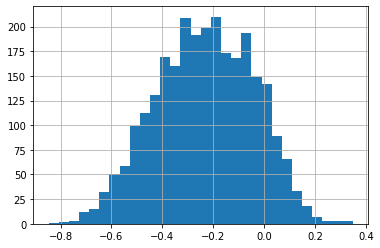

In [23]:
df_an["diff_similarity_humanscore"].hist(bins=30)

## Classification

In [24]:
y = df['similarity_category']
models = [RandomForestClassifier(n_estimators = 40,random_state=41),GradientBoostingClassifier(n_estimators = 40,random_state=41)]

RandomForestClassifier(n_estimators=40, random_state=41)


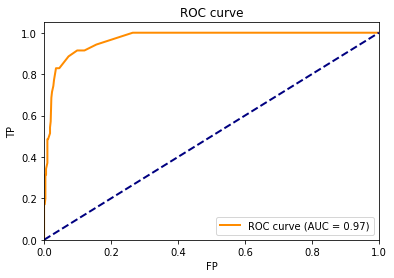

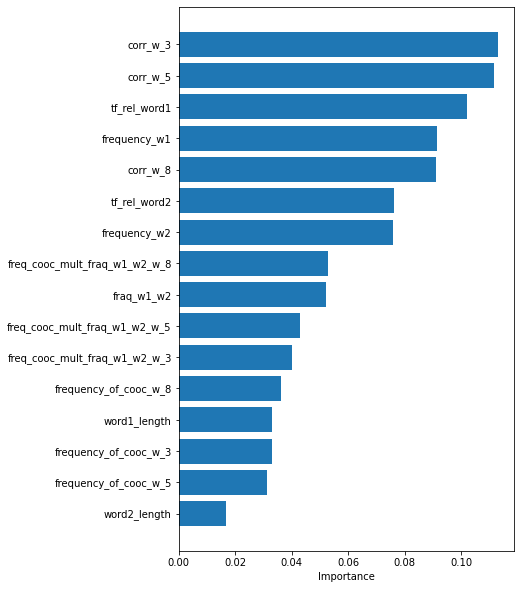

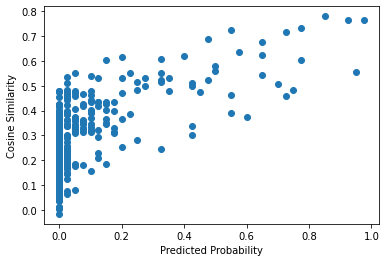

Pearsonův korelační koeficient: 0.6447679606853277
P-hodnota: 6.739665842874076e-65
GradientBoostingClassifier(n_estimators=40, random_state=41)


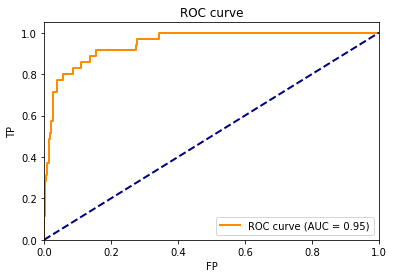

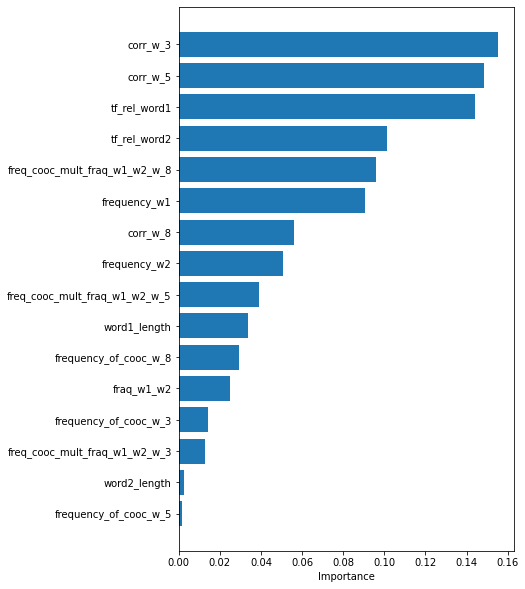

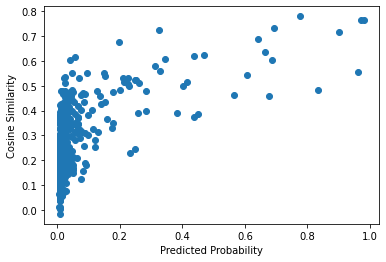

Pearsonův korelační koeficient: 0.5999288292319231
P-hodnota: 3.4478479672796645e-54


In [25]:
for model in models:
    print(model)
    model_functions.class_model_results(y,X_statistical,df,model)

RandomForestClassifier(n_estimators=40, random_state=41)


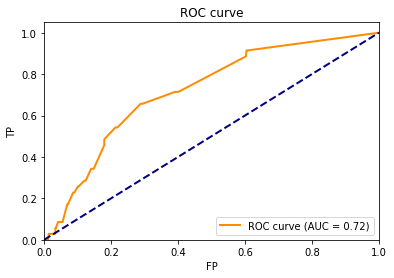

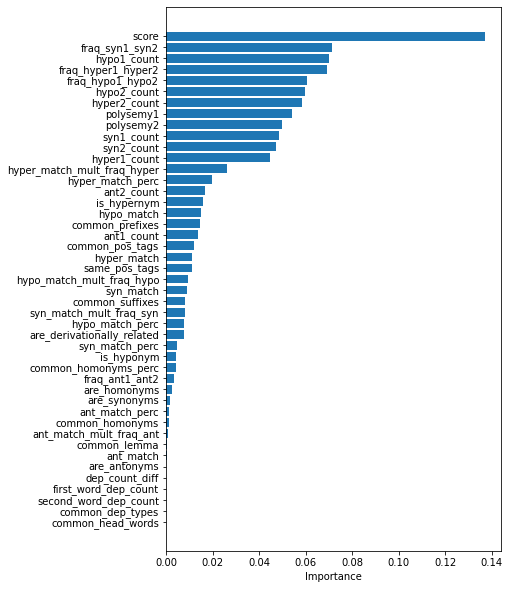

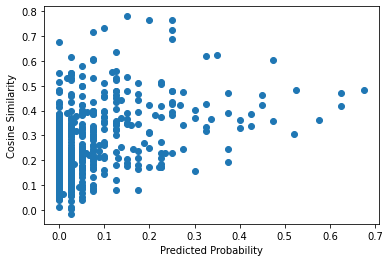

Pearsonův korelační koeficient: 0.3979739181189021
P-hodnota: 5.626622273161869e-22
GradientBoostingClassifier(n_estimators=40, random_state=41)


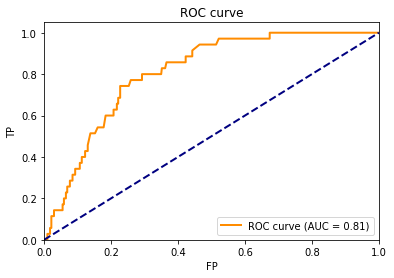

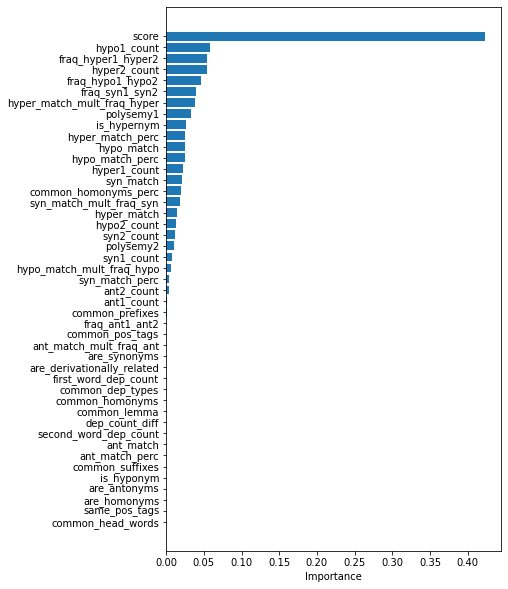

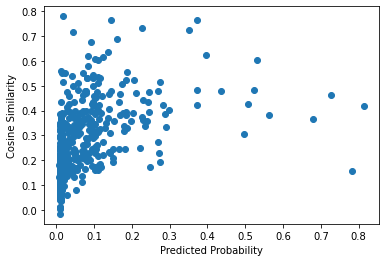

Pearsonův korelační koeficient: 0.4474134674306377
P-hodnota: 5.478638897686385e-28


In [26]:
for model in models:
    print(model)
    model_functions.class_model_results(y,X_lexical,df,model)

RandomForestClassifier(n_estimators=40, random_state=41)


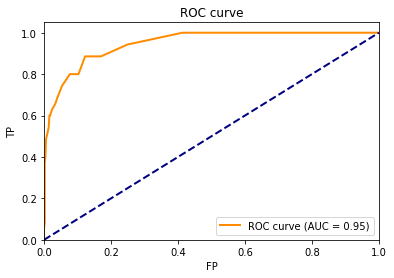

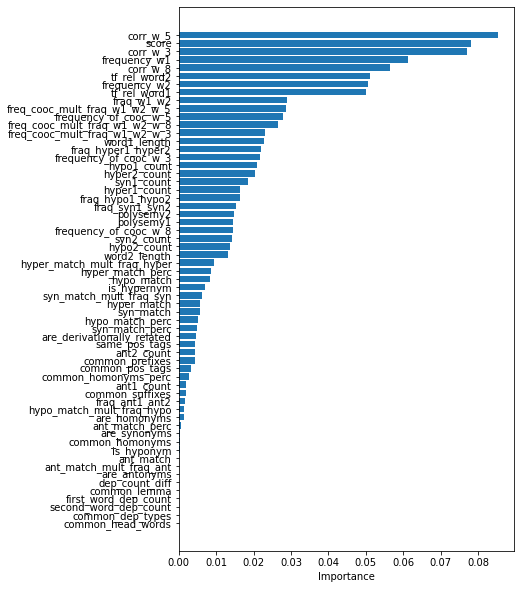

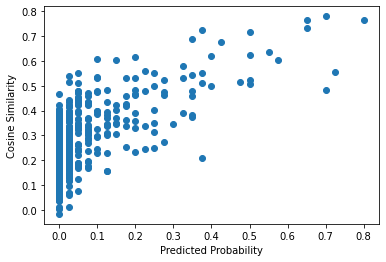

Pearsonův korelační koeficient: 0.6732011313398958
P-hodnota: 1.1263391608025502e-72
GradientBoostingClassifier(n_estimators=40, random_state=41)


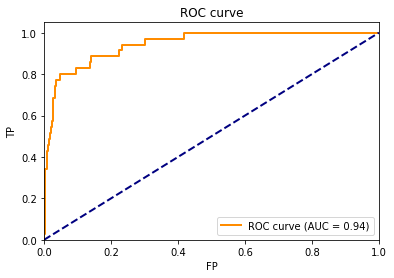

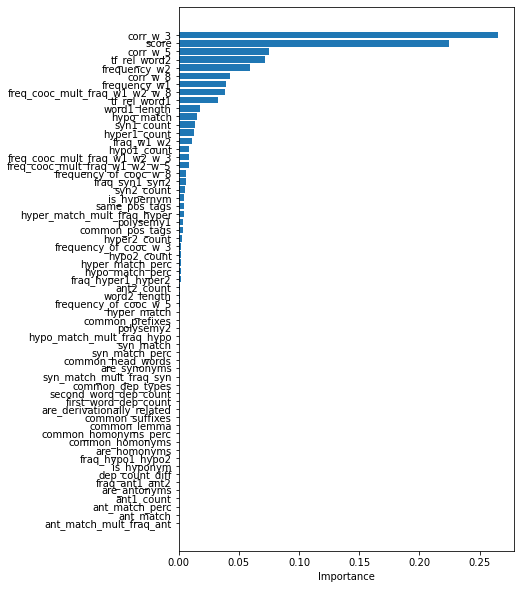

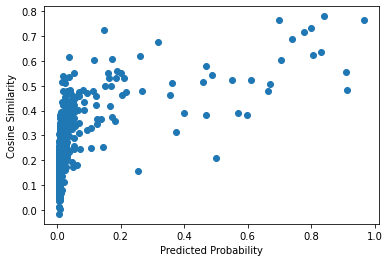

Pearsonův korelační koeficient: 0.5861134149833307
P-hodnota: 3.2065859735757e-51


In [27]:
for model in models:
    print(model)
    model_functions.class_model_results(y,X_all,df,model)

## Regression

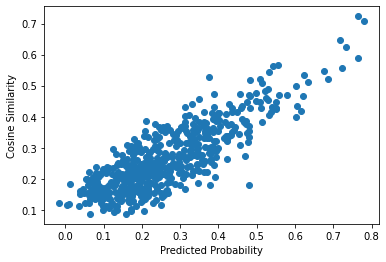

                           Metric     Value
0       Mean Absolute Error (MAE)  0.061108
1        Mean Squared Error (MSE)  0.005889
2  Root Mean Squared Error (RMSE)  0.076738
3                  R-squared (R2)  0.699855
Correlation between y_test, y_pred
         y_test   y_pred
y_test  1.00000  0.83963
y_pred  0.83963  1.00000
Pearsonův korelační koeficient: 0.8396302757933745
P-hodnota: 5.456142238608404e-145


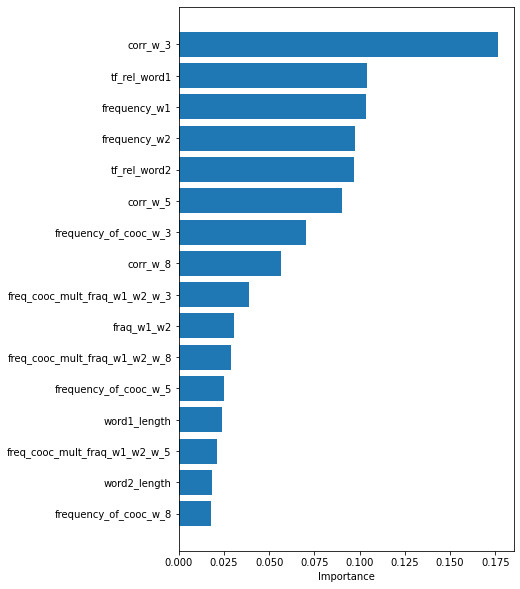

PDP
Plotting partial dependence for feature: corr_w_3


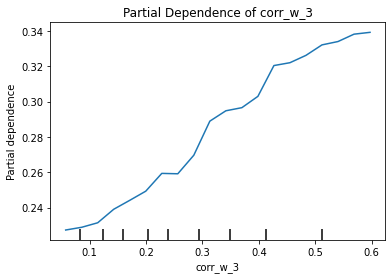

Plotting partial dependence for feature: frequency_of_cooc_w_3


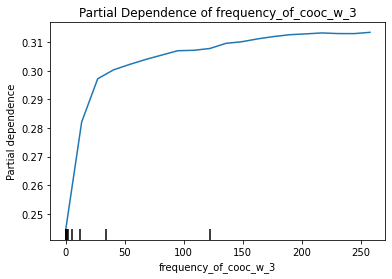

Plotting partial dependence for feature: frequency_of_cooc_w_5


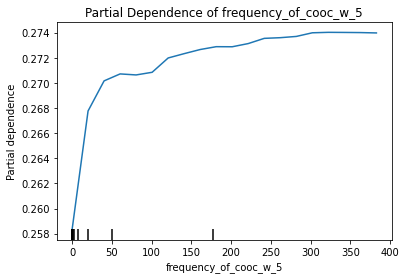

Plotting partial dependence for feature: corr_w_5


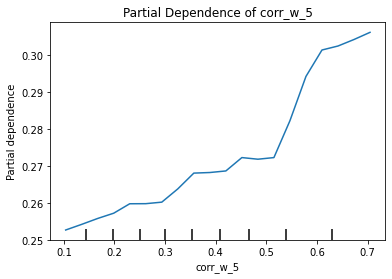

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


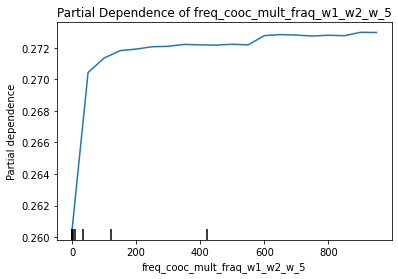

Plotting partial dependence for feature: frequency_of_cooc_w_8


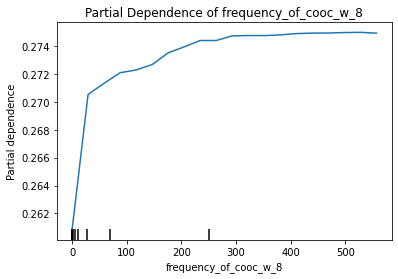

Plotting partial dependence for feature: corr_w_8


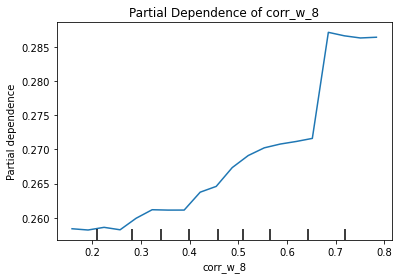

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


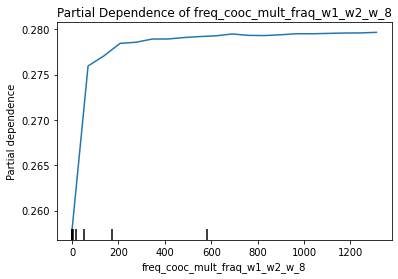

Plotting partial dependence for feature: frequency_w1


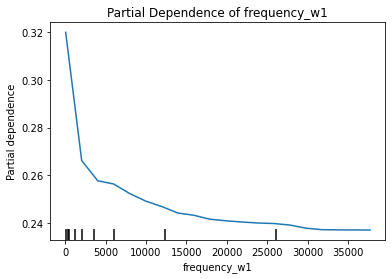

Plotting partial dependence for feature: frequency_w2


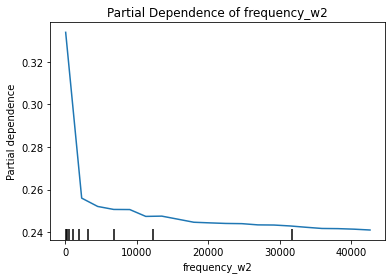

Plotting partial dependence for feature: tf_rel_word1


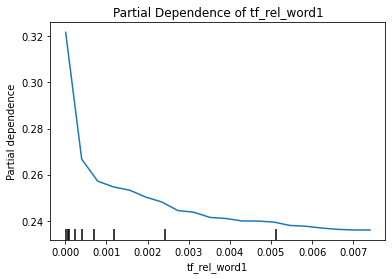

Plotting partial dependence for feature: tf_rel_word2


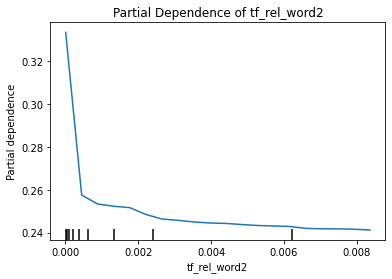

Plotting partial dependence for feature: word1_length


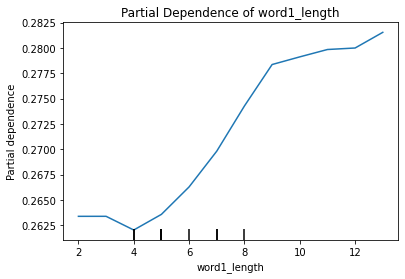

Plotting partial dependence for feature: word2_length


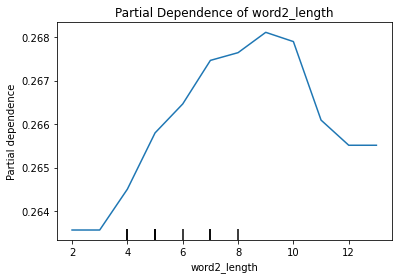

Plotting partial dependence for feature: fraq_w1_w2


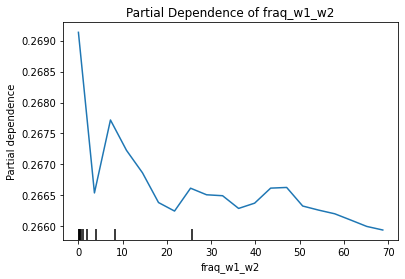

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


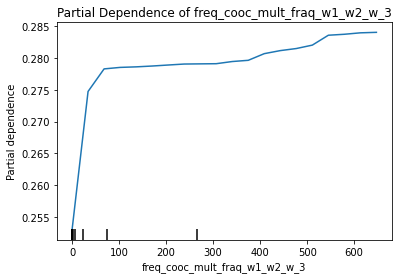

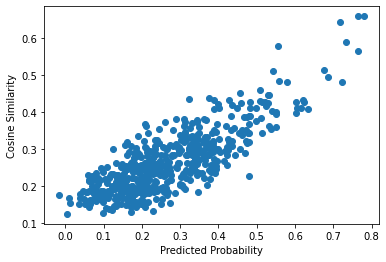

                           Metric     Value
0       Mean Absolute Error (MAE)  0.069692
1        Mean Squared Error (MSE)  0.007291
2  Root Mean Squared Error (RMSE)  0.085390
3                  R-squared (R2)  0.628361
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.819357
y_pred  0.819357  1.000000
Pearsonův korelační koeficient: 0.8193570439873761
P-hodnota: 2.4167448530191252e-132


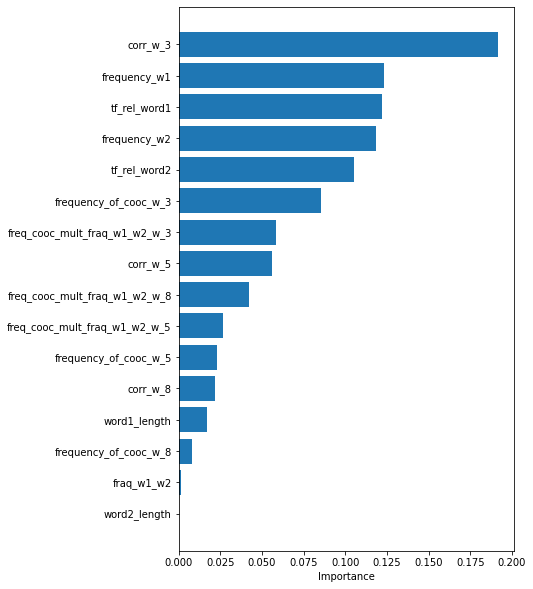

PDP
Plotting partial dependence for feature: corr_w_3


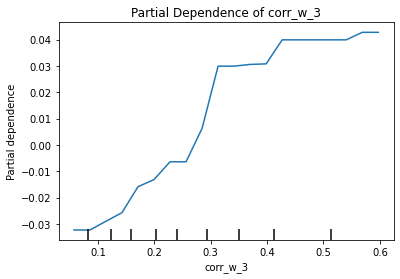

Plotting partial dependence for feature: frequency_of_cooc_w_3


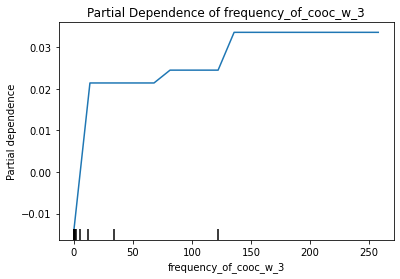

Plotting partial dependence for feature: frequency_of_cooc_w_5


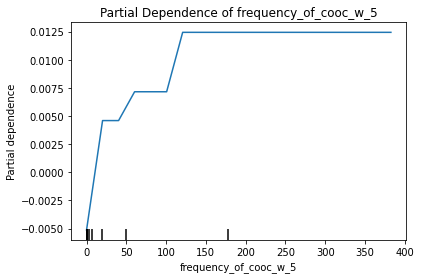

Plotting partial dependence for feature: corr_w_5


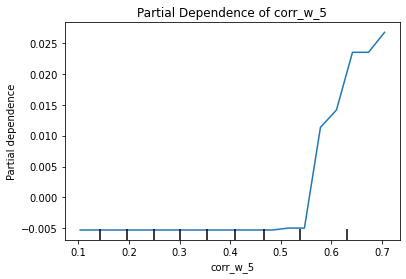

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


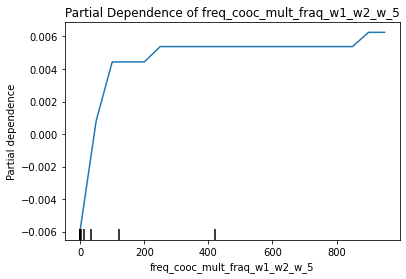

Plotting partial dependence for feature: frequency_of_cooc_w_8


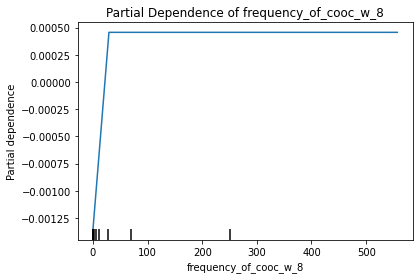

Plotting partial dependence for feature: corr_w_8


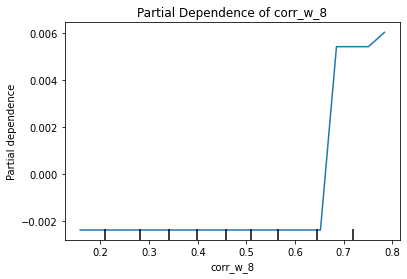

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


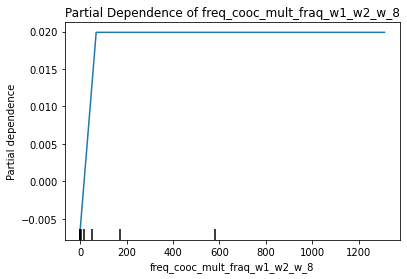

Plotting partial dependence for feature: frequency_w1


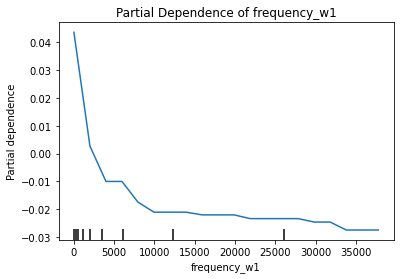

Plotting partial dependence for feature: frequency_w2


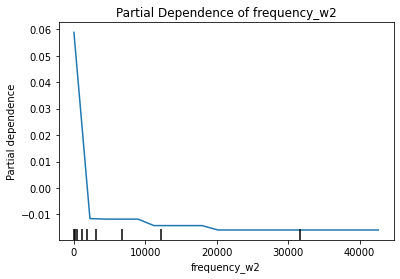

Plotting partial dependence for feature: tf_rel_word1


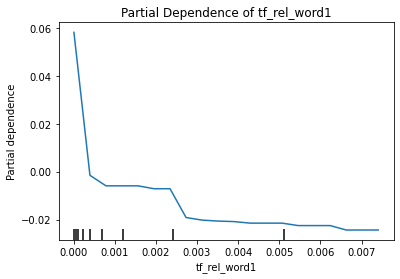

Plotting partial dependence for feature: tf_rel_word2


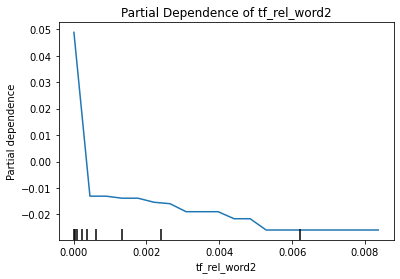

Plotting partial dependence for feature: word1_length


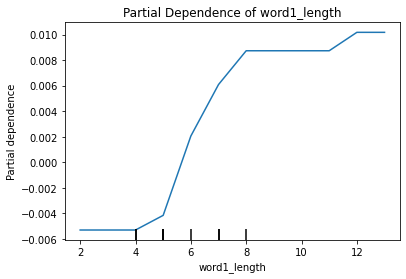

Plotting partial dependence for feature: word2_length


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == 3.506309825818122e-17 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


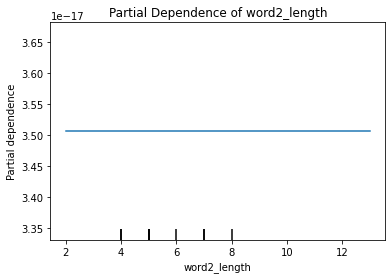

Plotting partial dependence for feature: fraq_w1_w2


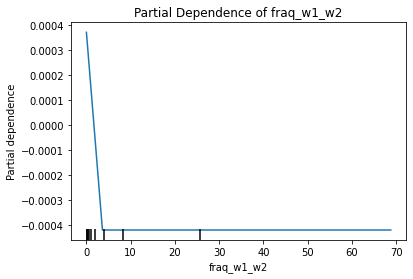

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


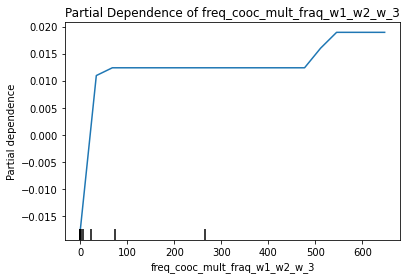

In [28]:
y = df['similarity']
models = [RandomForestRegressor(n_estimators = 40,random_state=42),GradientBoostingRegressor(n_estimators = 40,random_state=42)]
for model in models:
    model_functions.reg_model_results(y,X_statistical,model)

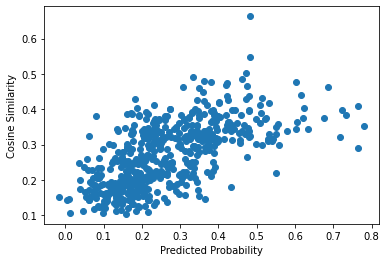

                           Metric     Value
0       Mean Absolute Error (MAE)  0.083871
1        Mean Squared Error (MSE)  0.011916
2  Root Mean Squared Error (RMSE)  0.109161
3                  R-squared (R2)  0.392640
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.628829
y_pred  0.628829  1.000000
Pearsonův korelační koeficient: 0.6288287264390326
P-hodnota: 6.869228378156293e-61


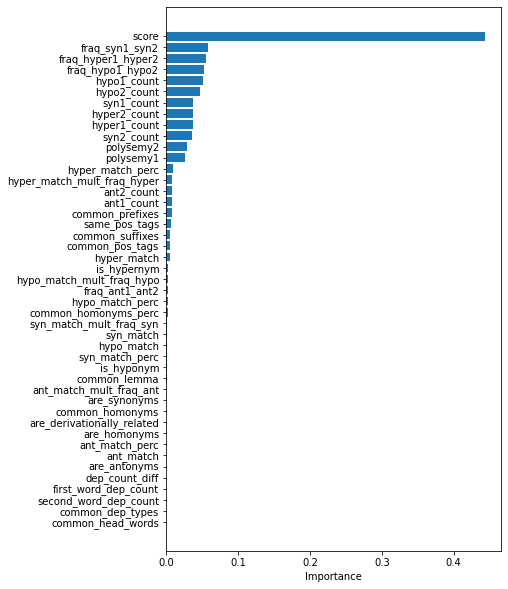

PDP
Plotting partial dependence for feature: score


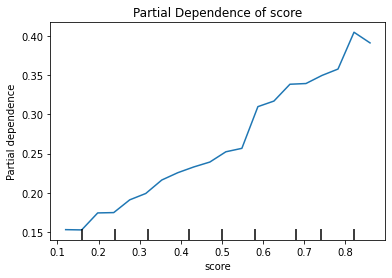

Plotting partial dependence for feature: syn_match


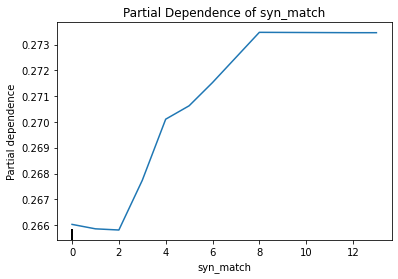

Plotting partial dependence for feature: syn_match_perc
Could not plot partial dependence for feature syn_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: syn1_count


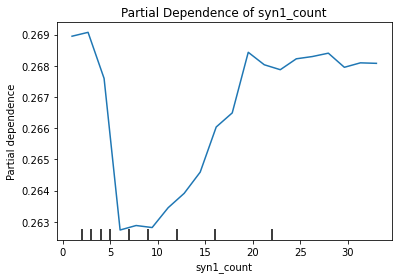

Plotting partial dependence for feature: syn2_count


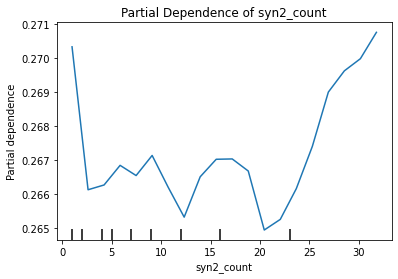

Plotting partial dependence for feature: are_synonyms


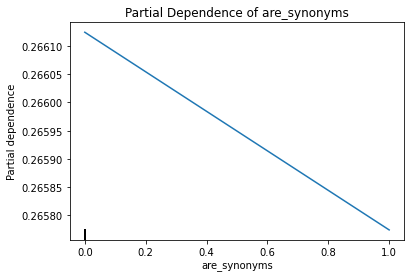

Plotting partial dependence for feature: fraq_syn1_syn2


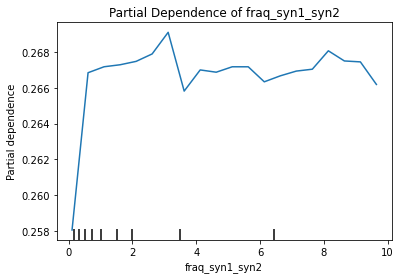

Plotting partial dependence for feature: syn_match_mult_fraq_syn
Could not plot partial dependence for feature syn_match_mult_fraq_syn: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: ant_match


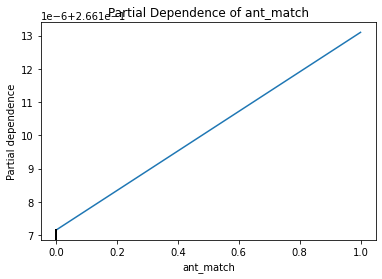

Plotting partial dependence for feature: ant_match_perc


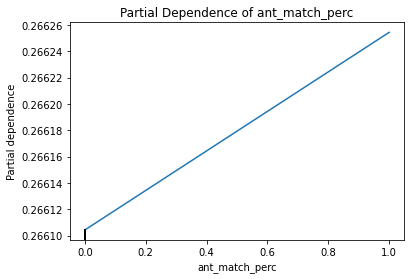

Plotting partial dependence for feature: ant1_count


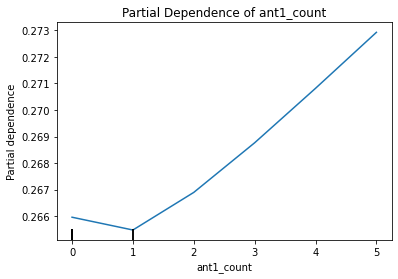

Plotting partial dependence for feature: ant2_count


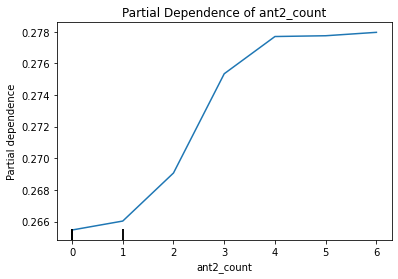

Plotting partial dependence for feature: are_antonyms


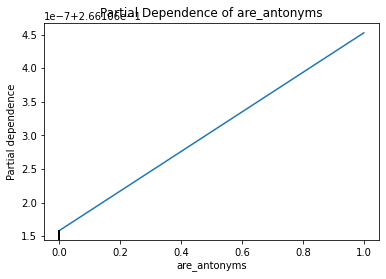

Plotting partial dependence for feature: fraq_ant1_ant2


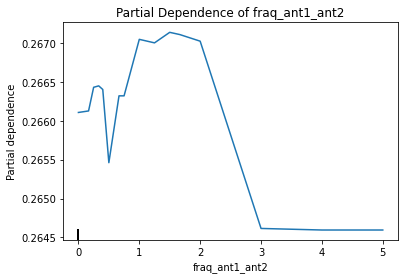

Plotting partial dependence for feature: ant_match_mult_fraq_ant


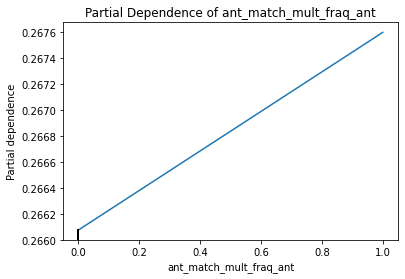

Plotting partial dependence for feature: hypo_match


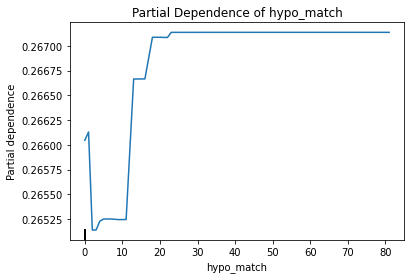

Plotting partial dependence for feature: hypo_match_perc
Could not plot partial dependence for feature hypo_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hypo1_count


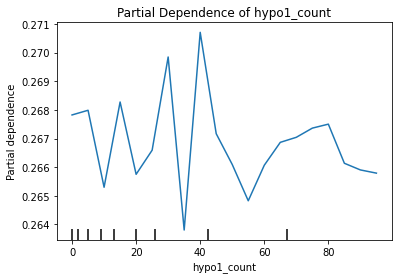

Plotting partial dependence for feature: hypo2_count


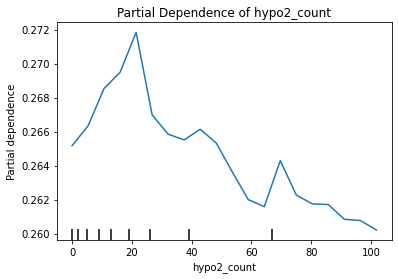

Plotting partial dependence for feature: is_hyponym


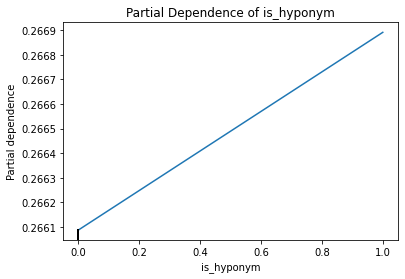

Plotting partial dependence for feature: fraq_hypo1_hypo2


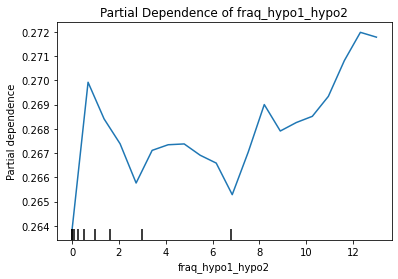

Plotting partial dependence for feature: hypo_match_mult_fraq_hypo
Could not plot partial dependence for feature hypo_match_mult_fraq_hypo: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hyper_match


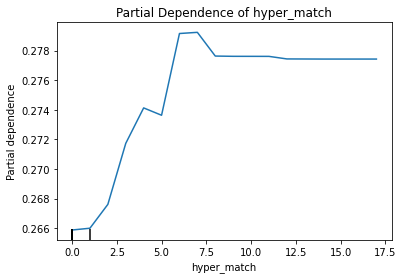

Plotting partial dependence for feature: hyper_match_perc


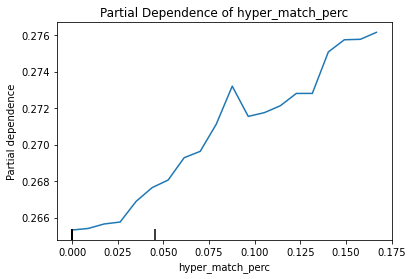

Plotting partial dependence for feature: hyper1_count


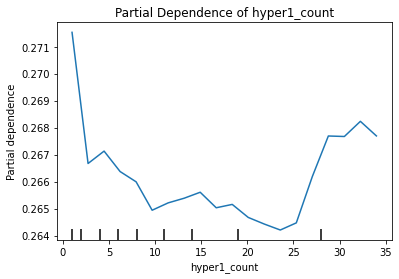

Plotting partial dependence for feature: hyper2_count


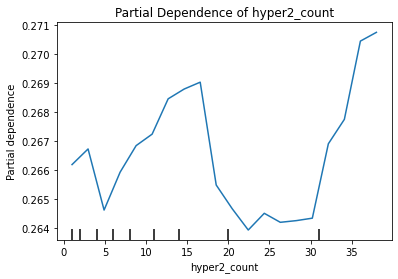

Plotting partial dependence for feature: is_hypernym


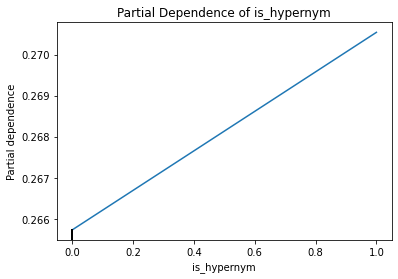

Plotting partial dependence for feature: fraq_hyper1_hyper2


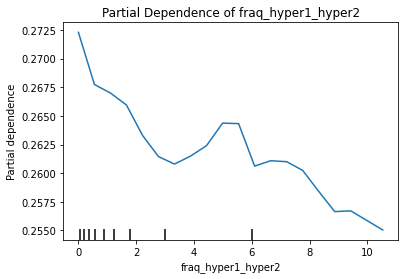

Plotting partial dependence for feature: hyper_match_mult_fraq_hyper


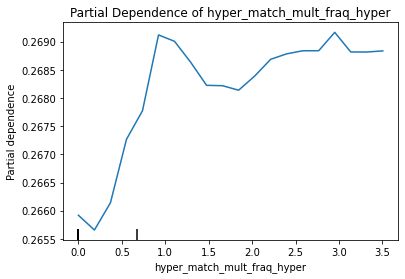

Plotting partial dependence for feature: polysemy1


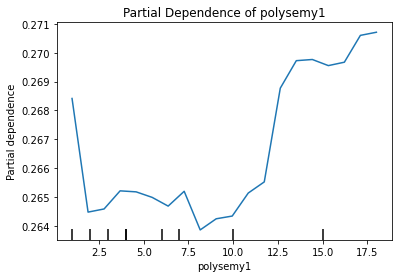

Plotting partial dependence for feature: polysemy2


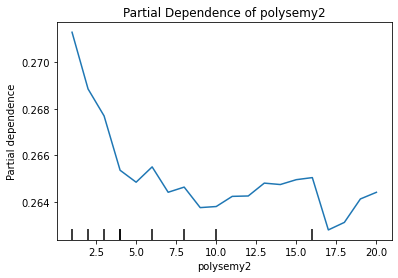

Plotting partial dependence for feature: are_homonyms


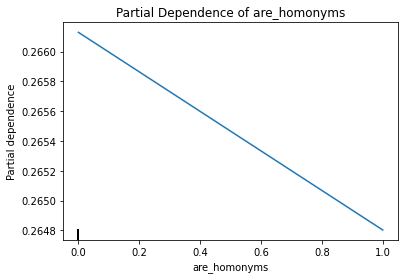

Plotting partial dependence for feature: common_homonyms


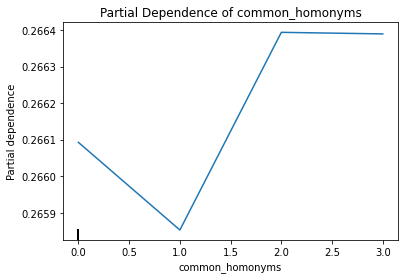

Plotting partial dependence for feature: common_homonyms_perc
Could not plot partial dependence for feature common_homonyms_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: common_lemma


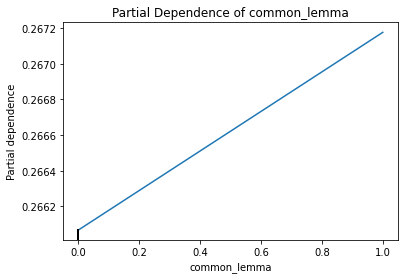

Plotting partial dependence for feature: common_prefixes


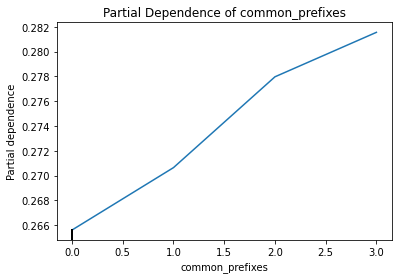

Plotting partial dependence for feature: common_suffixes


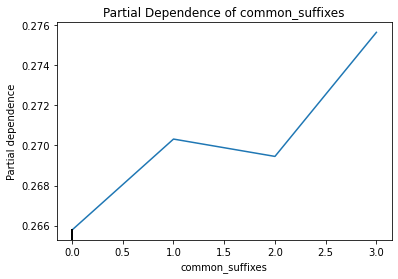

Plotting partial dependence for feature: are_derivationally_related


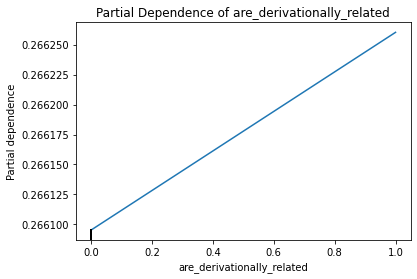

Plotting partial dependence for feature: common_pos_tags


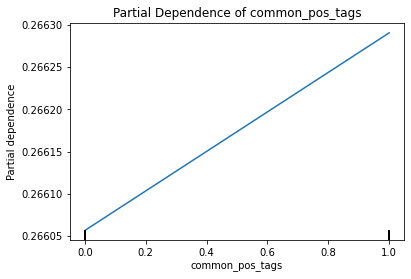

Plotting partial dependence for feature: same_pos_tags


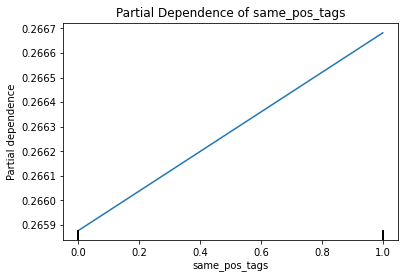

Plotting partial dependence for feature: first_word_dep_count


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == 0.2661074644187876 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


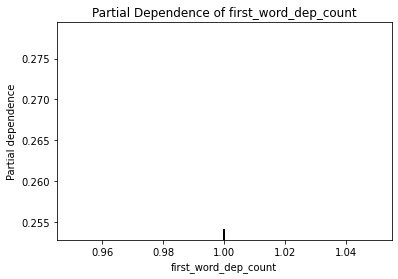

Plotting partial dependence for feature: second_word_dep_count


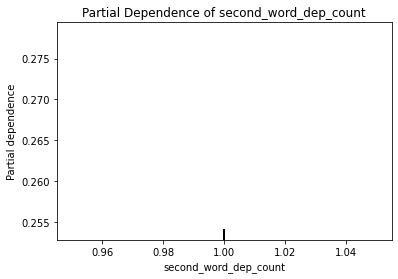

Plotting partial dependence for feature: common_dep_types


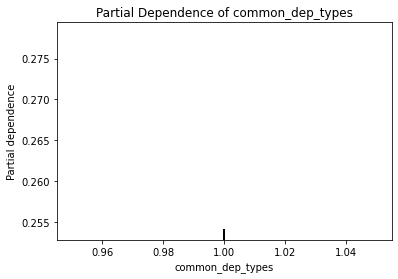

Plotting partial dependence for feature: dep_count_diff


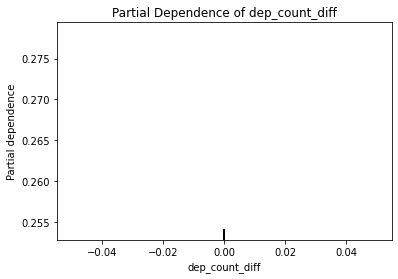

Plotting partial dependence for feature: common_head_words


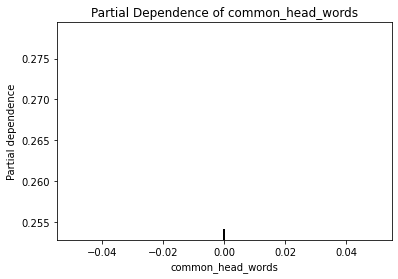

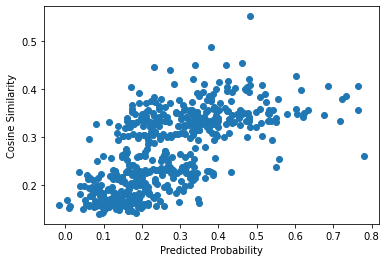

                           Metric     Value
0       Mean Absolute Error (MAE)  0.080907
1        Mean Squared Error (MSE)  0.011417
2  Root Mean Squared Error (RMSE)  0.106848
3                  R-squared (R2)  0.418105
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.651555
y_pred  0.651555  1.000000
Pearsonův korelační koeficient: 0.6515546634855989
P-hodnota: 1.11777018825838e-66


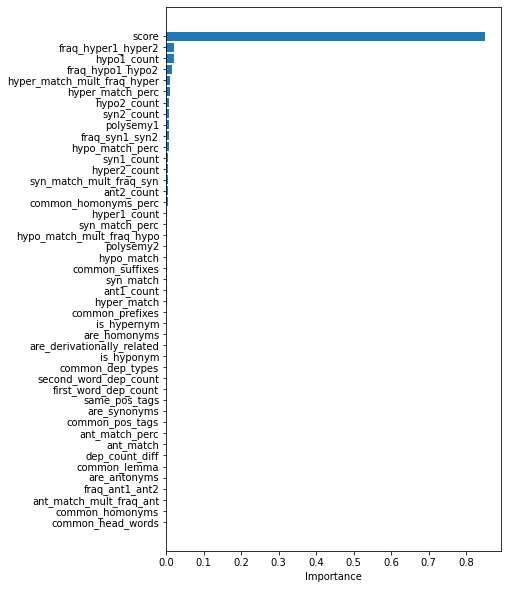

PDP
Plotting partial dependence for feature: score


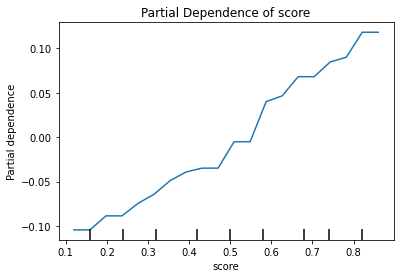

Plotting partial dependence for feature: syn_match


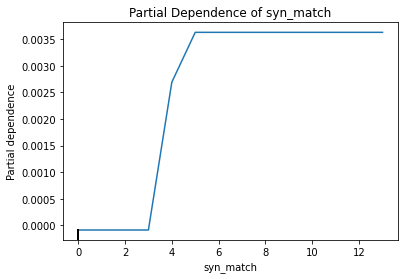

Plotting partial dependence for feature: syn_match_perc
Could not plot partial dependence for feature syn_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: syn1_count


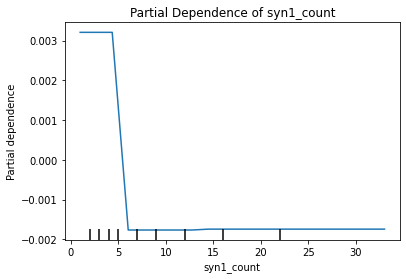

Plotting partial dependence for feature: syn2_count


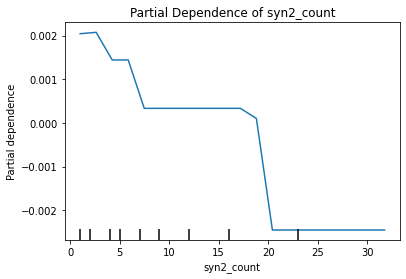

Plotting partial dependence for feature: are_synonyms


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == -7.276351830093341e-18 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


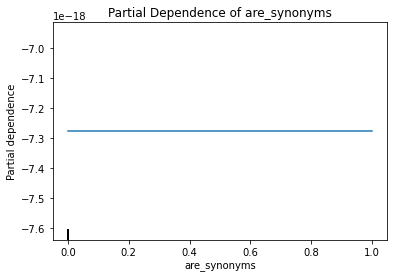

Plotting partial dependence for feature: fraq_syn1_syn2


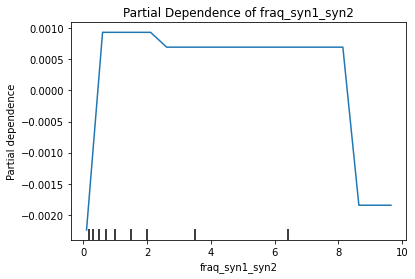

Plotting partial dependence for feature: syn_match_mult_fraq_syn
Could not plot partial dependence for feature syn_match_mult_fraq_syn: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: ant_match


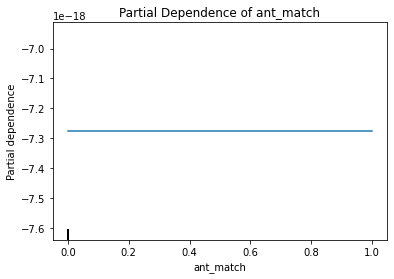

Plotting partial dependence for feature: ant_match_perc


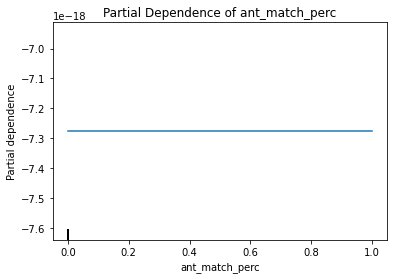

Plotting partial dependence for feature: ant1_count


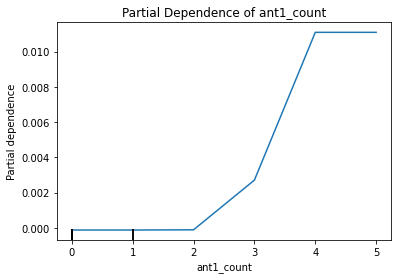

Plotting partial dependence for feature: ant2_count


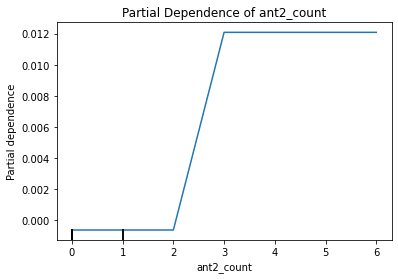

Plotting partial dependence for feature: are_antonyms


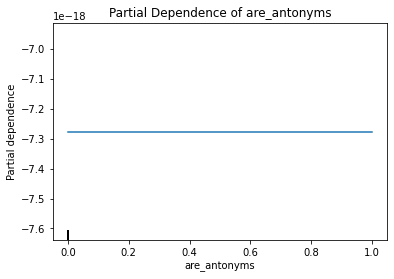

Plotting partial dependence for feature: fraq_ant1_ant2


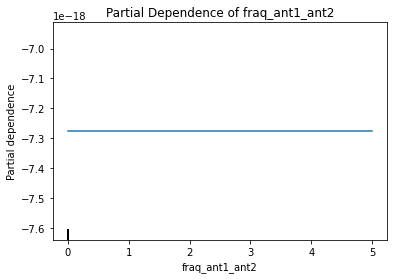

Plotting partial dependence for feature: ant_match_mult_fraq_ant


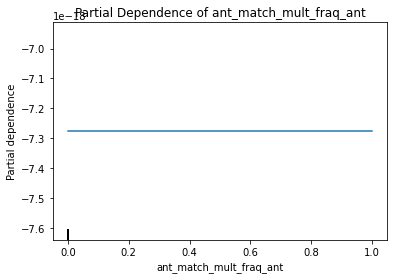

Plotting partial dependence for feature: hypo_match


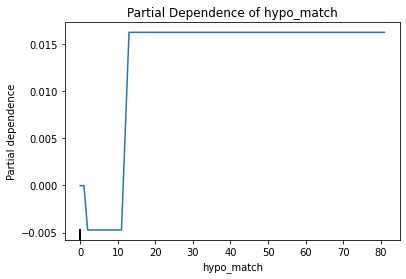

Plotting partial dependence for feature: hypo_match_perc
Could not plot partial dependence for feature hypo_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hypo1_count


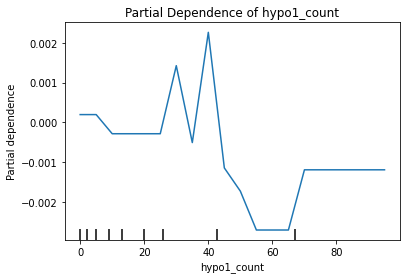

Plotting partial dependence for feature: hypo2_count


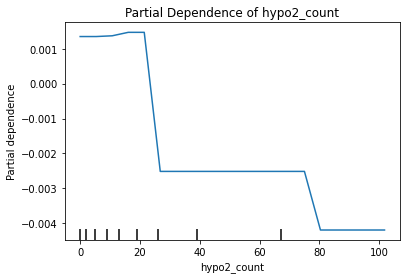

Plotting partial dependence for feature: is_hyponym


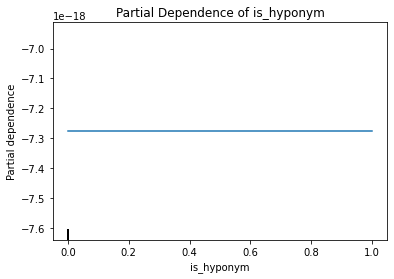

Plotting partial dependence for feature: fraq_hypo1_hypo2


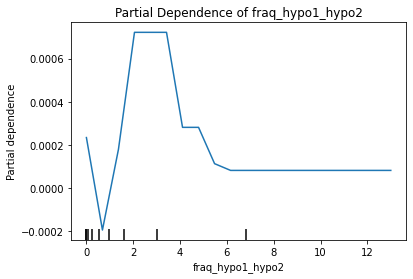

Plotting partial dependence for feature: hypo_match_mult_fraq_hypo
Could not plot partial dependence for feature hypo_match_mult_fraq_hypo: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hyper_match


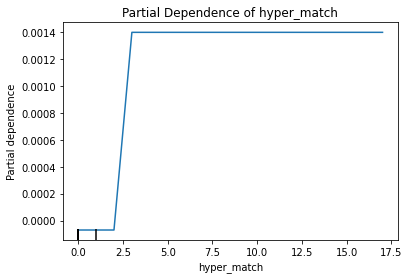

Plotting partial dependence for feature: hyper_match_perc


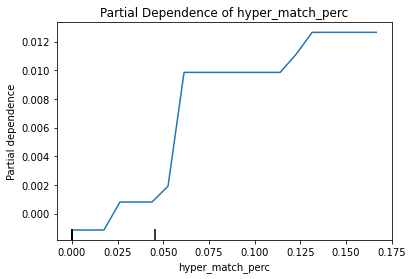

Plotting partial dependence for feature: hyper1_count


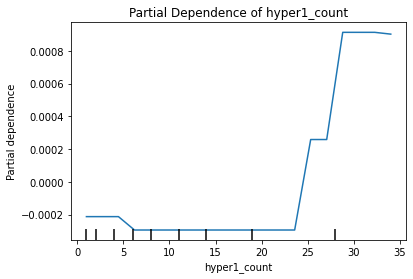

Plotting partial dependence for feature: hyper2_count


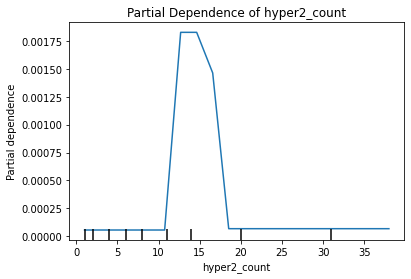

Plotting partial dependence for feature: is_hypernym


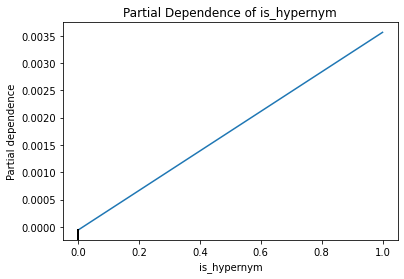

Plotting partial dependence for feature: fraq_hyper1_hyper2


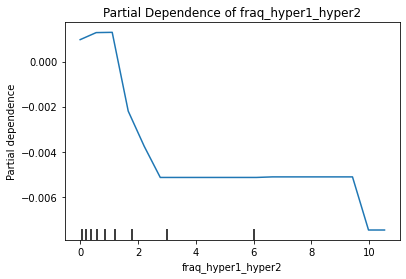

Plotting partial dependence for feature: hyper_match_mult_fraq_hyper


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == -9.322191486303425e-05 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


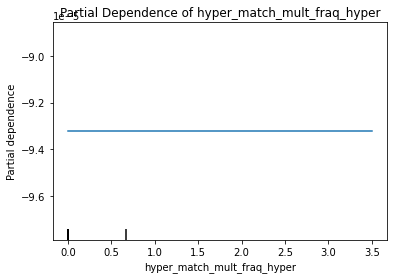

Plotting partial dependence for feature: polysemy1


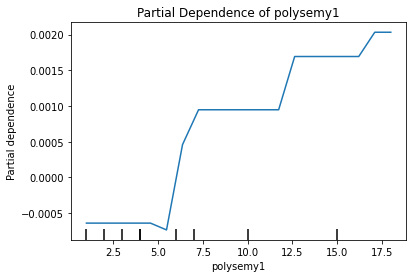

Plotting partial dependence for feature: polysemy2


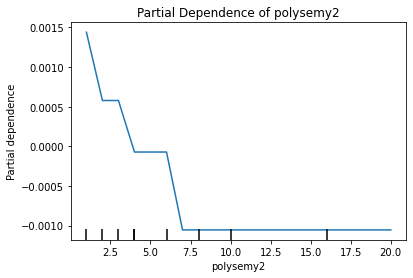

Plotting partial dependence for feature: are_homonyms


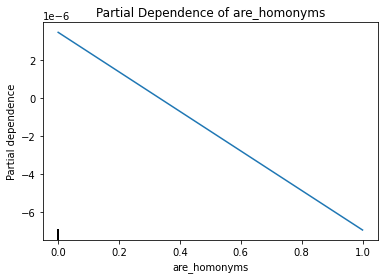

Plotting partial dependence for feature: common_homonyms


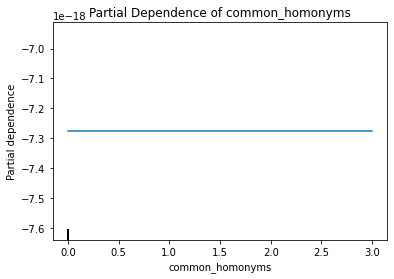

Plotting partial dependence for feature: common_homonyms_perc
Could not plot partial dependence for feature common_homonyms_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: common_lemma


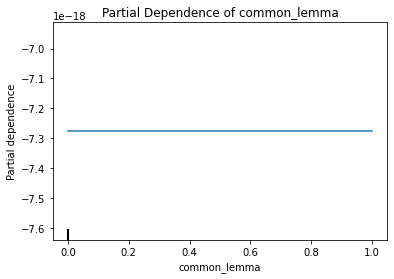

Plotting partial dependence for feature: common_prefixes


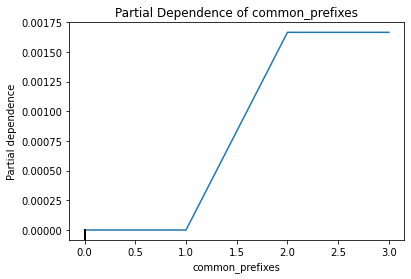

Plotting partial dependence for feature: common_suffixes


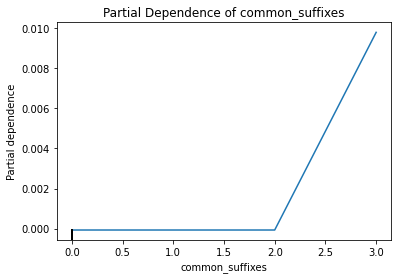

Plotting partial dependence for feature: are_derivationally_related


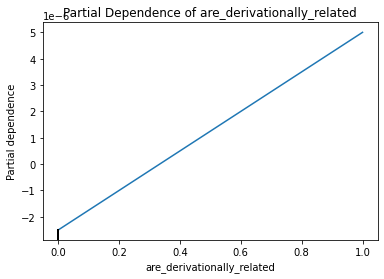

Plotting partial dependence for feature: common_pos_tags


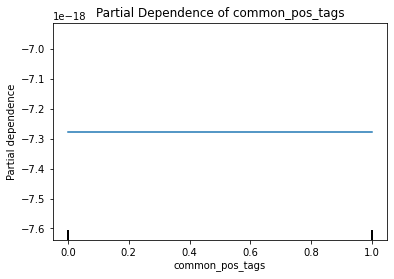

Plotting partial dependence for feature: same_pos_tags


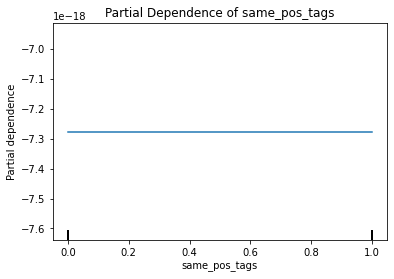

Plotting partial dependence for feature: first_word_dep_count


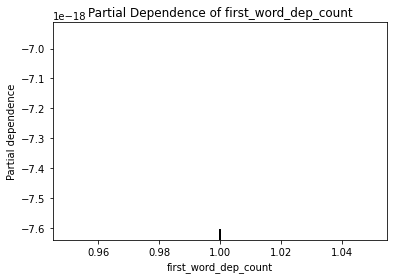

Plotting partial dependence for feature: second_word_dep_count


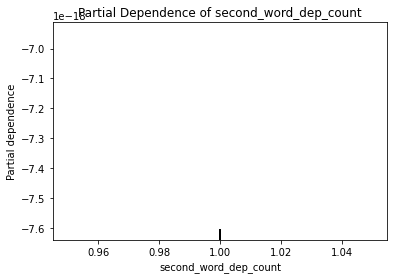

Plotting partial dependence for feature: common_dep_types


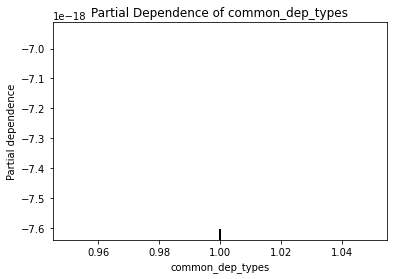

Plotting partial dependence for feature: dep_count_diff


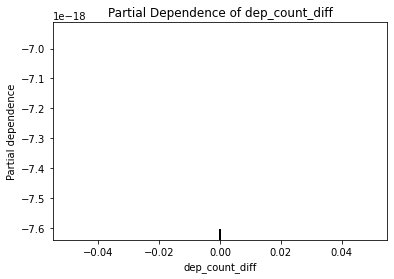

Plotting partial dependence for feature: common_head_words


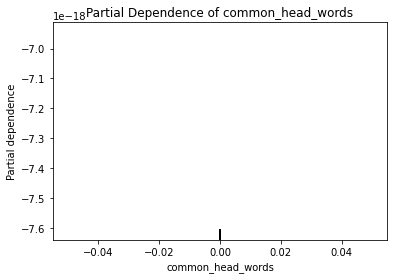

In [29]:
for model in models:
    model_functions.reg_model_results(y,X_lexical,model)

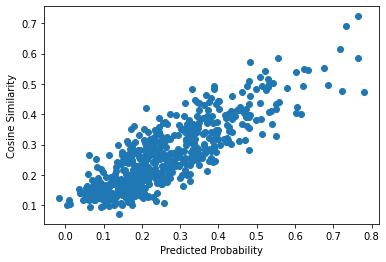

                           Metric     Value
0       Mean Absolute Error (MAE)  0.061499
1        Mean Squared Error (MSE)  0.005856
2  Root Mean Squared Error (RMSE)  0.076525
3                  R-squared (R2)  0.701521
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.839672
y_pred  0.839672  1.000000
Pearsonův korelační koeficient: 0.8396716955904521
P-hodnota: 5.1199573084602955e-145


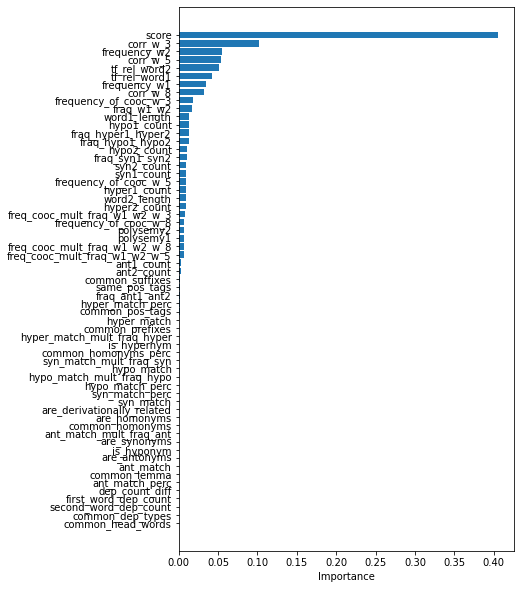

PDP
Plotting partial dependence for feature: corr_w_3


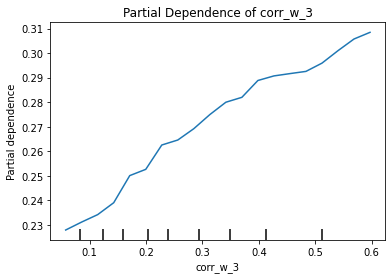

Plotting partial dependence for feature: frequency_of_cooc_w_3


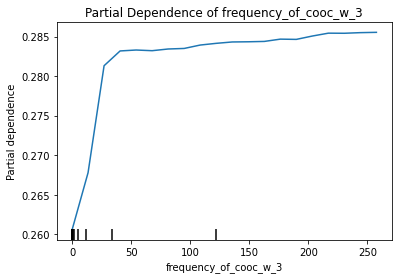

Plotting partial dependence for feature: frequency_of_cooc_w_5


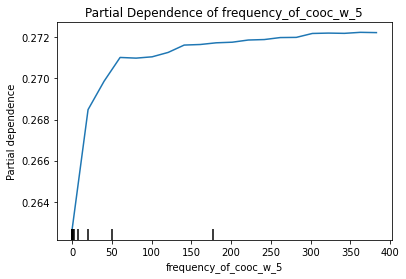

Plotting partial dependence for feature: corr_w_5


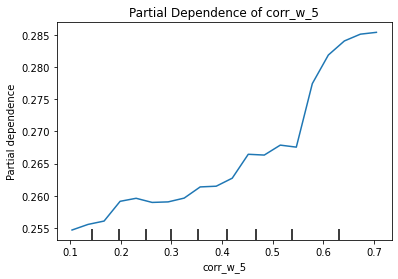

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


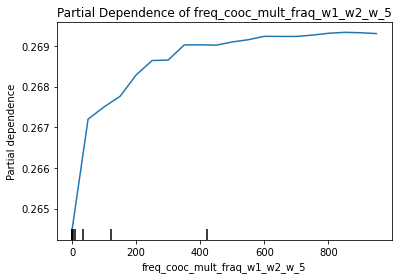

Plotting partial dependence for feature: frequency_of_cooc_w_8


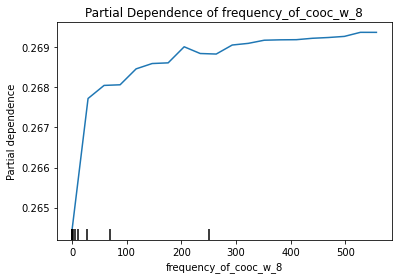

Plotting partial dependence for feature: corr_w_8


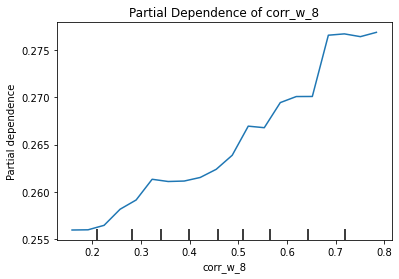

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


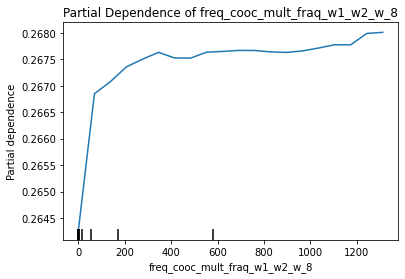

Plotting partial dependence for feature: frequency_w1


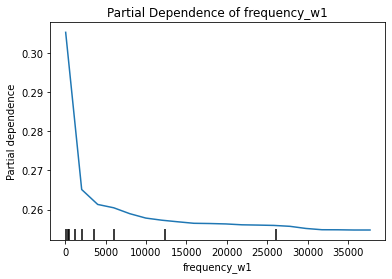

Plotting partial dependence for feature: frequency_w2


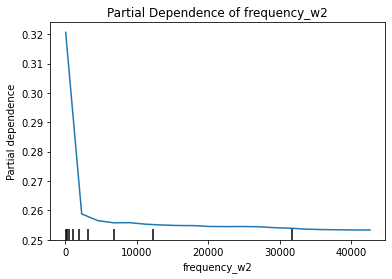

Plotting partial dependence for feature: tf_rel_word1


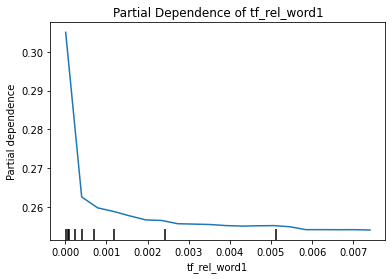

Plotting partial dependence for feature: tf_rel_word2


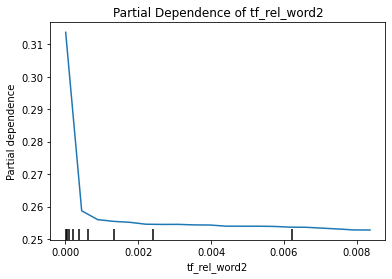

Plotting partial dependence for feature: word1_length


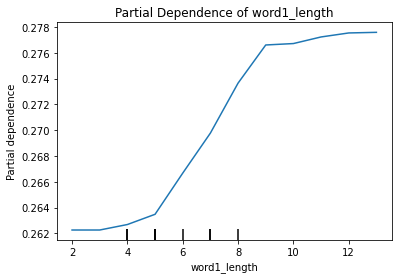

Plotting partial dependence for feature: word2_length


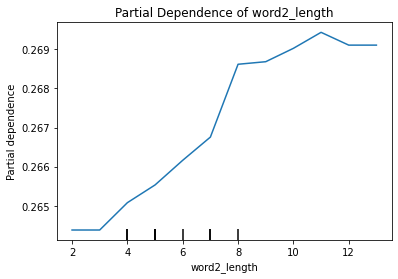

Plotting partial dependence for feature: fraq_w1_w2


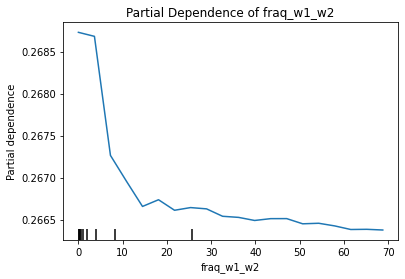

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


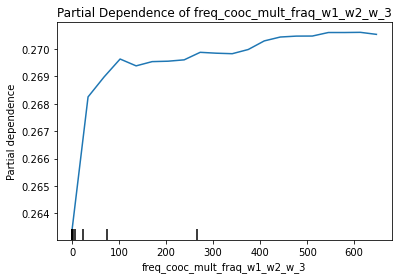

Plotting partial dependence for feature: score


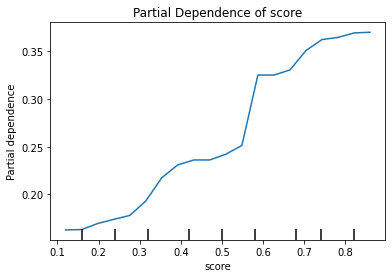

Plotting partial dependence for feature: syn_match


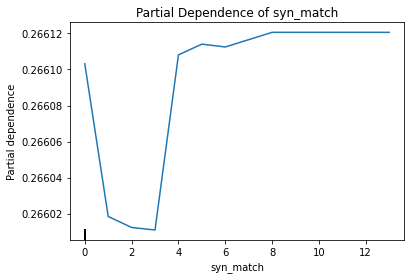

Plotting partial dependence for feature: syn_match_perc
Could not plot partial dependence for feature syn_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: syn1_count


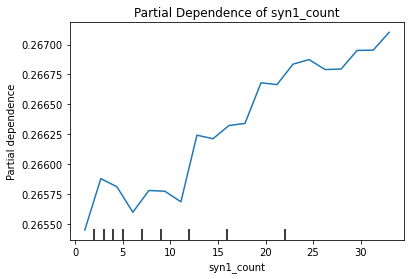

Plotting partial dependence for feature: syn2_count


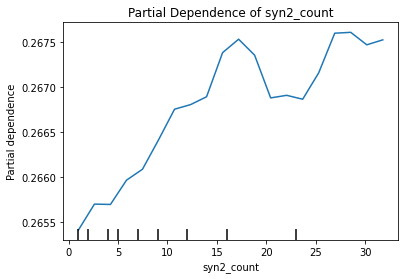

Plotting partial dependence for feature: are_synonyms


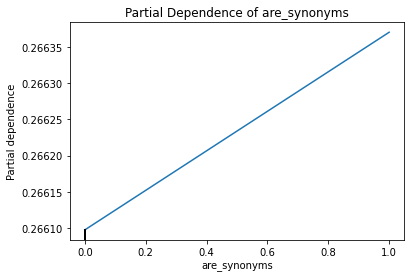

Plotting partial dependence for feature: fraq_syn1_syn2


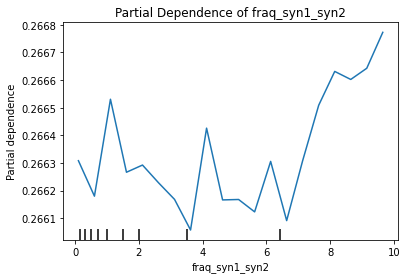

Plotting partial dependence for feature: syn_match_mult_fraq_syn
Could not plot partial dependence for feature syn_match_mult_fraq_syn: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: ant_match


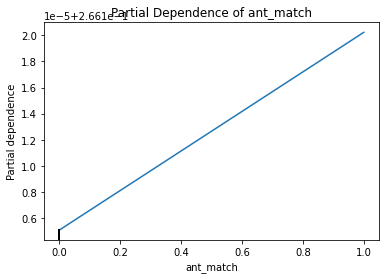

Plotting partial dependence for feature: ant_match_perc


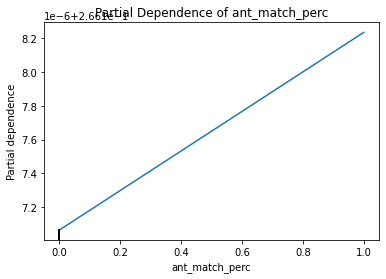

Plotting partial dependence for feature: ant1_count


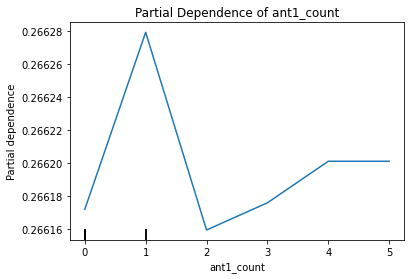

Plotting partial dependence for feature: ant2_count


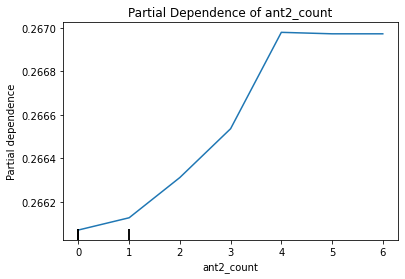

Plotting partial dependence for feature: are_antonyms


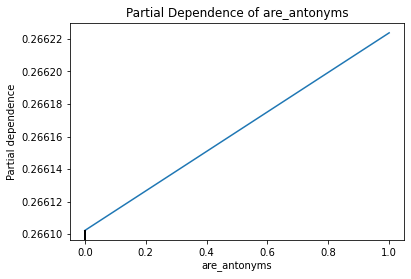

Plotting partial dependence for feature: fraq_ant1_ant2


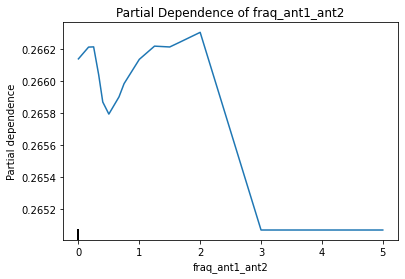

Plotting partial dependence for feature: ant_match_mult_fraq_ant


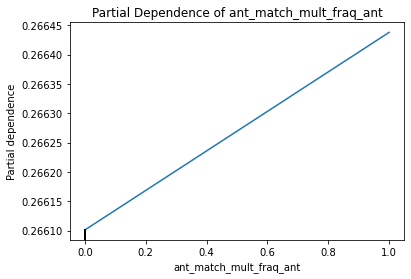

Plotting partial dependence for feature: hypo_match


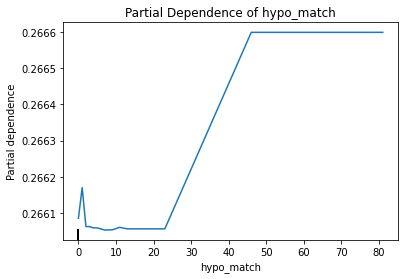

Plotting partial dependence for feature: hypo_match_perc
Could not plot partial dependence for feature hypo_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hypo1_count


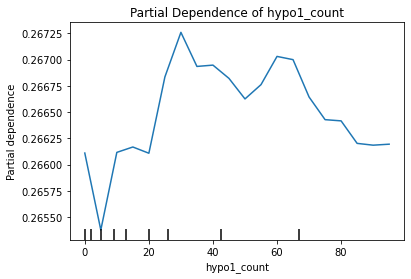

Plotting partial dependence for feature: hypo2_count


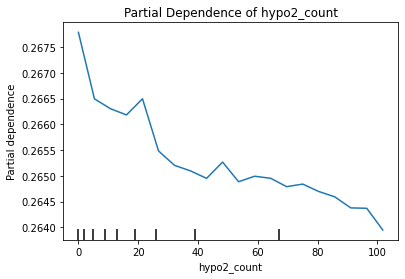

Plotting partial dependence for feature: is_hyponym


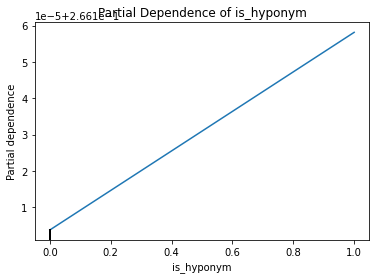

Plotting partial dependence for feature: fraq_hypo1_hypo2


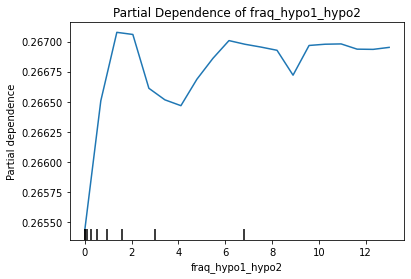

Plotting partial dependence for feature: hypo_match_mult_fraq_hypo
Could not plot partial dependence for feature hypo_match_mult_fraq_hypo: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hyper_match


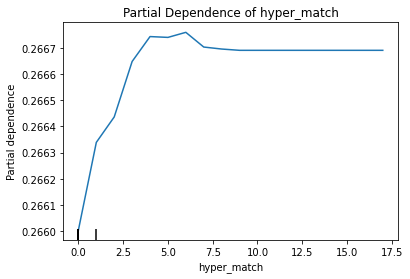

Plotting partial dependence for feature: hyper_match_perc


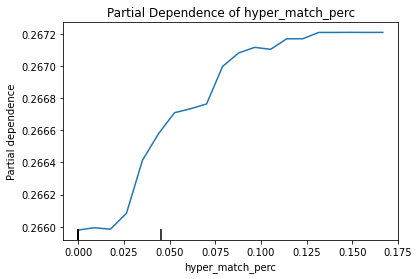

Plotting partial dependence for feature: hyper1_count


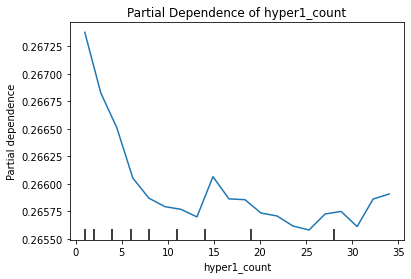

Plotting partial dependence for feature: hyper2_count


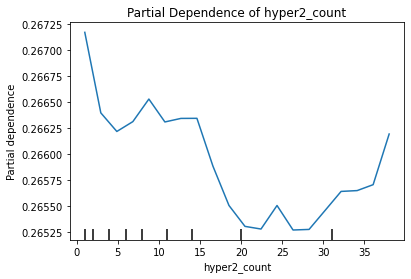

Plotting partial dependence for feature: is_hypernym


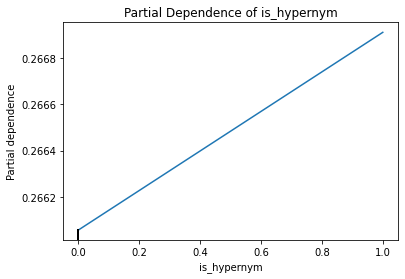

Plotting partial dependence for feature: fraq_hyper1_hyper2


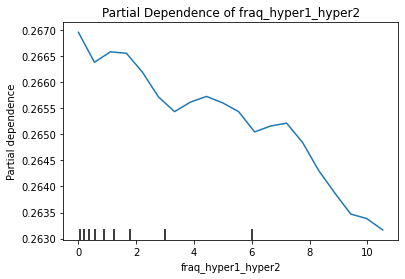

Plotting partial dependence for feature: hyper_match_mult_fraq_hyper


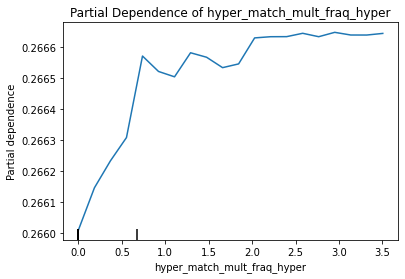

Plotting partial dependence for feature: polysemy1


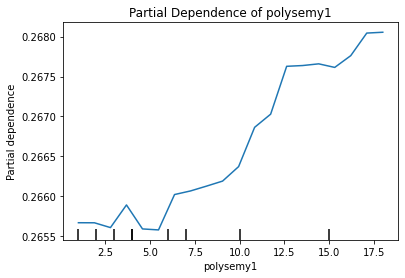

Plotting partial dependence for feature: polysemy2


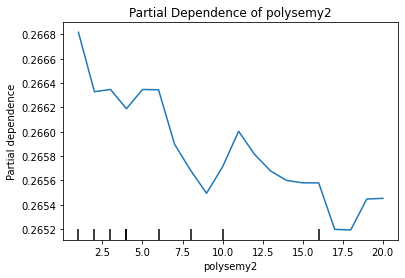

Plotting partial dependence for feature: are_homonyms


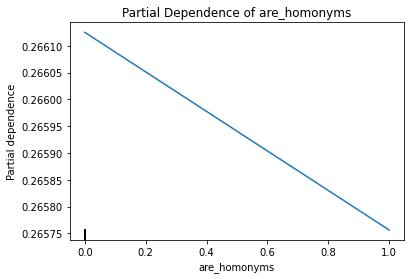

Plotting partial dependence for feature: common_homonyms


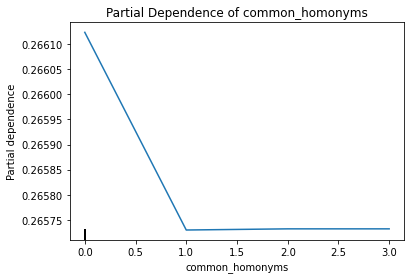

Plotting partial dependence for feature: common_homonyms_perc
Could not plot partial dependence for feature common_homonyms_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: common_lemma


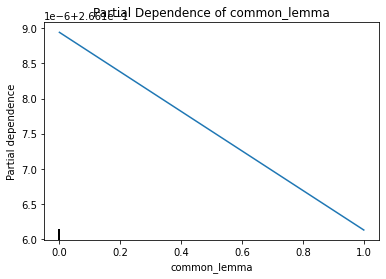

Plotting partial dependence for feature: common_prefixes


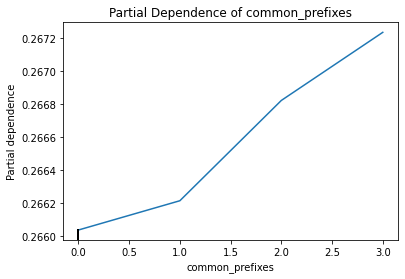

Plotting partial dependence for feature: common_suffixes


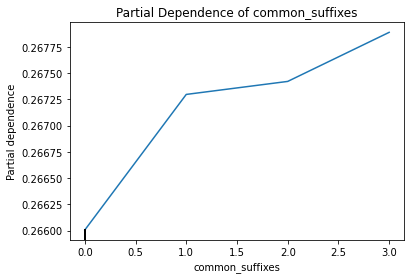

Plotting partial dependence for feature: are_derivationally_related


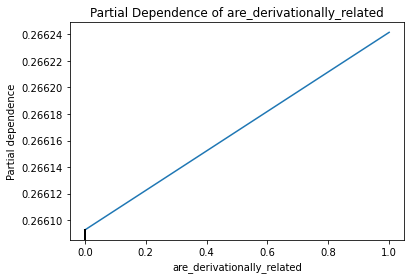

Plotting partial dependence for feature: common_pos_tags


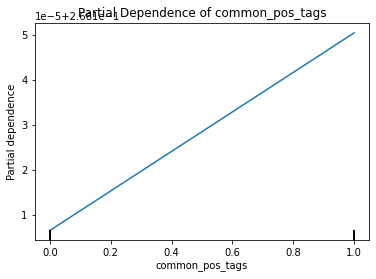

Plotting partial dependence for feature: same_pos_tags


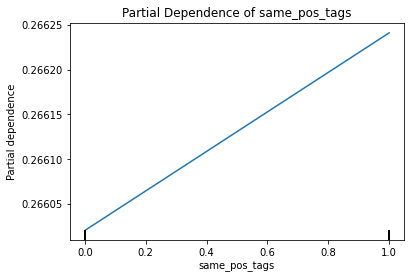

Plotting partial dependence for feature: first_word_dep_count


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == 0.2661074644187871 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


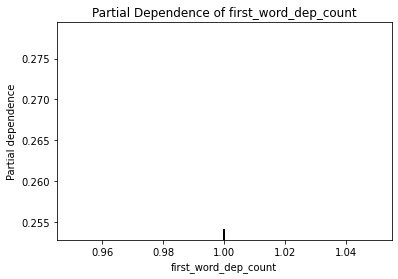

Plotting partial dependence for feature: second_word_dep_count


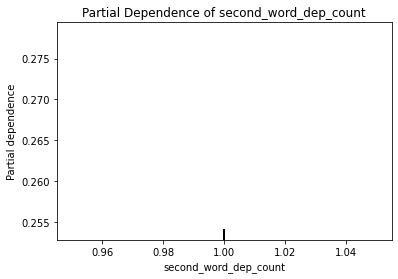

Plotting partial dependence for feature: common_dep_types


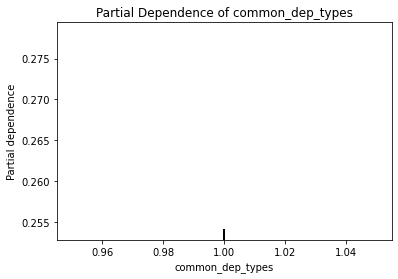

Plotting partial dependence for feature: dep_count_diff


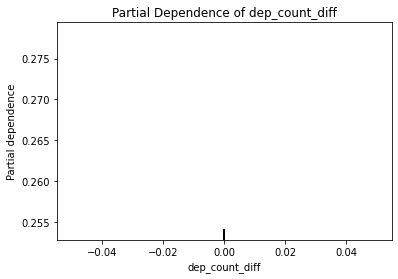

Plotting partial dependence for feature: common_head_words


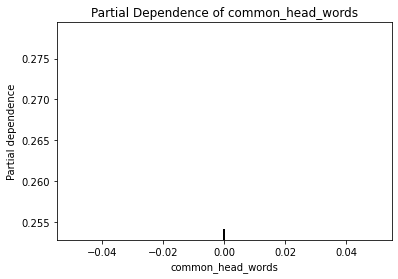

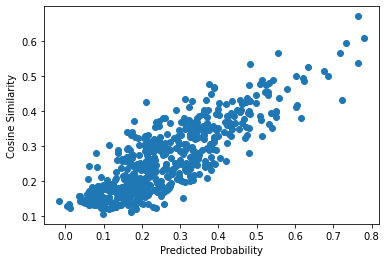

                           Metric     Value
0       Mean Absolute Error (MAE)  0.063275
1        Mean Squared Error (MSE)  0.006213
2  Root Mean Squared Error (RMSE)  0.078825
3                  R-squared (R2)  0.683304
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.834804
y_pred  0.834804  1.000000
Pearsonův korelační koeficient: 0.8348041140819471
P-hodnota: 7.984147403636583e-142


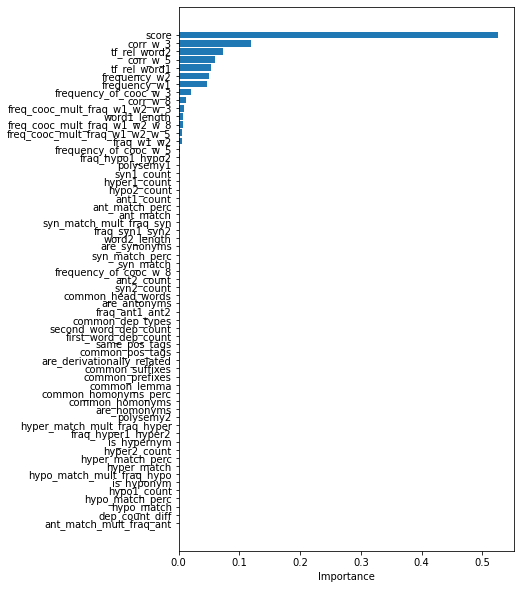

PDP
Plotting partial dependence for feature: corr_w_3


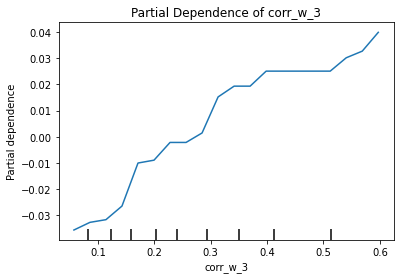

Plotting partial dependence for feature: frequency_of_cooc_w_3


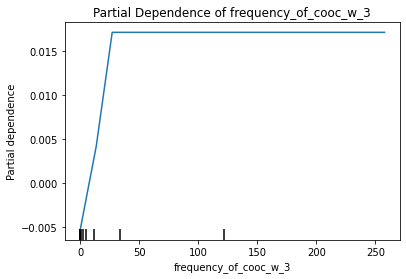

Plotting partial dependence for feature: frequency_of_cooc_w_5


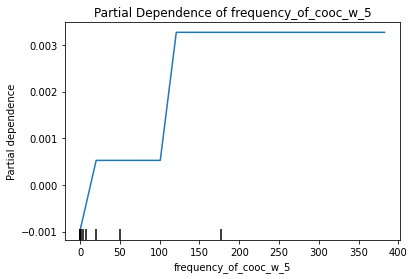

Plotting partial dependence for feature: corr_w_5


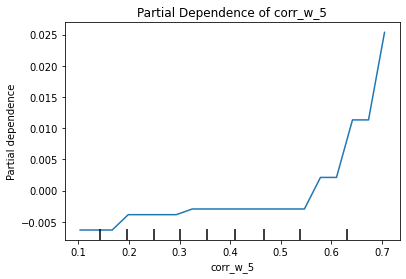

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


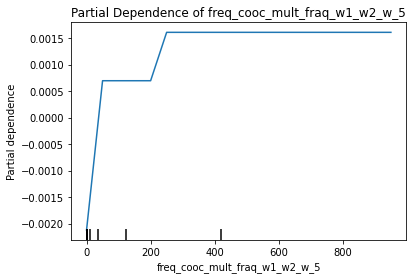

Plotting partial dependence for feature: frequency_of_cooc_w_8


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == 2.6834003769016235e-18 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


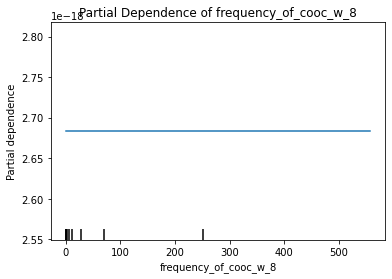

Plotting partial dependence for feature: corr_w_8


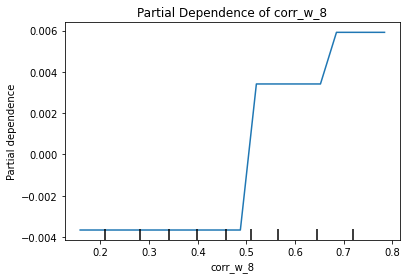

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


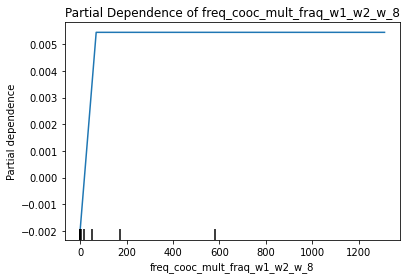

Plotting partial dependence for feature: frequency_w1


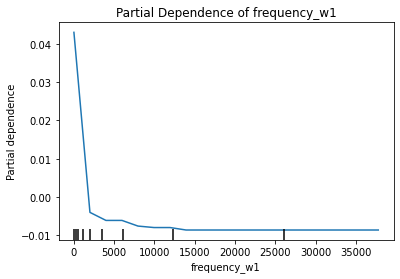

Plotting partial dependence for feature: frequency_w2


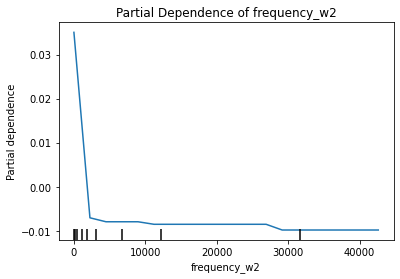

Plotting partial dependence for feature: tf_rel_word1


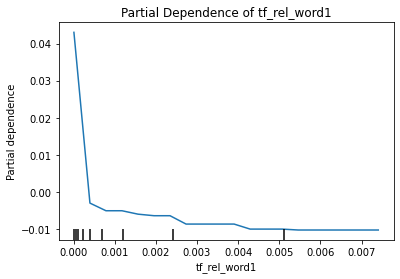

Plotting partial dependence for feature: tf_rel_word2


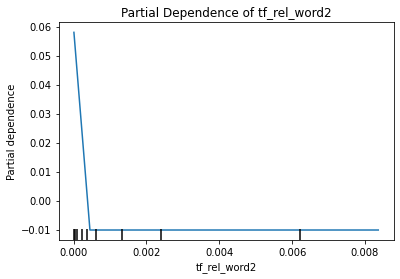

Plotting partial dependence for feature: word1_length


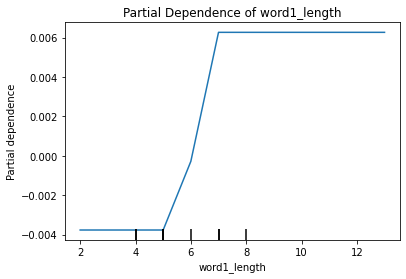

Plotting partial dependence for feature: word2_length


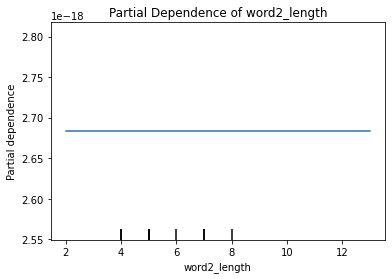

Plotting partial dependence for feature: fraq_w1_w2


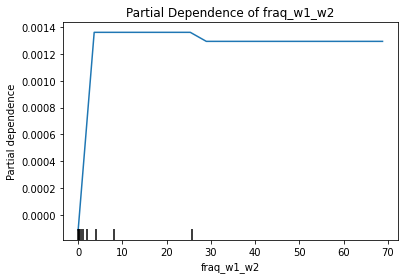

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


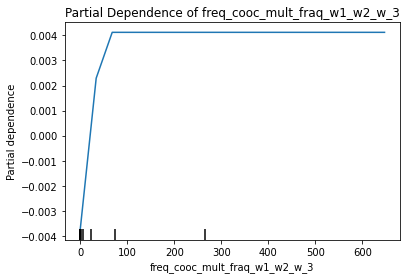

Plotting partial dependence for feature: score


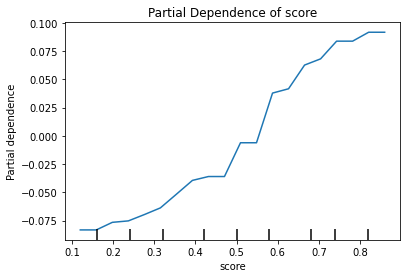

Plotting partial dependence for feature: syn_match


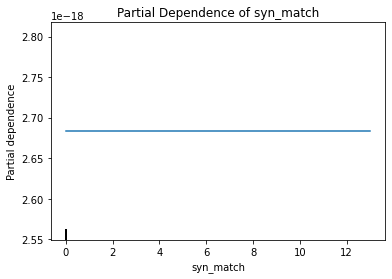

Plotting partial dependence for feature: syn_match_perc
Could not plot partial dependence for feature syn_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: syn1_count


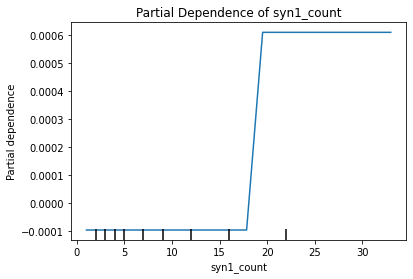

Plotting partial dependence for feature: syn2_count


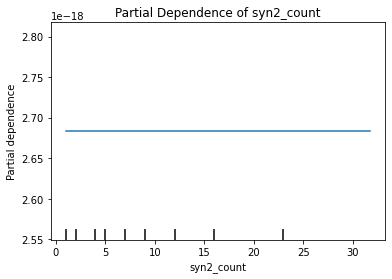

Plotting partial dependence for feature: are_synonyms


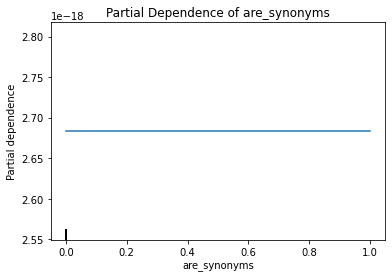

Plotting partial dependence for feature: fraq_syn1_syn2


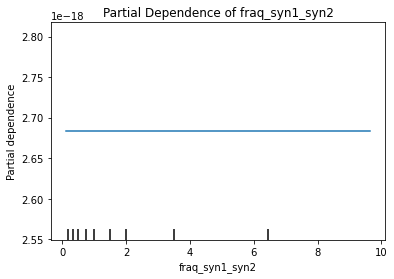

Plotting partial dependence for feature: syn_match_mult_fraq_syn
Could not plot partial dependence for feature syn_match_mult_fraq_syn: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: ant_match


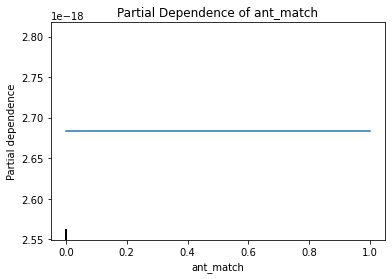

Plotting partial dependence for feature: ant_match_perc


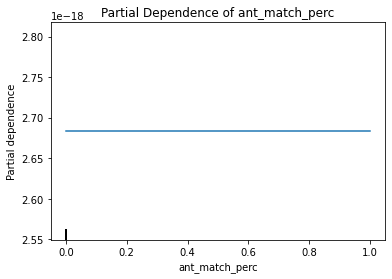

Plotting partial dependence for feature: ant1_count


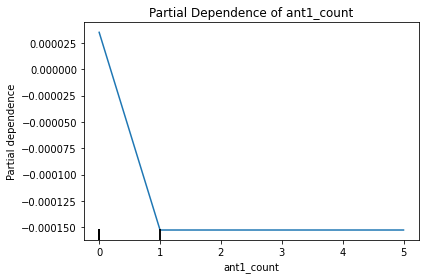

Plotting partial dependence for feature: ant2_count


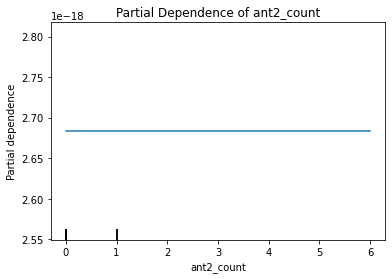

Plotting partial dependence for feature: are_antonyms


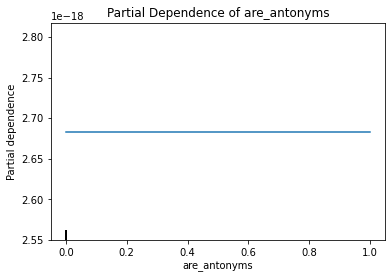

Plotting partial dependence for feature: fraq_ant1_ant2


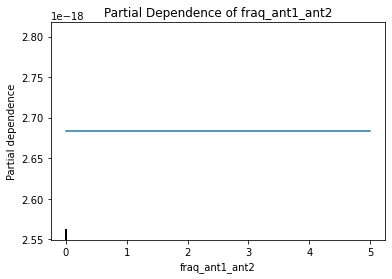

Plotting partial dependence for feature: ant_match_mult_fraq_ant


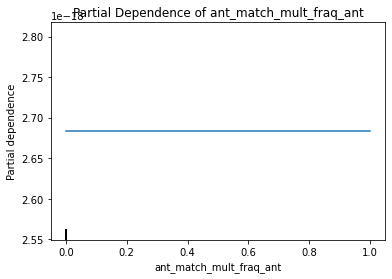

Plotting partial dependence for feature: hypo_match


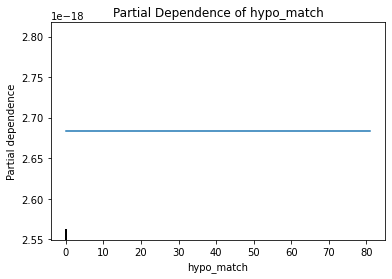

Plotting partial dependence for feature: hypo_match_perc
Could not plot partial dependence for feature hypo_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hypo1_count


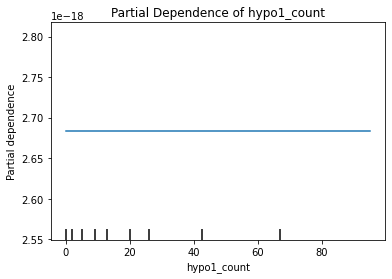

Plotting partial dependence for feature: hypo2_count


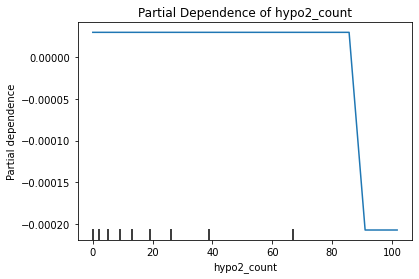

Plotting partial dependence for feature: is_hyponym


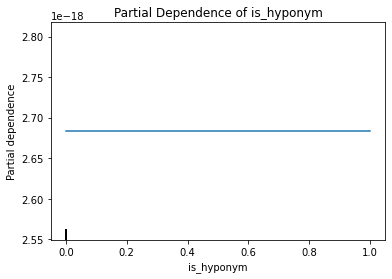

Plotting partial dependence for feature: fraq_hypo1_hypo2


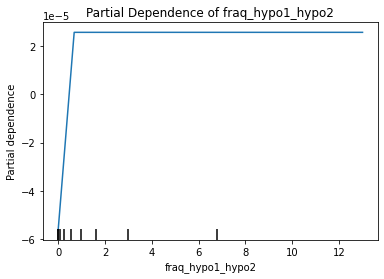

Plotting partial dependence for feature: hypo_match_mult_fraq_hypo
Could not plot partial dependence for feature hypo_match_mult_fraq_hypo: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hyper_match


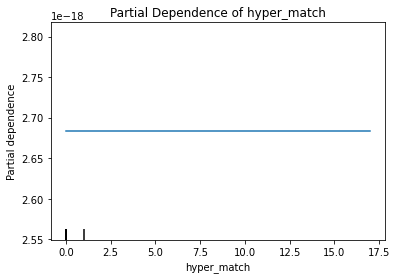

Plotting partial dependence for feature: hyper_match_perc


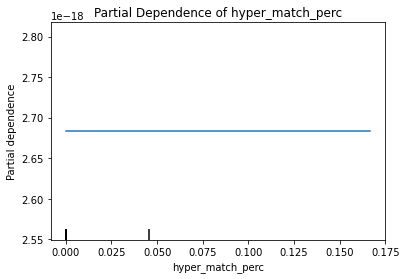

Plotting partial dependence for feature: hyper1_count


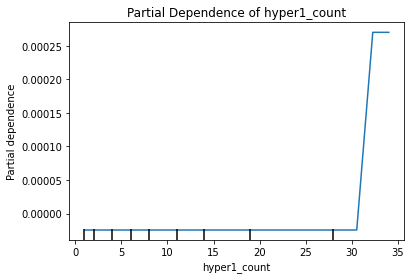

Plotting partial dependence for feature: hyper2_count


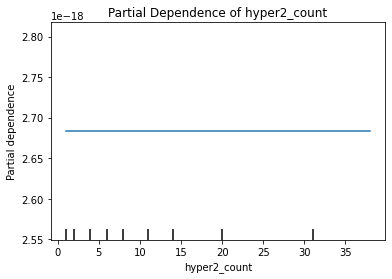

Plotting partial dependence for feature: is_hypernym


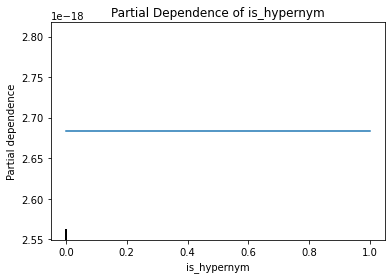

Plotting partial dependence for feature: fraq_hyper1_hyper2


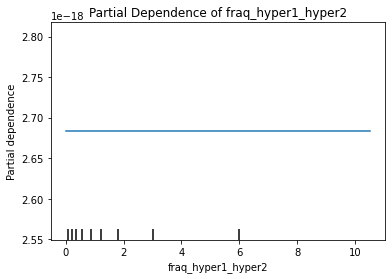

Plotting partial dependence for feature: hyper_match_mult_fraq_hyper


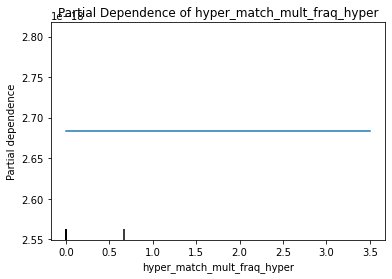

Plotting partial dependence for feature: polysemy1


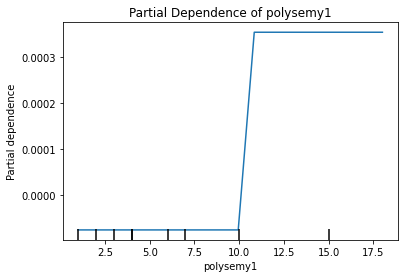

Plotting partial dependence for feature: polysemy2


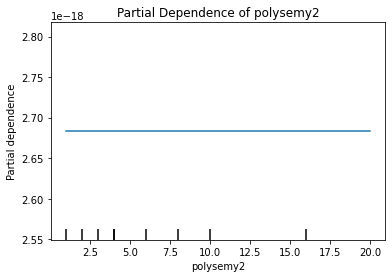

Plotting partial dependence for feature: are_homonyms


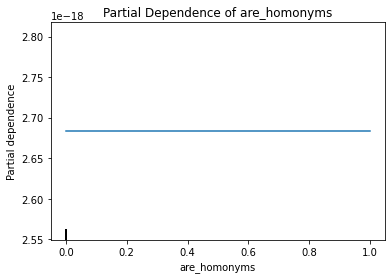

Plotting partial dependence for feature: common_homonyms


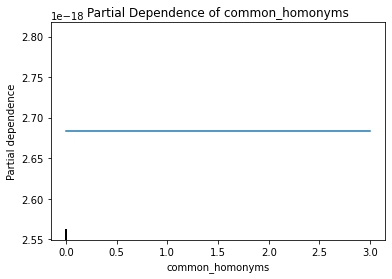

Plotting partial dependence for feature: common_homonyms_perc
Could not plot partial dependence for feature common_homonyms_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: common_lemma


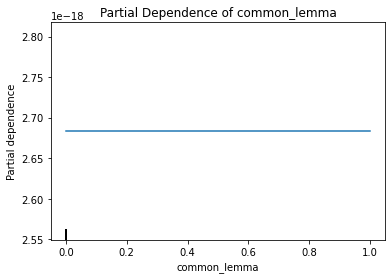

Plotting partial dependence for feature: common_prefixes


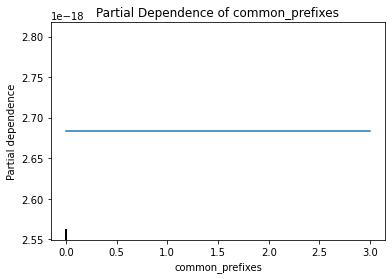

Plotting partial dependence for feature: common_suffixes


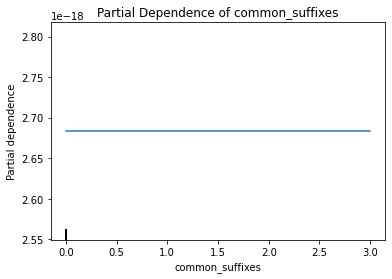

Plotting partial dependence for feature: are_derivationally_related


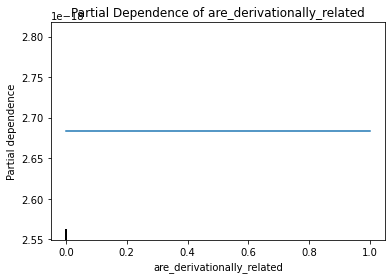

Plotting partial dependence for feature: common_pos_tags


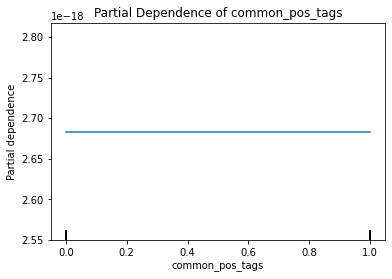

Plotting partial dependence for feature: same_pos_tags


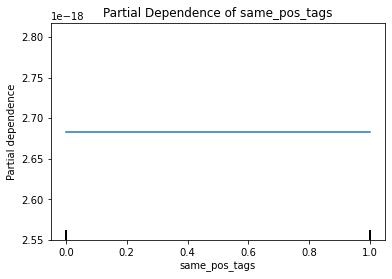

Plotting partial dependence for feature: first_word_dep_count


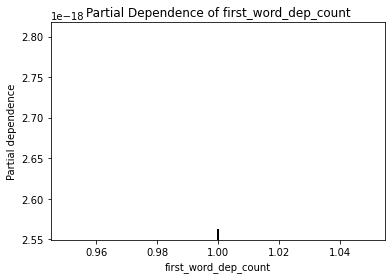

Plotting partial dependence for feature: second_word_dep_count


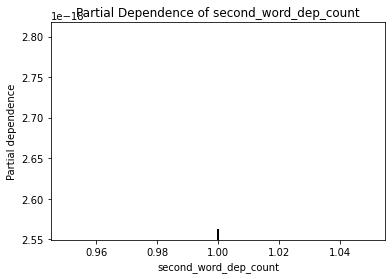

Plotting partial dependence for feature: common_dep_types


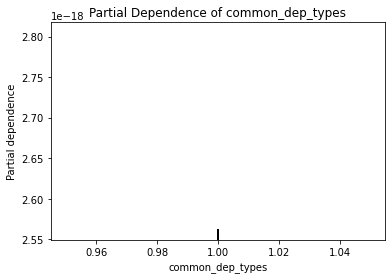

Plotting partial dependence for feature: dep_count_diff


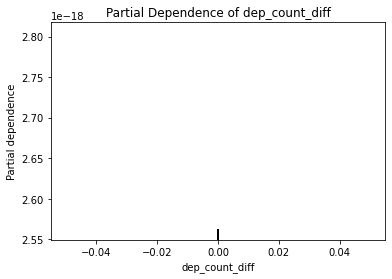

Plotting partial dependence for feature: common_head_words


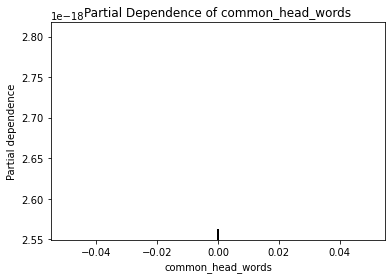

In [30]:
for model in models:
    model_functions.reg_model_results(y,X_all,model)

## Local interpretations for regression

https://www.kaggle.com/code/prashant111/explain-your-model-predictions-with-lime

In [31]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_all.values, 
                                                   feature_names=X_all.columns.values.tolist(),
                                                   class_names=['similarity'], 
                                                   verbose=True, 
                                                   mode='regression')

In [32]:
df[["similarity"]].reset_index().sort_values("similarity",ascending=False)[:20]

,first_second,similarity
2103,daughter_son,0.889612
810,vehicle_car,0.848658
214,reptiles_amphibians,0.829810
1936,children_kids,0.803217
2367,mammals_amphibians,0.798284
1747,dude_guy,0.780608
211,reptiles_mammals,0.779356
821,raspberry_strawberry,0.764649
457,winter_summer,0.764281
1185,knitting_crochet,0.746655


In [33]:
ff = df[["similarity"]].reset_index().sort_values("similarity",ascending=False)
ff[ff["first_second"].str.contains("daughter_son")]

,first_second,similarity
2103,daughter_son,0.889612


In [34]:
df[["similarity"]].reset_index().sort_values("similarity",ascending=True)[:20]

,first_second,similarity
1223,violet_construction,-0.022879
1977,peel_hat,-0.016074
490,lips_run,-0.014877
681,garbage_jean,-0.011297
620,bottle_construction,0.003932
195,cottage_bible,0.005960
2193,dog_silver,0.009457
2687,flame_bike,0.010032
1058,potatoes_skating,0.011348
401,road_glass,0.017746


In [35]:
j = 2103
print(X_all.iloc[j].name.split("_"))
exp = explainer.explain_instance(X_all.values[j], model.predict, num_features=6)
exp.show_in_notebook(show_table=True)
print(exp.as_list())

['daughter', 'son']


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


Intercept 0.22365701039561875
Prediction_local [0.39112045]
Right: 0.712257728252416


[('score > 0.72', 0.10648168537391887), ('corr_w_3 > 0.38', 0.0470906092870567), ('frequency_of_cooc_w_3 > 21.00', 0.025733635202654922), ('corr_w_5 > 0.50', 0.013283570226712756), ('frequency_w1 > 8298.00', -0.01273858057562343), ('tf_rel_word1 > 0.00', -0.012387478830586822)]


In [36]:
j = 681
print(X_all.iloc[j].name.split("_"))
exp = explainer.explain_instance(X_all.values[j], model.predict, num_features=6)
exp.show_in_notebook(show_table=True)
print(exp.as_list())

['garbage', 'jean']


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


Intercept 0.30576552531142764
Prediction_local [0.15143823]
Right: 0.12902088395694525


[('score <= 0.28', -0.10377384097414083), ('0.14 < corr_w_3 <= 0.24', -0.014402790188180364), ('frequency_of_cooc_w_3 <= 0.00', -0.01370287850717772), ('0.31 < corr_w_8 <= 0.46', -0.007749527148810651), ('freq_cooc_mult_fraq_w1_w2_w_3 <= 0.00', -0.007605854461608066), ('0.00 < tf_rel_word1 <= 0.00', -0.007092404894681669)]


In [37]:
j = 40
print(X_all.iloc[j].name.split("_"))
exp = explainer.explain_instance(X_all.values[j], model.predict, num_features=6)
exp.show_in_notebook(show_table=True)
print(exp.as_list())

['fishing', 'boat']


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


Intercept 0.17857196510361956
Prediction_local [0.39213651]
Right: 0.4288946329441005


[('score > 0.72', 0.1032676354266101), ('ant_match <= 0.00', 0.04662527156821351), ('frequency_w1 <= 378.00', 0.02736712365286985), ('tf_rel_word1 <= 0.00', 0.02484115719286204), ('0.24 < corr_w_3 <= 0.38', 0.016902717826247485), ('0.00 < tf_rel_word2 <= 0.00', -0.005439360238244081)]


In [38]:
j = 457
print(X_all.iloc[j].name.split("_"))
exp = explainer.explain_instance(X_all.values[j], model.predict, num_features=6)
exp.show_in_notebook(show_table=True)
print(exp.as_list())

['winter', 'summer']


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


Intercept 0.22309464421135317
Prediction_local [0.39147471]
Right: 0.5370153680428904


[('score > 0.72', 0.10598364973019847), ('corr_w_3 > 0.38', 0.04739022575743526), ('frequency_of_cooc_w_3 > 21.00', 0.026056384810048426), ('2102.00 < frequency_w1 <= 8298.00', -0.01286723415068637), ('corr_w_5 > 0.50', 0.01265198808278372), ('1902.00 < frequency_w2 <= 9420.00', -0.010834951277967773)]


In [39]:
X_all.describe()

,corr_w_3,corr_w_5,freq_cooc_mult_fraq_w1_w2_w_5,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_8,tf_rel_word1,tf_rel_word2,fraq_w1_w2,freq_cooc_mult_fraq_w1_w2_w_3,score,syn_match,syn_match_perc,syn1_count,syn2_count,fraq_syn1_syn2,syn_match_mult_fraq_syn,ant_match,ant_match_perc,ant1_count,ant2_count,fraq_ant1_ant2,ant_match_mult_fraq_ant,hypo_match,hypo_match_perc,hypo1_count,hypo2_count,fraq_hypo1_hypo2,hypo_match_mult_fraq_hypo,hyper_match,hyper_match_perc,hyper1_count,hyper2_count,fraq_hyper1_hyper2,hyper_match_mult_fraq_hyper,polysemy1,polysemy2,common_homonyms,common_homonyms_perc,common_prefixes,common_suffixes,common_pos_tags,first_word_dep_count,second_word_dep_count,common_dep_types,dep_count_diff,common_head_words
count,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2.701000e+03,2.701000e+03,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.000000,2701.0,2701.0,2701.0,2701.0,2701.0
mean,0.275883,0.373414,175.934730,0.462006,241.221405,1.524145e-03,1.637794e-03,16.998544,122.325243,0.497053,0.104406,0.007878,10.280637,10.025176,2.537325,0.156598,0.003332,0.002838,0.337653,0.390226,0.077311,0.003702,0.213995,0.005078,26.957793,26.704554,3.513837,0.374702,0.361718,0.025045,11.552758,12.252129,2.329316,0.585867,6.502777,6.622732,0.025176,0.003679,0.131433,0.125139,0.457979,1.0,1.0,1.0,0.0,0.0
std,0.165857,0.183875,602.746423,0.190183,793.058663,2.494684e-03,2.663804e-03,81.068069,454.302929,0.246369,0.897849,0.068419,10.465592,9.737638,4.513637,1.627112,0.063741,0.052432,0.765473,0.871929,0.360246,0.076891,2.549968,0.053839,41.873333,44.855200,14.606016,4.602204,1.337715,0.102168,12.019301,12.615412,4.429837,2.696913,6.437311,6.447870,0.214552,0.034555,0.473889,0.442929,0.498323,0.0,0.0,0.0,0.0,0.0
min,-0.000863,-0.001051,0.000000,0.002792,0.000000,9.815901e-07,9.815901e-07,0.000582,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.016393,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,0.0,0.0
25%,0.144291,0.227523,0.000000,0.314721,0.000000,7.420821e-05,8.893207e-05,0.188167,0.000000,0.280000,0.000000,0.000000,3.000000,3.000000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,4.000000,0.022727,0.000000,0.000000,0.000000,3.000000,3.000000,0.266667,0.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,0.0,0.0
50%,0.243255,0.356340,2.244455,0.459854,3.942857,4.126605e-04,3.733969e-04,1.061166,0.989944,0.500000,0.000000,0.000000,7.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.000000,13.000000,0.507042,0.000000,0.000000,0.000000,8.000000,8.000000,0.857143,0.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,0.0,0.0
75%,0.382166,0.504797,63.929758,0.604120,92.146531,1.629047e-03,1.849316e-03,5.106996,39.686441,0.720000,0.000000,0.000000,14.000000,14.000000,2.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,35.000000,30.000000,2.153846,0.000000,0.000000,0.000000,16.000000,16.000000,2.200000,0.000000,8.000000,9.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.0,1.0,1.0,0.0,0.0
max,0.969587,0.975030,8241.119446,0.976755,11369.004694,1.351610e-02,1.351610e-02,1805.684211,6699.225000,1.000000,17.000000,1.000000,100.000000,69.000000,68.000000,48.157895,2.000000,1.000000,5.000000,6.000000,5.000000,3.000000,81.000000,1.000000,629.000000,629.000000,307.000000,118.000000,

In [40]:
comp_df = df[["similarity"]].reset_index()
comp_df["predictions"] = model.predict(X_all)
comp_df["abs_diff"] = abs(comp_df["similarity"] - comp_df["predictions"])
comp_df["diff"] = comp_df["similarity"] - comp_df["predictions"]
comp_df = comp_df.sort_values("abs_diff",ascending=False).set_index("first_second")
df_f = comp_df.join(X_all)
df_f

,similarity,predictions,abs_diff,diff,corr_w_3,frequency_of_cooc_w_3,frequency_of_cooc_w_5,corr_w_5,freq_cooc_mult_fraq_w1_w2_w_5,frequency_of_cooc_w_8,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_8,frequency_w1,frequency_w2,tf_rel_word1,tf_rel_word2,word1_length,word2_length,fraq_w1_w2,freq_cooc_mult_fraq_w1_w2_w_3,score,syn_match,syn_match_perc,syn1_count,syn2_count,are_synonyms,fraq_syn1_syn2,syn_match_mult_fraq_syn,ant_match,ant_match_perc,ant1_count,ant2_count,are_antonyms,fraq_ant1_ant2,ant_match_mult_fraq_ant,hypo_match,hypo_match_perc,hypo1_count,hypo2_count,is_hyponym,fraq_hypo1_hypo2,hypo_match_mult_fraq_hypo,hyper_match,hyper_match_perc,hyper1_count,hyper2_count,is_hypernym,fraq_hyper1_hyper2,hyper_match_mult_fraq_hyper,polysemy1,polysemy2,are_homonyms,common_homonyms,common_homonyms_perc,common_lemma,common_prefixes,common_suffixes,are_derivationally_related,common_pos_tags,same_pos_tags,first_word_dep_count,second_word_dep_count,common_dep_types,dep_count_diff,common_head_words
first_second,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
cigarette_smoke,0.723498,0.431475,0.292024,0.292024,0.448333,999,1074,0.591301,245.892273,1190,0.704690,272.450471,1849,8076,0.000363,0.001585,9,5,0.228950,228.721025,0.86,0.0,0.0,5.0,19.0,False,0.263158,0.0,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.0,8.0,14.0,False,0.571429,0.0,0.0,0.0000,2.0,29.0,True,0.068966,0.0000,1.0,10.0,False,0.0,0.0,False,0.0,1.0,False,0.0,False,1.0,1.0,1.0,0.0,0.0
apartment_bedroom,0.599630,0.352309,0.247321,0.247321,0.335315,140,174,0.443030,215.942574,217,0.512823,269.307692,3501,2821,0.000687,0.000554,9,7,1.241049,173.746898,0.64,0.0,0.0,2.0,5.0,False,0.400000,0.0,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.0,18.0,9.0,False,2.000000,0.0,0.0,0.0000,3.0,1.0,False,3.000000,0.0000,1.0,1.0,False,0.0,0.0,False,0.0,0.0,False,1.0,True,1.0,1.0,1.0,0.0,0.0
smoking_cigarette,0.616497,0.382321,0.234176,0.234176,0.384084,171,279,0.549626,869.894538,384,0.677867,1197.274202,5765,1849,0.001132,0.000363,7,9,3.117902,533.161168,0.84,0.0,0.0,2.0,35.0,False,0.057143,0.0,0.0,0.0,0.0,6.0,False,0.0,0.0,0.0,0.0,0.0,75.0,False,0.000000,0.0,0.0,0.0000,1.0,32.0,False,0.031250,0.0000,1.0,21.0,False,0.0,0.0,False,0.0,0.0,False,0.0,False,1.0,1.0,1.0,0.0,0.0
winter_summer,0.764281,0.537015,0.227266,0.227266,0.703083,249,333,0.791188,112.464046,393,0.853575,132.727838,2663,7885,0.000523,0.001548,6,6,0.337730,84.094737,0.74,0.0,0.0,2.0,3.0,False,0.666667,0.0,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.0,0.0,0.0,False,0.000000,0.0,4.0,0.8000,5.0,4.0,False,1.250000,5.0000,3.0,2.0,False,0.0,0.0,False,0.0,2.0,False,1.0,True,1.0,1.0,1.0,0.0,0.0
tomato_pepper,0.504520,0.279120,0.225399,0.225399,0.384228,190,270,0.554924,361.532601,356,0.689519,476.687430,11952,8926,0.002346,0.001752,6,6,1.339010,254.411831,0.54,0.0,0.0,68.0,5.0,False,13.600000,0.0,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.0,307.0,0.0,False,0.000000,0.0,0.0,0.0000,66.0,5.0,False,13.200000,0.0000,36.0,1.0,False,0.0,0.0,False,0.0,0.0,False,0.0,False,1.0,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
shade_green,0.223506,0.223736,0.000230,-0.000230,0.186600,27,30,0.272293,2.203464,37,0.357325,2.717605,1514,20613,0.000297,0.004047,5,5,0.073449,1.983117,0.50,0.0,0.0,28.0,19.0,False,1.473684,0.0,0.0,0.0,1.0,0.0,False,0.0,0.0,0.0,0.0,40.0,11.0,False,3.636364,0.0,2.0,0.0625,23.0,32.0,False,0.718750,1.4375,14.0,13.0,False,0.0,0.0,False,0.0,0.0,False,0.0,False,1.0,1.0,1.0,0.0,0.0
rusty_dark,0.187917,0.188122,0.000205,-0.000205,0.298616,2,3,0.407766,0.069959,3,0.522238,0.069959,280,12007,0.000055,0.002357,5,4,0.023320,0.046639,0.36,0.0,0.0,33.0,5.0,False,6.600000,0.0,0.0,0.0,2.0,0.0,False,0.0,0.0,0.0,0.0,13.0,0.0,False,0.000000,0.0,0.0,0.0000,8.0,0.0,False,0.000000,0.0000,16.0,4.0,False,0.0,0.0,False,0.0,0.0,False,0.0,False

array([[<AxesSubplot:title={'center':'corr_w_3'}>]], dtype=object)

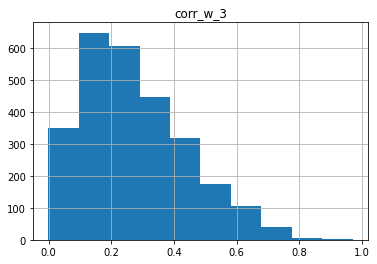

In [41]:
df[["corr_w_3"]].hist()

<AxesSubplot:>

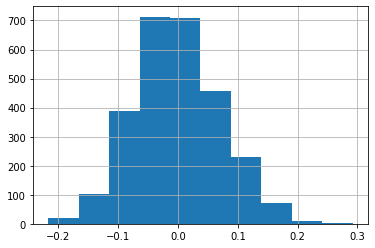

In [42]:
comp_df["diff"].hist()

In [43]:
comp_df = comp_df[:20]

In [44]:
comp_df.describe()

,similarity,predictions,abs_diff,diff
count,20.000000,20.000000,20.000000,20.000000
mean,0.422956,0.352879,0.210390,0.070076
std,0.251340,0.085945,0.025442,0.205115
min,0.042942,0.234885,0.189261,-0.216974
25%,0.163756,0.281784,0.191862,-0.191700
50%,0.514459,0.351785,0.200883,0.192692
75%,0.606780,0.416775,0.219080,0.216560
max,0.764281,0.537015,0.292024,0.292024


## BERT

In [45]:
word_list = list(embeddings.index)

In [46]:
from transformers import BertTokenizer, BertModel
import torch
import pandas as pd
import tqdm
from sklearn.metrics.pairwise import cosine_similarity

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

In [47]:
len(word_list)

3703

In [49]:
embeddings = []

from sklearn.metrics.pairwise import cosine_similarity

for word in tqdm.tqdm(word_list):
    inputs = tokenizer(word, return_tensors='pt')

    with torch.no_grad():
        outputs = model(**inputs)


    word_embedding = outputs.last_hidden_state.mean(dim=1).squeeze().numpy()


    embeddings.append(word_embedding)


df_embeddings = pd.DataFrame(embeddings, index=word_list)

print(df_embeddings)

def get_embedding(word):
    if word in df_embeddings.index:
        return df_embeddings.loc[word].values.reshape(1, -1)
    else:
        return None

def compute_cosine_similarity(word1, word2):
    embedding1 = get_embedding(word1)
    embedding2 = get_embedding(word2)
    

    if embedding1 is not None and embedding2 is not None:
        similarity = cosine_similarity(embedding1, embedding2)[0][0]
    else:
        similarity = np.nan  
    
    return similarity


df['similarity_bert'] = df.apply(lambda row: compute_cosine_similarity(row['word1'], row['word2']), axis=1)


100%|██████████| 3703/3703 [01:08<00:00, 54.02it/s]


                 0         1         2         3         4         5    \
sleeveless  0.179983 -0.541052 -0.473532  0.066167  0.416290  0.072335   
itd         0.117518  0.025159 -0.018276  0.105166 -0.027308 -0.143850   
woofed      0.382210  0.009765  0.358829  0.032750  0.075696 -0.005656   
sds        -0.038440 -0.217033 -0.123287  0.130261 -0.178088 -0.219151   
abbot      -0.077744 -0.047491 -0.254445  0.093190 -0.129890 -0.427852   
...              ...       ...       ...       ...       ...       ...   
photos      0.281831  0.084084 -0.021498  0.107996  0.022055 -0.311258   
bike        0.404095 -0.007515 -0.357462  0.128417 -0.060036 -0.181263   
lily        0.163720  0.034907 -0.064694  0.123314  0.062792 -0.490845   
belly       0.131846 -0.094041 -0.081358 -0.010613 -0.023126 -0.115116   
stairs      0.351524  0.437429 -0.211694  0.031411  0.190322 -0.243760   

                 6         7         8         9         10        11   \
sleeveless  0.390186  0.216340  0.187

In [50]:
df

,similarity,First_x,Last_x,word1,word2,score,Unnamed: 0,First_y,Last_y,no_words_corpus,frequency_w1,frequency_w2,tf_rel_word1,tf_rel_word2,word1_length,word2_length,fraq_w1_w2,frequency_of_cooc_w_3,corr_w_3,freq_cooc_mult_fraq_w1_w2_w_3,frequency_of_cooc_w_5,corr_w_5,freq_cooc_mult_fraq_w1_w2_w_5,frequency_of_cooc_w_8,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_8,syn_match,syn_match_perc,syn1_count,syn2_count,are_synonyms,fraq_syn1_syn2,syn_match_mult_fraq_syn,ant_match,ant_match_perc,ant1_count,ant2_count,are_antonyms,fraq_ant1_ant2,ant_match_mult_fraq_ant,hypo_match,hypo_match_perc,hypo1_count,hypo2_count,is_hyponym,fraq_hypo1_hypo2,hypo_match_mult_fraq_hypo,hyper_match,hyper_match_perc,hyper1_count,hyper2_count,is_hypernym,fraq_hyper1_hyper2,hyper_match_mult_fraq_hyper,polysemy1,polysemy2,are_homonyms,common_homonyms,common_homonyms_perc,first_word_lemma,second_word_lemma,common_lemma,common_prefixes,common_suffixes,first_word_derivations,second_word_derivations,are_derivationally_related,word1_pos_tags,word2_pos_tags,common_pos_tags,same_pos_tags,first_word_dependencies,second_word_dependencies,first_word_dep_types,second_word_dep_types,first_word_head_words,second_word_head_words,first_word_dep_count,second_word_dep_count,common_dep_types,common_head_words,dep_count_diff,similarity_category,similarity_bert
first_second,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
cemetery_grave,0.404904,cemetery,grave,cemetery,grave,0.80,284418,cemetery,grave,509377579,55,200,0.000011,0.000039,8,5,0.275000,2,0.138238,0.550000,4,0.219094,1.100000,4,0.295694,1.100000,0.0,0.0,13.0,24.0,False,0.541667,0.0,0.0,0.0,2.0,3.0,False,0.666667,0.0,0.0,0.0,0.0,95.0,False,0.000000,0.0,0.0,0.000000,0.0,40.0,False,0.000000,0.000000,11.0,15.0,False,0.0,0.0,bright,colour,False,0.0,0.0,"{'vividness', 'brilliancy', 'shine', 'brightne...","{'coloration', 'colouring', 'gloss', 'colorize...",False,['ADJ'],['NOUN'],0.0,False,"[('bright', 'ROOT', 'bright')]","[('colour', 'ROOT', 'colour')]",['ROOT'],['ROOT'],['bright'],['colour'],1.0,1.0,1.0,0.0,0.0,0,0.812982
cemetery_cone,0.109180,cemetery,cone,cemetery,cone,0.14,284556,cemetery,cone,509377579,55,1233,0.000011,0.000242,8,4,0.044607,0,0.049624,0.000000,0,0.077677,0.000000,0,0.110995,0.000000,0.0,0.0,11.0,46.0,False,0.239130,0.0,0.0,0.0,0.0,4.0,False,0.000000,0.0,0.0,0.0,3.0,110.0,False,0.027273,0.0,0.0,0.000000,2.0,49.0,False,0.040816,0.000000,2.0,22.0,False,0.0,0.0,dude,stop,False,0.0,0.0,{'dandify'},"{'barricade', 'stop', 'blocking', 'discontinua...",False,['VERB'],['VERB'],1.0,True,"[('dude', 'ROOT', 'dude')]","[('stop', 'ROOT', 'stop')]",['ROOT'],['ROOT'],['dude'],['stop'],1.0,1.0,1.0,0.0,0.0,0,0.714648
cemetery_males,0.232391,cemetery,males,cemetery,males,0.20,284566,cemetery,males,509377579,55,219,0.000011,0.000043,8,5,0.251142,0,0.087103,0.000000,0,0.129904,0.000000,0,0.212897,0.000000,0.0,0.0,5.0,12.0,False,0.416667,0.0,0.0,0.0,0.0,0.0,False,0.000000,0.0,0.0,0.0,46.0,41.0,False,1.121951,0.0,0.0,0.000000,21.0,24.0,False,0.875000,0.000000,7.0,10.0,False,0.0,0.0,jacket,stream,False,0.0,0.0,{'jacket'},"{'swarm', 'stream', 'flow', 'pelter', 'streaml...",False,['NOUN'],['VERB'],0.0,False,"[('jacket', 'ROOT', 'jacket')]","[('stream', 'ROOT', 'stream')]",['ROOT'],['ROOT'],['jacket'],['stream'],1.0,1.0,1.0,0.0,0.0,0,0.635076
cemetery_memorial,0.339895,cemetery,memorial,cemetery,memorial,0.74,284812,cemetery,memorial,509377579,55,844,0.000011,0.000166,8,8,0.065166,5,0.051450,0.325829,5,0.103167,0.325829,5,0.176476,0.325829,0.0,0.0,7.0,4.0,False,1.750000,0.0,0.0,0.0,0.0,0.0,False,0.000000,0.0,0.0,0.0,1.0,17.0,False,0.058824,0.0,0.0,0.000000,2.0,8.0,False,0.250000,0.000000,1.0,3.0,False,0.0,0.0,cemetery,memorial,False,0.0,0.0,set(),"{'remember', 'memorialize', 'monumental', 'com...",False,['NOUN'],['VERB'],0.0,False,"[('cemetery', 'ROOT', 'cemetery')]","[('memorial', 'ROOT', 'memorial')]",['ROOT'],['ROOT'],['cemetery'],['memorial'],1.0,1.0,1.0,0.0,0.0,0,0.790382
mac_burger,0.387634,ma

array([[<AxesSubplot:title={'center':'similarity'}>,
        <AxesSubplot:title={'center':'similarity_bert'}>]], dtype=object)

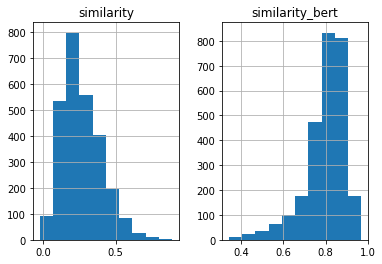

In [51]:
df[["similarity","similarity_bert"]].hist()

In [52]:
df[["similarity","similarity_bert"]].corr()

,similarity,similarity_bert
similarity,1.000000,0.107569
similarity_bert,0.107569,1.000000


In [53]:
df.sort_values("similarity_bert",ascending=False)[:20]

,similarity,First_x,Last_x,word1,word2,score,Unnamed: 0,First_y,Last_y,no_words_corpus,frequency_w1,frequency_w2,tf_rel_word1,tf_rel_word2,word1_length,word2_length,fraq_w1_w2,frequency_of_cooc_w_3,corr_w_3,freq_cooc_mult_fraq_w1_w2_w_3,frequency_of_cooc_w_5,corr_w_5,freq_cooc_mult_fraq_w1_w2_w_5,frequency_of_cooc_w_8,corr_w_8,freq_cooc_mult_fraq_w1_w2_w_8,syn_match,syn_match_perc,syn1_count,syn2_count,are_synonyms,fraq_syn1_syn2,syn_match_mult_fraq_syn,ant_match,ant_match_perc,ant1_count,ant2_count,are_antonyms,fraq_ant1_ant2,ant_match_mult_fraq_ant,hypo_match,hypo_match_perc,hypo1_count,hypo2_count,is_hyponym,fraq_hypo1_hypo2,hypo_match_mult_fraq_hypo,hyper_match,hyper_match_perc,hyper1_count,hyper2_count,is_hypernym,fraq_hyper1_hyper2,hyper_match_mult_fraq_hyper,polysemy1,polysemy2,are_homonyms,common_homonyms,common_homonyms_perc,first_word_lemma,second_word_lemma,common_lemma,common_prefixes,common_suffixes,first_word_derivations,second_word_derivations,are_derivationally_related,word1_pos_tags,word2_pos_tags,common_pos_tags,same_pos_tags,first_word_dependencies,second_word_dependencies,first_word_dep_types,second_word_dep_types,first_word_head_words,second_word_head_words,first_word_dep_count,second_word_dep_count,common_dep_types,common_head_words,dep_count_diff,similarity_category,similarity_bert
first_second,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
sunset_sunrise,0.481109,sunset,sunrise,sunrise,sunset,0.84,115305,sunset,sunrise,509377579,1361,469,0.000267,0.000092,6,7,2.901919,37,0.318692,107.371002,38,0.453566,110.272921,41,0.552542,118.978678,0.0,0.0,8.0,6.0,False,1.333333,0.0,0.0,0.0,0.0,1.0,False,0.0,0.0,0.0,0.0,2.0,17.0,False,0.117647,0.0,0.0,0.000000,11.0,17.0,True,0.647059,0.00,6.0,14.0,False,0.0,0.0,harbor,port,False,0.0,0.0,"{'harbor', 'harborage', 'harbour', 'harbourage'}","{'port', 'portage', 'porter'}",False,['NOUN'],['NOUN'],1.0,True,"[('harbor', 'ROOT', 'harbor')]","[('port', 'ROOT', 'port')]",['ROOT'],['ROOT'],['harbor'],['port'],1.0,1.0,1.0,0.0,0.0,0,0.969768
dinner_breakfast,0.388165,dinner,breakfast,breakfast,dinner,0.74,141479,dinner,breakfast,509377579,63788,43403,0.012523,0.008521,6,9,1.469668,1793,0.749158,2635.114716,2326,0.765381,3418.447757,2850,0.773075,4188.553787,0.0,0.0,12.0,25.0,False,0.480000,0.0,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.0,79.0,133.0,False,0.593985,0.0,0.0,0.000000,21.0,44.0,False,0.477273,0.00,15.0,36.0,False,0.0,0.0,band,play,False,0.0,1.0,"{'stripe', 'striate', 'stripy', 'ring', 'band'}","{'encounter', 'better', 'toying', 'playactor',...",False,['NOUN'],['VERB'],0.0,False,"[('band', 'ROOT', 'band')]","[('played', 'ROOT', 'played')]",['ROOT'],['ROOT'],['band'],['played'],1.0,1.0,1.0,0.0,0.0,0,0.969615
bicycle_bike,0.678331,bicycle,bike,bicycle,bike,0.90,1419183,bicycle,bike,509377579,329,3747,0.000065,0.000736,7,4,0.087804,18,0.658973,1.580464,48,0.748121,4.214572,84,0.824938,7.375500,0.0,0.0,38.0,2.0,False,19.000000,0.0,0.0,0.0,1.0,0.0,False,0.0,0.0,0.0,0.0,28.0,0.0,False,0.000000,0.0,0.0,0.000000,30.0,6.0,False,5.000000,0.00,10.0,2.0,False,0.0,0.0,cat,kitten,False,0.0,0.0,"{'catty', 'vomiting', 'puking', 'retch', 'vomi...",{'kitten'},False,['NOUN'],['NOUN'],1.0,True,"[('cat', 'ROOT', 'cat')]","[('kittens', 'ROOT', 'kittens')]",['ROOT'],['ROOT'],['cat'],['kittens'],1.0,1.0,1.0,0.0,0.0,1,0.966251
airplane_plane,0.610722,airplane,plane,airplane,plane,0.84,441064,airplane,plane,509377579,341,1882,0.000067,0.000369,8,5,0.181190,1,0.533620,0.181190,9,0.638949,1.630712,18,0.728094,3.261424,0.0,0.0,4.0,8.0,False,0.500000,0.0,0.0,0.0,0.0,0.0,False,0.0,0.0,0.0,0.0,58.0,13.0,False,4.461538,0.0,0.0,0.000000,5.0,8.0,False,0.625000,0.00,4.0,3.0,False,0.0,0.0,cake,chocolate,False,1.0,1.0,"{'coating', 'coat'}",{'umber'},False,['NOUN'],['NOUN'],1.0,True,"[('cake', 'ROOT', 'cake')]","[('chocolate', 'ROOT', 'chocolate')]",['ROOT'],['ROOT'],['cake'],['chocolate'],1.0,1.0,1.0,0.0,0.0,1,0.957523
dawn_sunrise,0.260999,dawn,sunrise,dawn,sunrise,0.86,3935

In [54]:
correlation, p_value = pearsonr(df["similarity_bert"], df["score"])
print(f"Pearsonův korelační koeficient: {correlation}")
print(f"P-hodnota: {p_value}")

correlation, p_value = pearsonr(df["similarity_bert"], df["similarity"])
print(f"Pearsonův korelační koeficient: {correlation}")
print(f"P-hodnota: {p_value}")


Pearsonův korelační koeficient: 0.23787893012618938
P-hodnota: 4.6541340186010147e-36
Pearsonův korelační koeficient: 0.10756918253523706
P-hodnota: 2.0925151058994957e-08


In [55]:
len(X_all)

2701

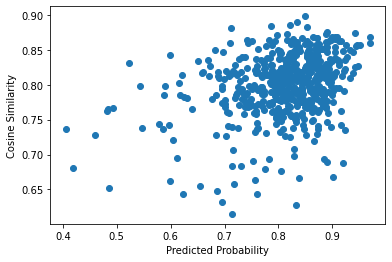

                           Metric     Value
0       Mean Absolute Error (MAE)  0.063163
1        Mean Squared Error (MSE)  0.006784
2  Root Mean Squared Error (RMSE)  0.082365
3                  R-squared (R2)  0.041866
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.328077
y_pred  0.328077  1.000000
Pearsonův korelační koeficient: 0.32807661651249875
P-hodnota: 4.84013760297745e-15


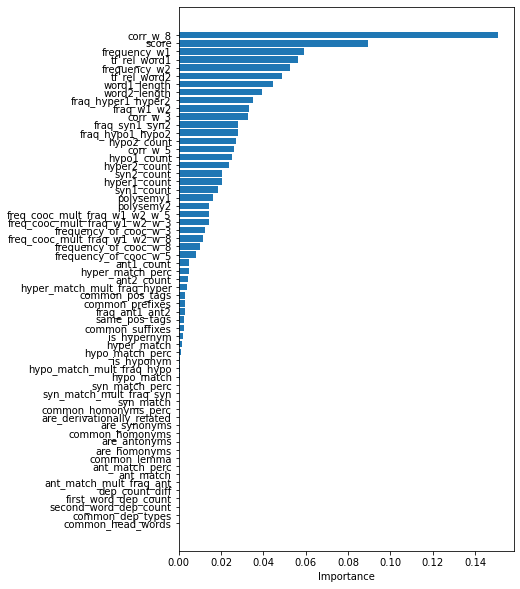

PDP
Plotting partial dependence for feature: corr_w_3


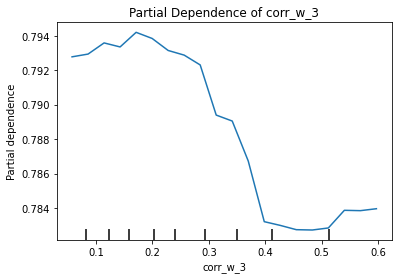

Plotting partial dependence for feature: frequency_of_cooc_w_3


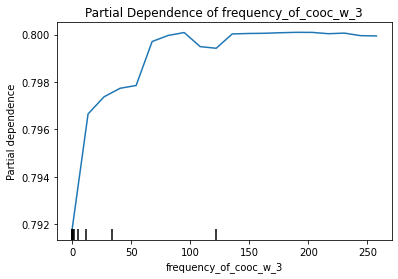

Plotting partial dependence for feature: frequency_of_cooc_w_5


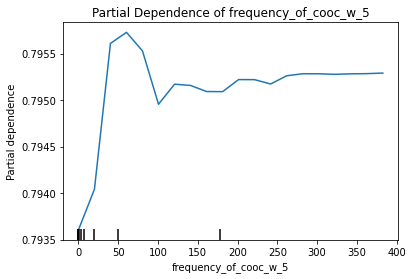

Plotting partial dependence for feature: corr_w_5


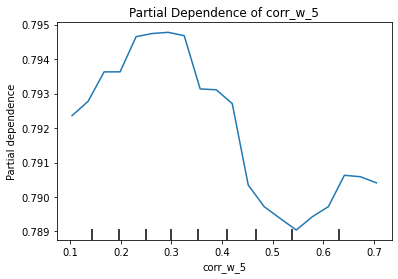

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


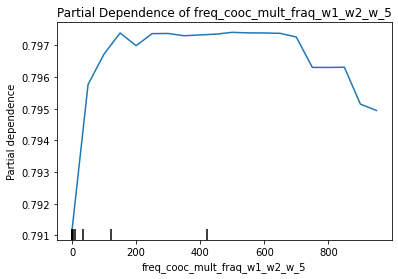

Plotting partial dependence for feature: frequency_of_cooc_w_8


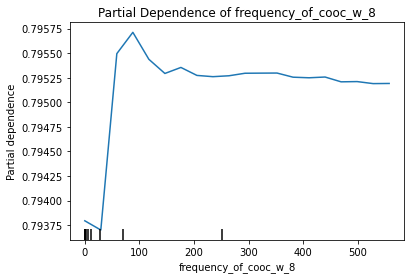

Plotting partial dependence for feature: corr_w_8


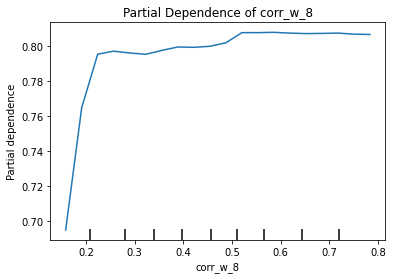

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


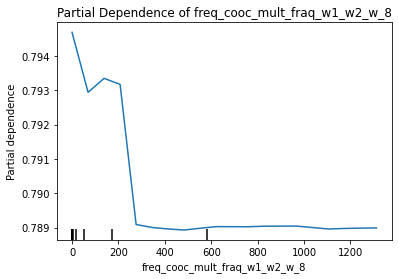

Plotting partial dependence for feature: frequency_w1


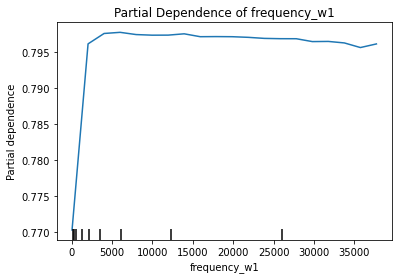

Plotting partial dependence for feature: frequency_w2


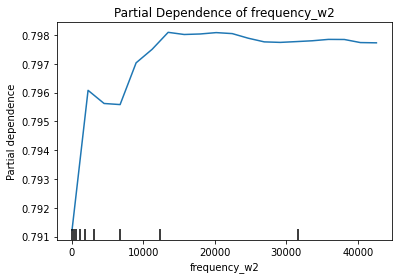

Plotting partial dependence for feature: tf_rel_word1


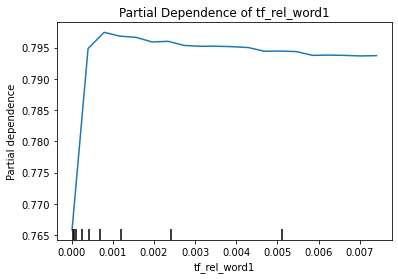

Plotting partial dependence for feature: tf_rel_word2


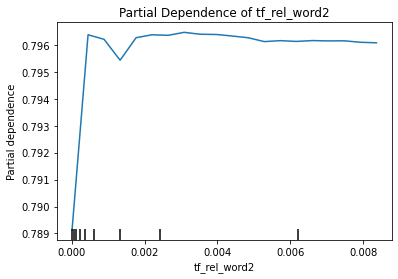

Plotting partial dependence for feature: word1_length


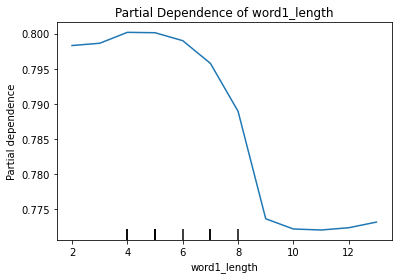

Plotting partial dependence for feature: word2_length


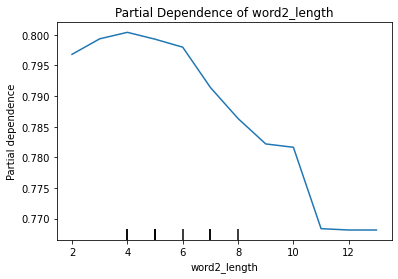

Plotting partial dependence for feature: fraq_w1_w2


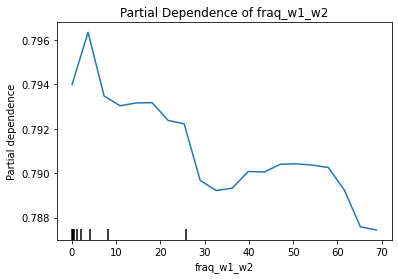

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


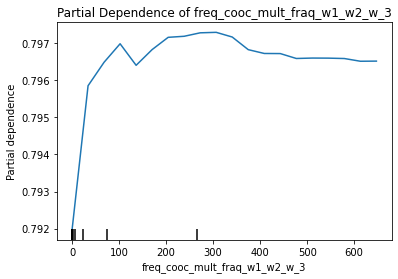

Plotting partial dependence for feature: score


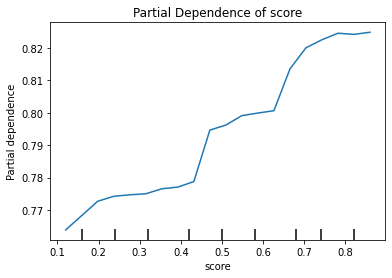

Plotting partial dependence for feature: syn_match


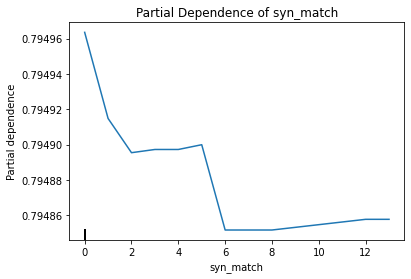

Plotting partial dependence for feature: syn_match_perc
Could not plot partial dependence for feature syn_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: syn1_count


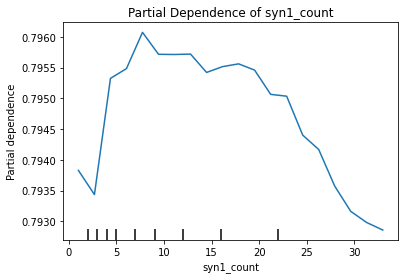

Plotting partial dependence for feature: syn2_count


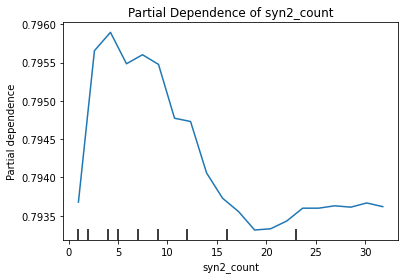

Plotting partial dependence for feature: are_synonyms


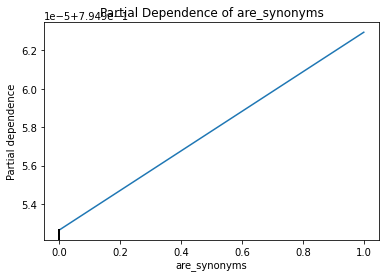

Plotting partial dependence for feature: fraq_syn1_syn2


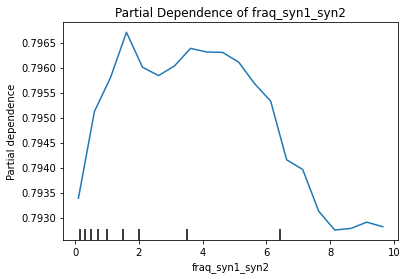

Plotting partial dependence for feature: syn_match_mult_fraq_syn
Could not plot partial dependence for feature syn_match_mult_fraq_syn: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: ant_match


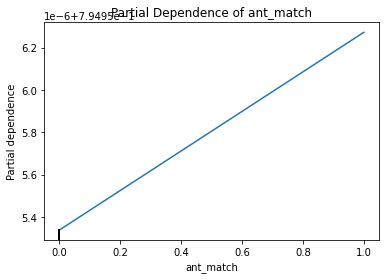

Plotting partial dependence for feature: ant_match_perc


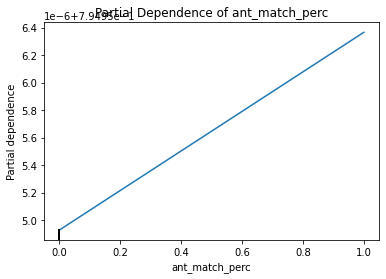

Plotting partial dependence for feature: ant1_count


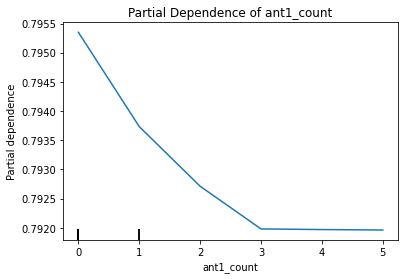

Plotting partial dependence for feature: ant2_count


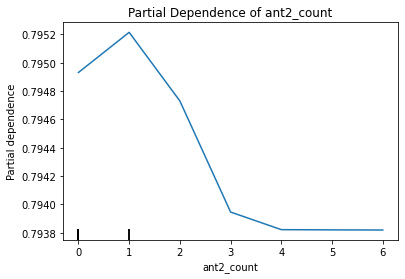

Plotting partial dependence for feature: are_antonyms


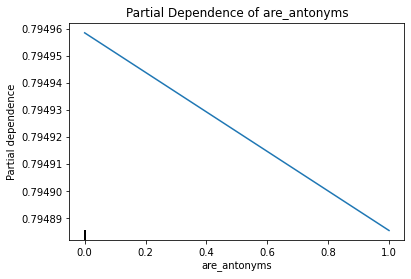

Plotting partial dependence for feature: fraq_ant1_ant2


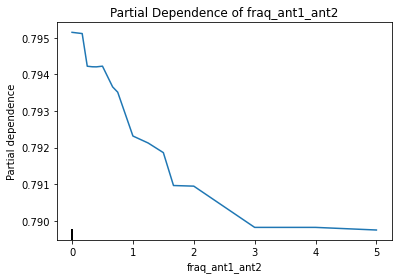

Plotting partial dependence for feature: ant_match_mult_fraq_ant


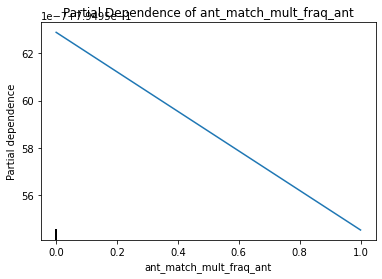

Plotting partial dependence for feature: hypo_match


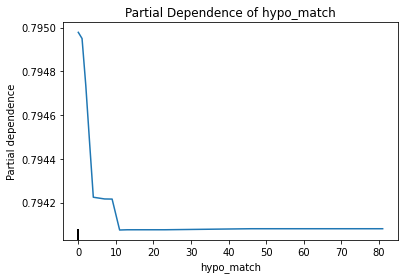

Plotting partial dependence for feature: hypo_match_perc
Could not plot partial dependence for feature hypo_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hypo1_count


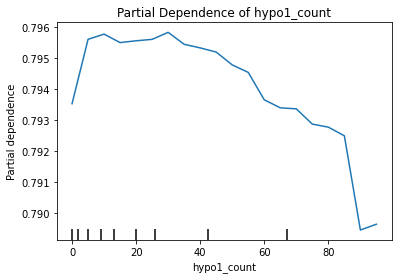

Plotting partial dependence for feature: hypo2_count


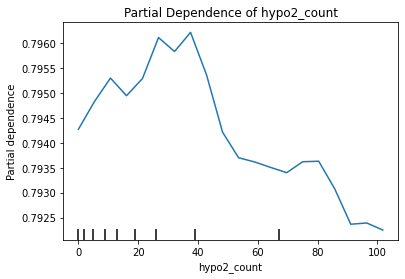

Plotting partial dependence for feature: is_hyponym


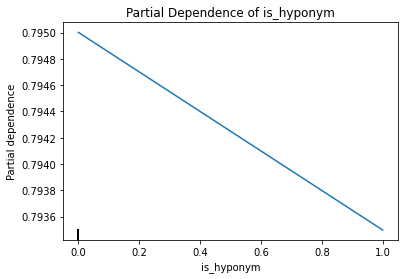

Plotting partial dependence for feature: fraq_hypo1_hypo2


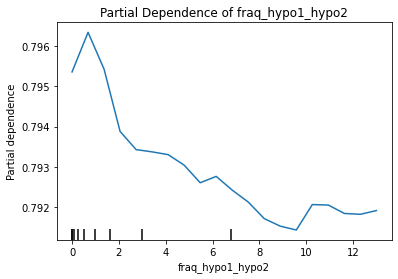

Plotting partial dependence for feature: hypo_match_mult_fraq_hypo
Could not plot partial dependence for feature hypo_match_mult_fraq_hypo: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hyper_match


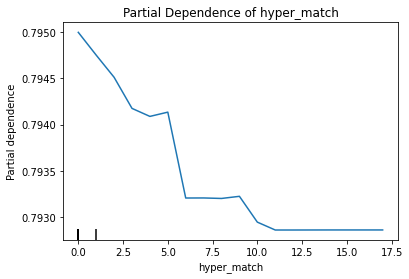

Plotting partial dependence for feature: hyper_match_perc


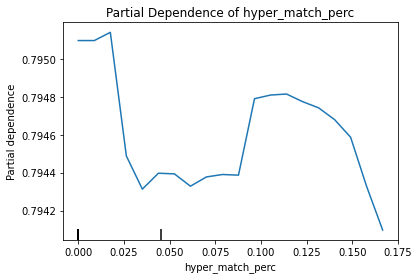

Plotting partial dependence for feature: hyper1_count


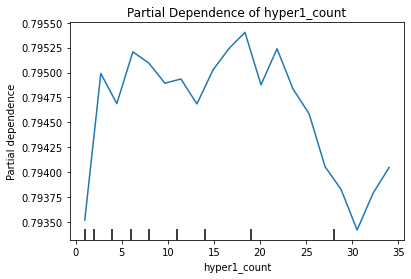

Plotting partial dependence for feature: hyper2_count


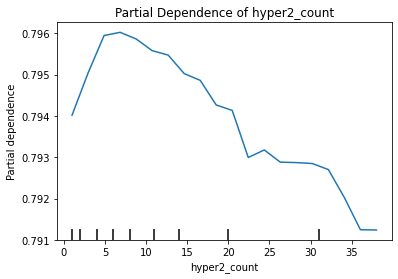

Plotting partial dependence for feature: is_hypernym


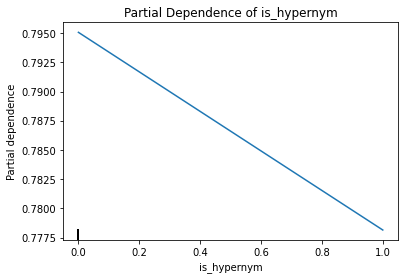

Plotting partial dependence for feature: fraq_hyper1_hyper2


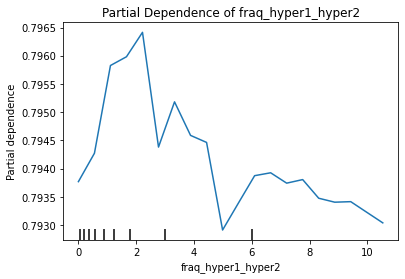

Plotting partial dependence for feature: hyper_match_mult_fraq_hyper


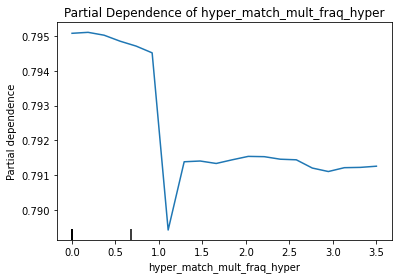

Plotting partial dependence for feature: polysemy1


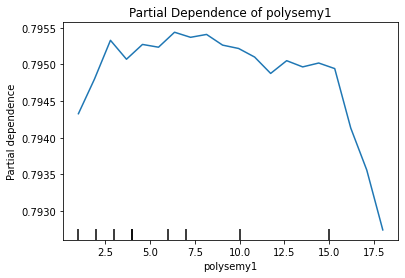

Plotting partial dependence for feature: polysemy2


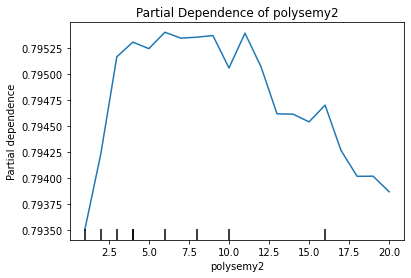

Plotting partial dependence for feature: are_homonyms


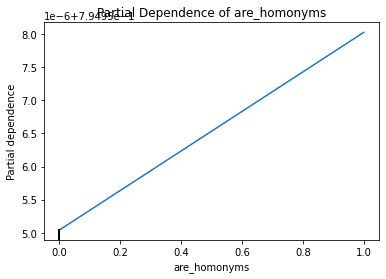

Plotting partial dependence for feature: common_homonyms


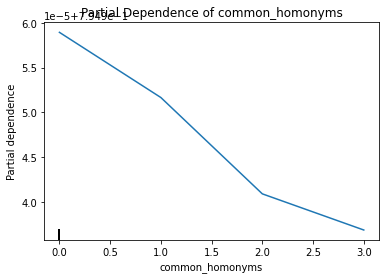

Plotting partial dependence for feature: common_homonyms_perc
Could not plot partial dependence for feature common_homonyms_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: common_lemma


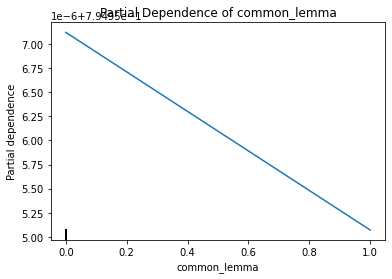

Plotting partial dependence for feature: common_prefixes


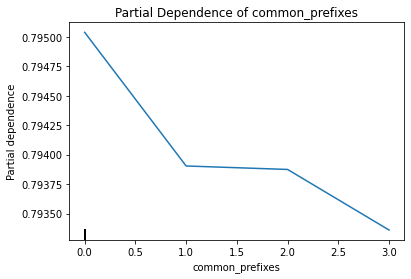

Plotting partial dependence for feature: common_suffixes


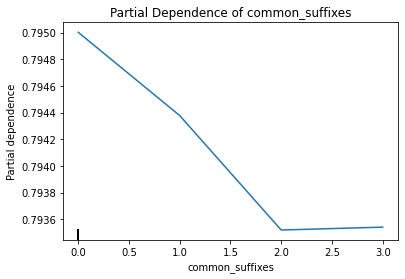

Plotting partial dependence for feature: are_derivationally_related


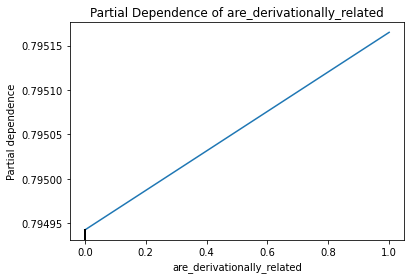

Plotting partial dependence for feature: common_pos_tags


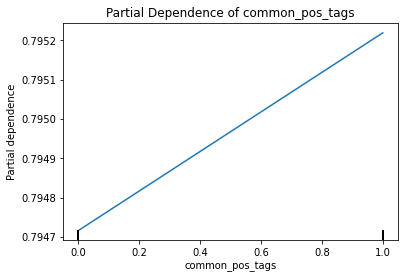

Plotting partial dependence for feature: same_pos_tags


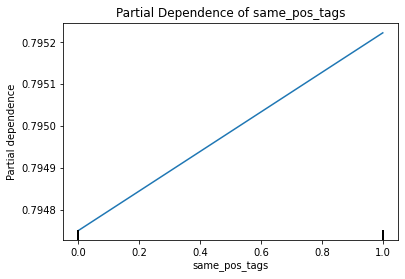

Plotting partial dependence for feature: first_word_dep_count


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == 0.7949560064011907 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


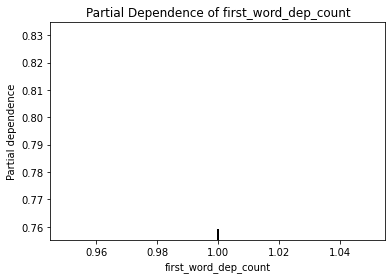

Plotting partial dependence for feature: second_word_dep_count


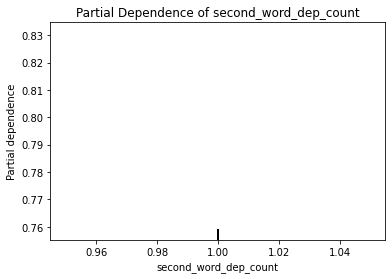

Plotting partial dependence for feature: common_dep_types


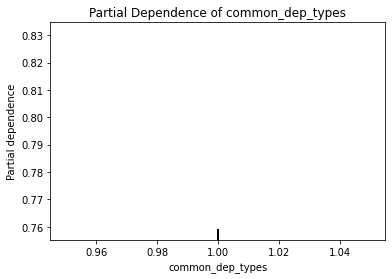

Plotting partial dependence for feature: dep_count_diff


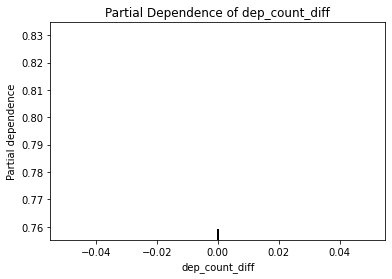

Plotting partial dependence for feature: common_head_words


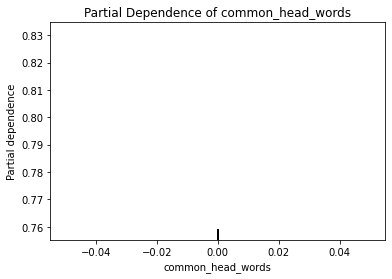

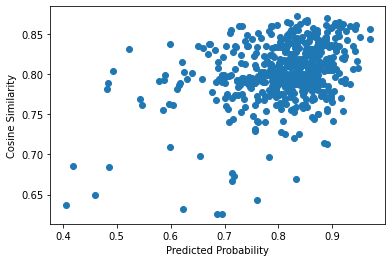

                           Metric     Value
0       Mean Absolute Error (MAE)  0.060081
1        Mean Squared Error (MSE)  0.006248
2  Root Mean Squared Error (RMSE)  0.079045
3                  R-squared (R2)  0.117543
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.364706
y_pred  0.364706  1.000000
Pearsonův korelační koeficient: 0.3647059397528023
P-hodnota: 1.8350883002789437e-18


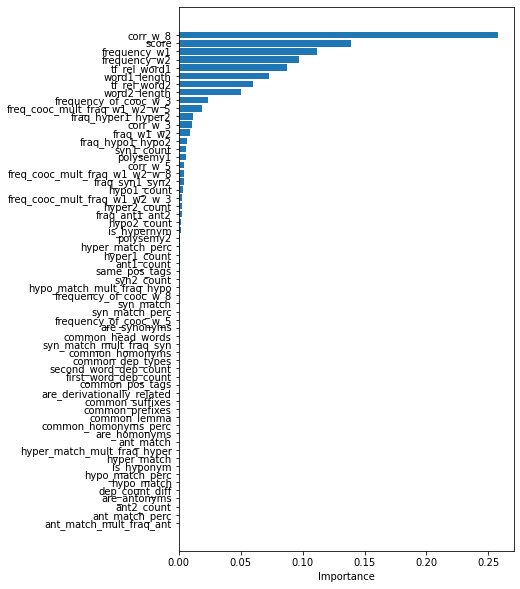

PDP
Plotting partial dependence for feature: corr_w_3


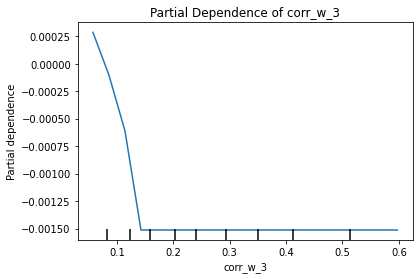

Plotting partial dependence for feature: frequency_of_cooc_w_3


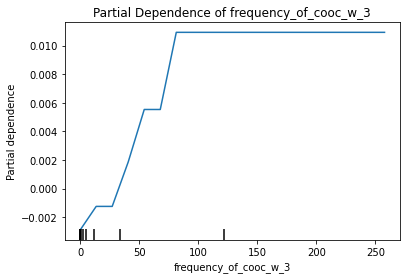

Plotting partial dependence for feature: frequency_of_cooc_w_5


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == -1.5973279556685816e-16 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


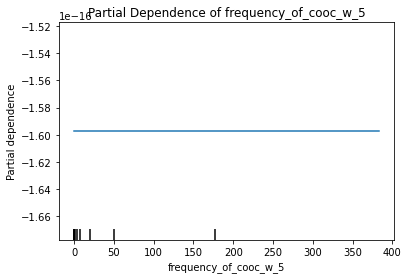

Plotting partial dependence for feature: corr_w_5


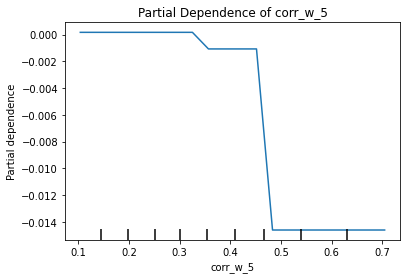

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


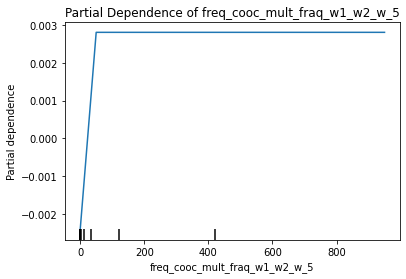

Plotting partial dependence for feature: frequency_of_cooc_w_8


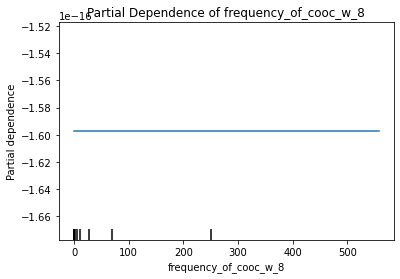

Plotting partial dependence for feature: corr_w_8


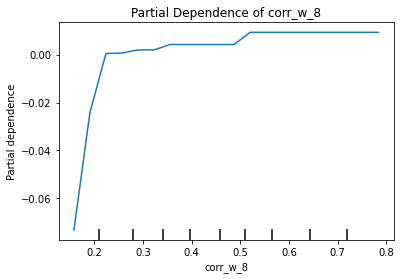

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


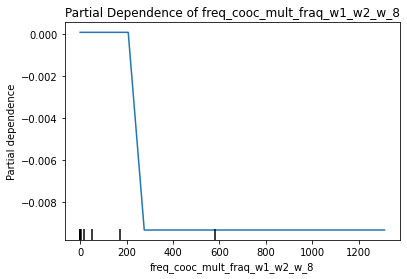

Plotting partial dependence for feature: frequency_w1


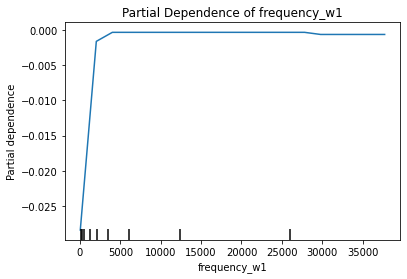

Plotting partial dependence for feature: frequency_w2


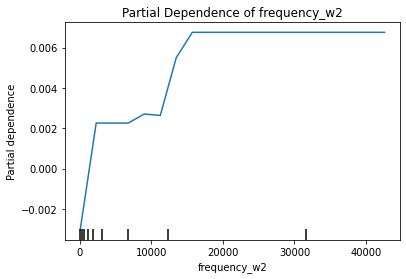

Plotting partial dependence for feature: tf_rel_word1


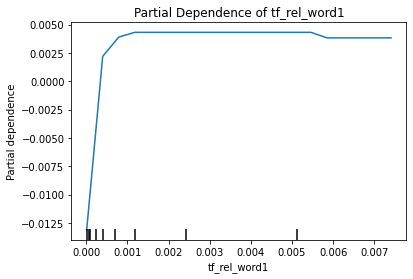

Plotting partial dependence for feature: tf_rel_word2


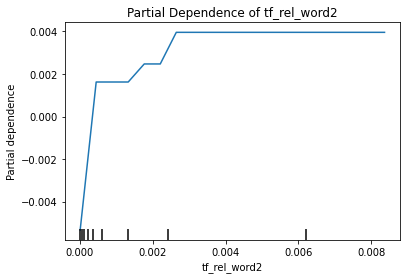

Plotting partial dependence for feature: word1_length


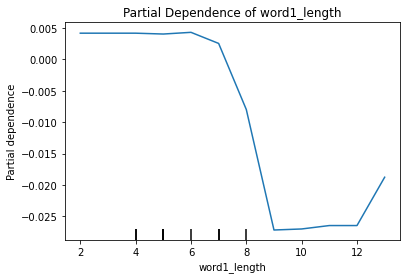

Plotting partial dependence for feature: word2_length


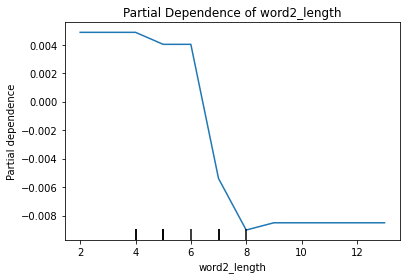

Plotting partial dependence for feature: fraq_w1_w2


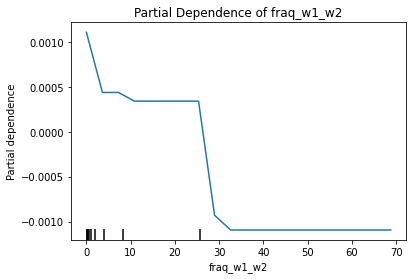

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


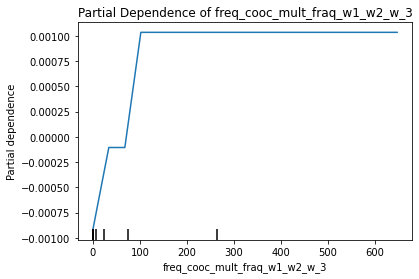

Plotting partial dependence for feature: score


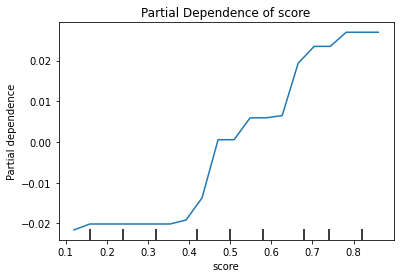

Plotting partial dependence for feature: syn_match


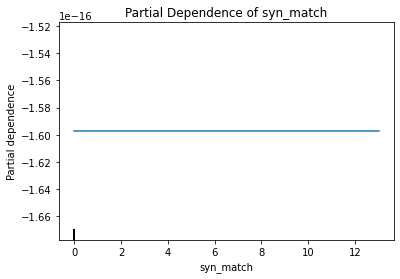

Plotting partial dependence for feature: syn_match_perc
Could not plot partial dependence for feature syn_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: syn1_count


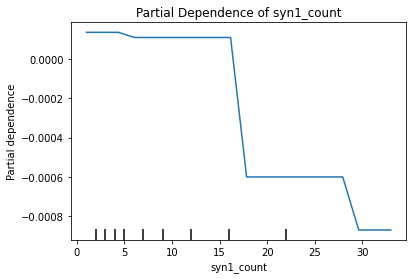

Plotting partial dependence for feature: syn2_count


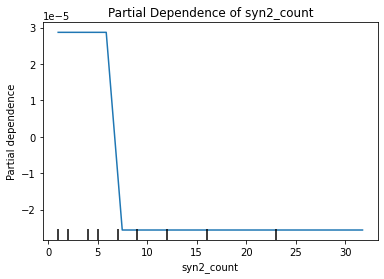

Plotting partial dependence for feature: are_synonyms


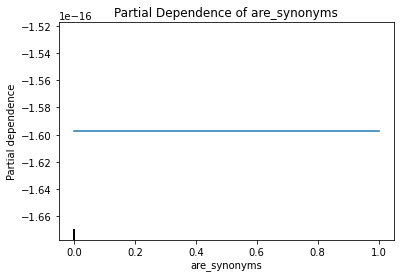

Plotting partial dependence for feature: fraq_syn1_syn2


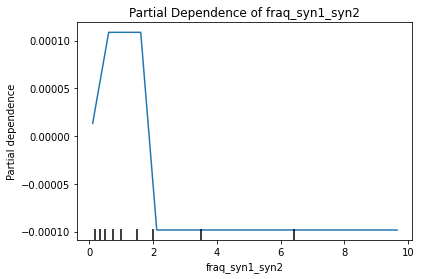

Plotting partial dependence for feature: syn_match_mult_fraq_syn
Could not plot partial dependence for feature syn_match_mult_fraq_syn: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: ant_match


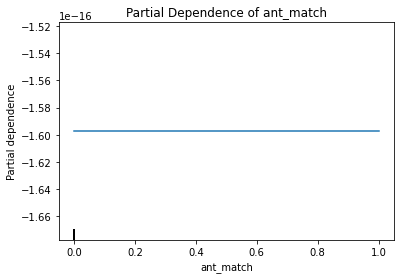

Plotting partial dependence for feature: ant_match_perc


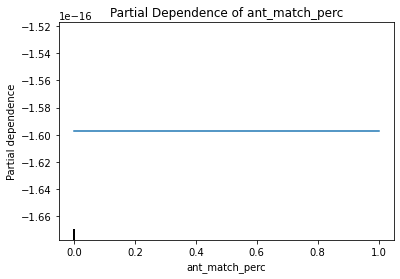

Plotting partial dependence for feature: ant1_count


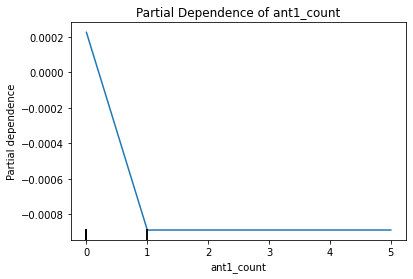

Plotting partial dependence for feature: ant2_count


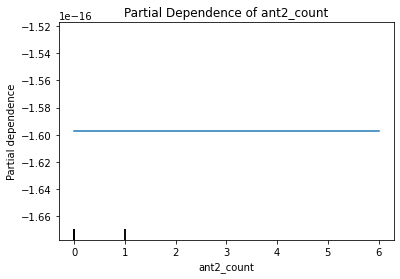

Plotting partial dependence for feature: are_antonyms


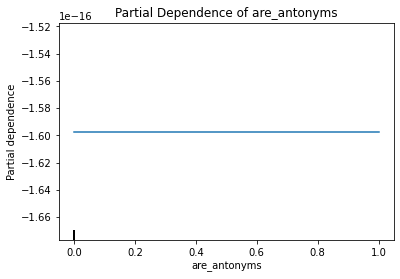

Plotting partial dependence for feature: fraq_ant1_ant2


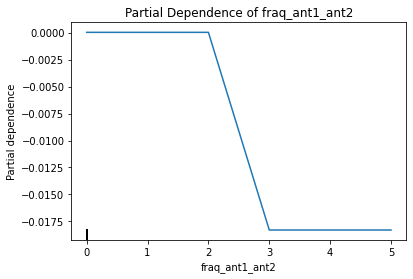

Plotting partial dependence for feature: ant_match_mult_fraq_ant


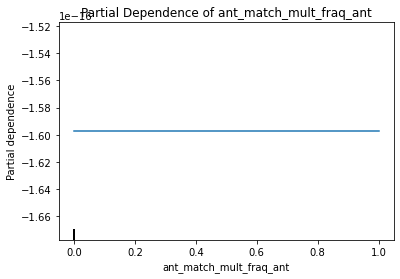

Plotting partial dependence for feature: hypo_match


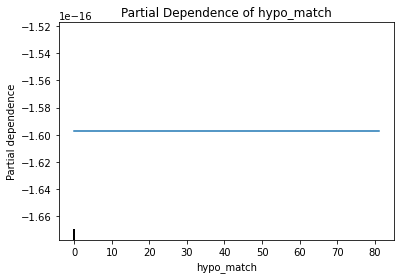

Plotting partial dependence for feature: hypo_match_perc
Could not plot partial dependence for feature hypo_match_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hypo1_count


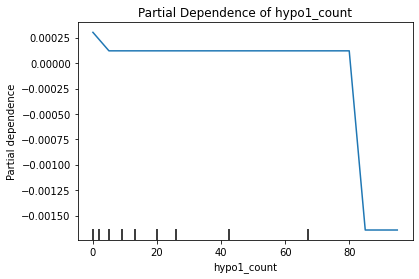

Plotting partial dependence for feature: hypo2_count


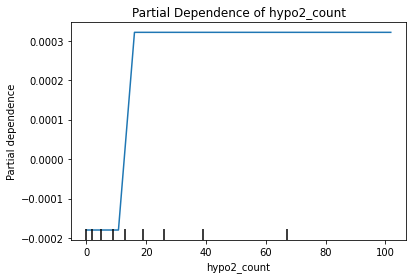

Plotting partial dependence for feature: is_hyponym


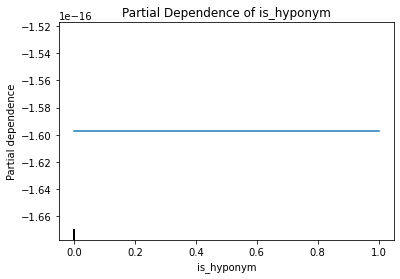

Plotting partial dependence for feature: fraq_hypo1_hypo2


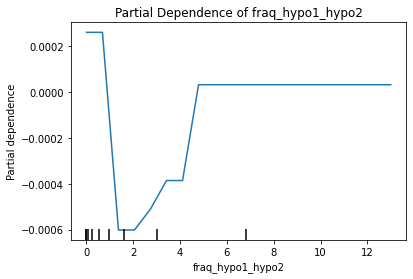

Plotting partial dependence for feature: hypo_match_mult_fraq_hypo
Could not plot partial dependence for feature hypo_match_mult_fraq_hypo: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: hyper_match


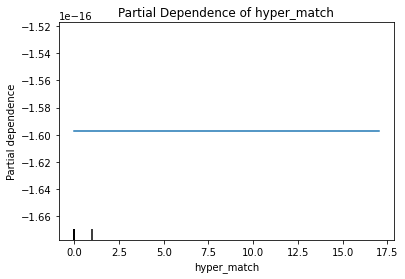

Plotting partial dependence for feature: hyper_match_perc


/home/jupyter-berl03@vse.cz/.local/lib/python3.9/site-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical bottom == top == 2.3592465817380247e-05 results in singular transformations; automatically expanding.
  ax.set_ylim([min_val, max_val])


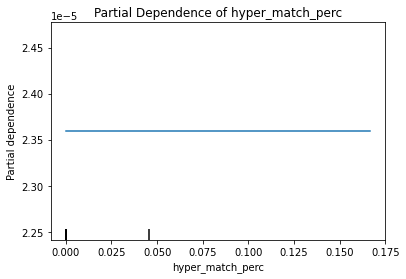

Plotting partial dependence for feature: hyper1_count


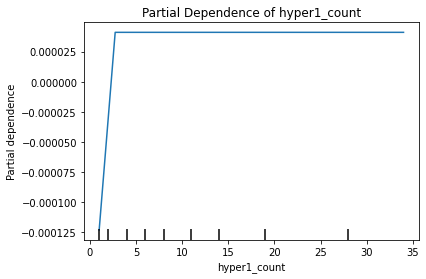

Plotting partial dependence for feature: hyper2_count


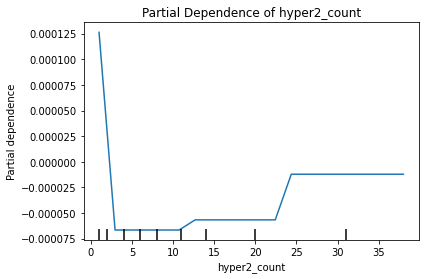

Plotting partial dependence for feature: is_hypernym


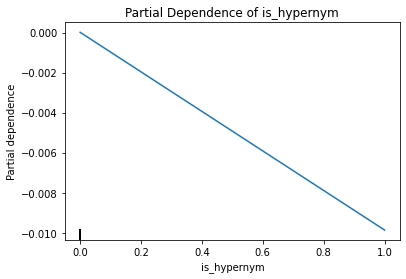

Plotting partial dependence for feature: fraq_hyper1_hyper2


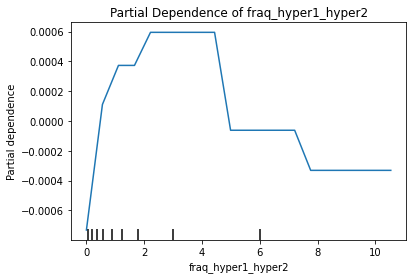

Plotting partial dependence for feature: hyper_match_mult_fraq_hyper


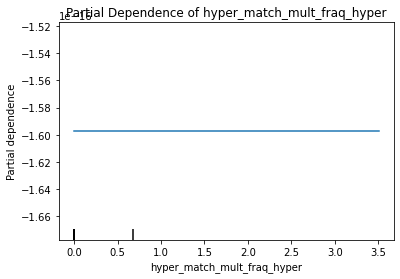

Plotting partial dependence for feature: polysemy1


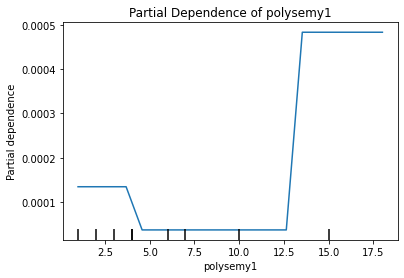

Plotting partial dependence for feature: polysemy2


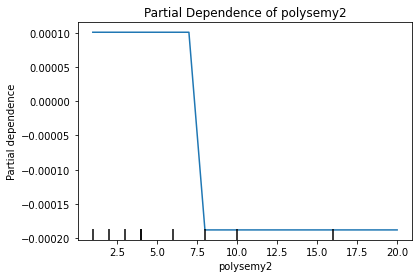

Plotting partial dependence for feature: are_homonyms


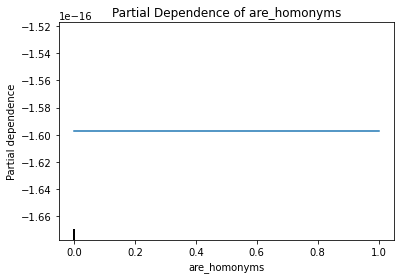

Plotting partial dependence for feature: common_homonyms


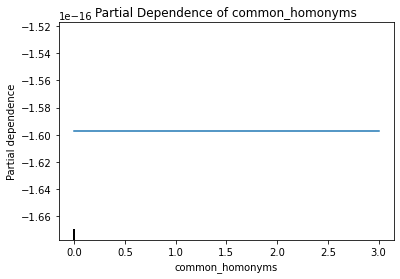

Plotting partial dependence for feature: common_homonyms_perc
Could not plot partial dependence for feature common_homonyms_perc: percentiles are too close to each other, unable to build the grid. Please choose percentiles that are further apart.
Plotting partial dependence for feature: common_lemma


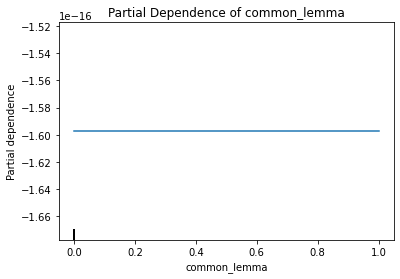

Plotting partial dependence for feature: common_prefixes


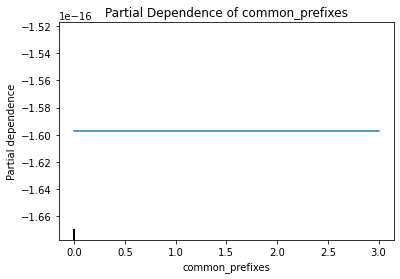

Plotting partial dependence for feature: common_suffixes


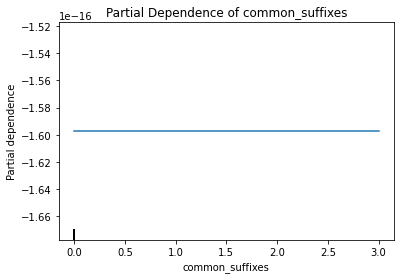

Plotting partial dependence for feature: are_derivationally_related


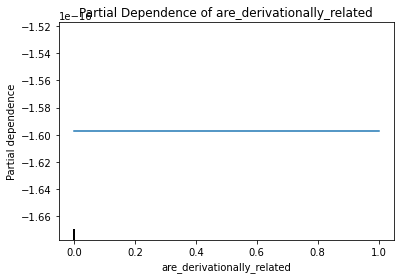

Plotting partial dependence for feature: common_pos_tags


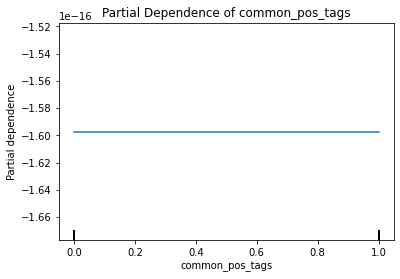

Plotting partial dependence for feature: same_pos_tags


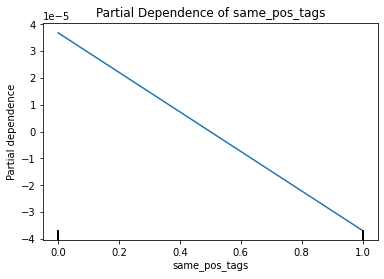

Plotting partial dependence for feature: first_word_dep_count


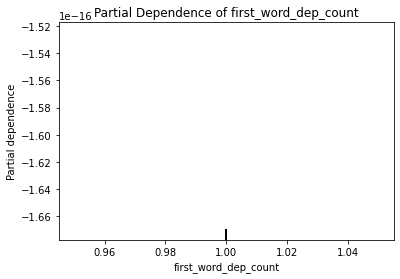

Plotting partial dependence for feature: second_word_dep_count


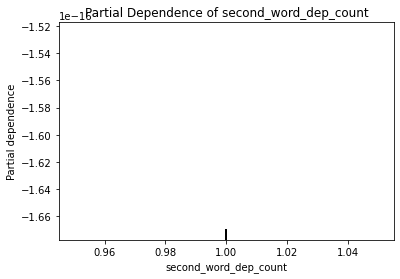

Plotting partial dependence for feature: common_dep_types


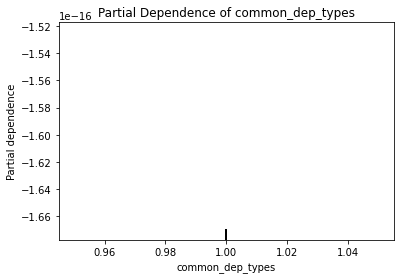

Plotting partial dependence for feature: dep_count_diff


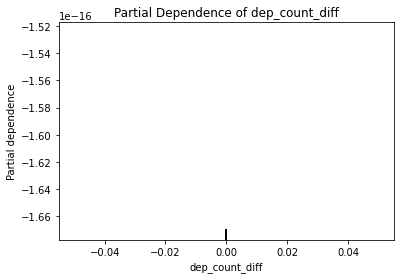

Plotting partial dependence for feature: common_head_words


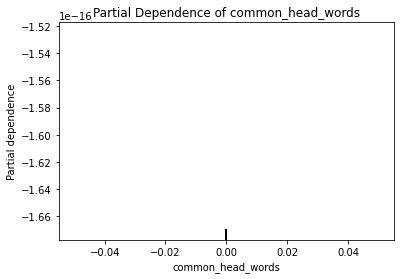

In [56]:
y = df['similarity_bert']
models = [RandomForestRegressor(n_estimators = 40,random_state=42),GradientBoostingRegressor(n_estimators = 40,random_state=42)]
for model in models:
    model_functions.reg_model_results(y,X_all,model)

### Human score prediction

RandomForestClassifier(n_estimators=40, random_state=41)


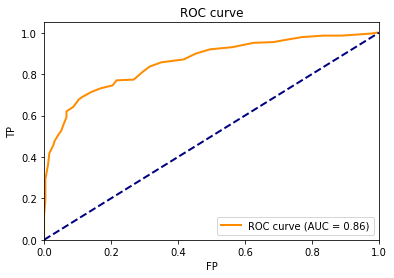

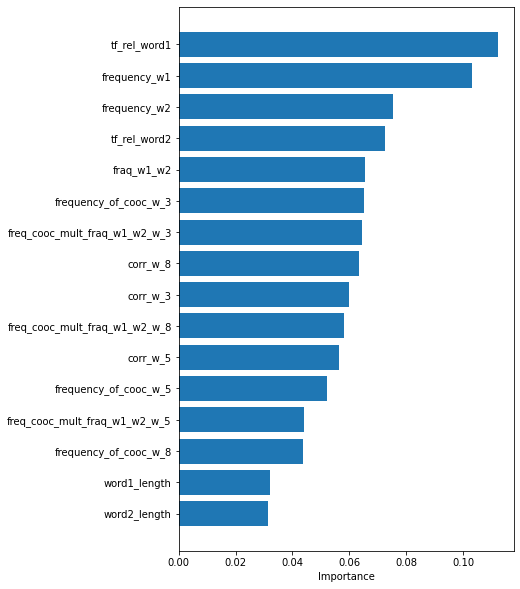

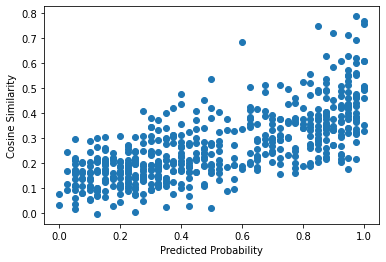

Pearsonův korelační koeficient: 0.7055967330347596
P-hodnota: 1.141029856329975e-82
GradientBoostingClassifier(n_estimators=40, random_state=41)


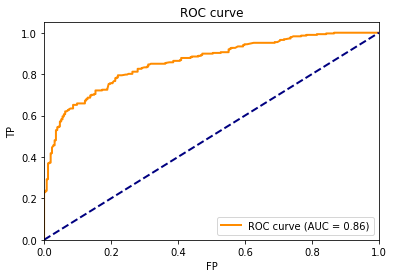

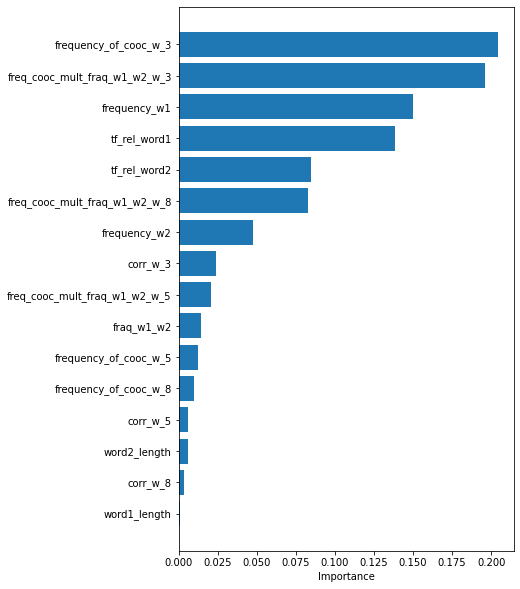

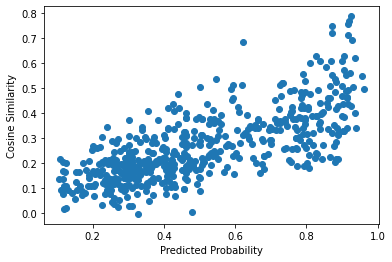

Pearsonův korelační koeficient: 0.7249594783138615
P-hodnota: 2.536458527252125e-89


In [27]:
df["human_score_cat"] =np.where(df["score"]>=0.5, 1, 0)

y = df["human_score_cat"]
models = [RandomForestClassifier(n_estimators = 40,random_state=41),GradientBoostingClassifier(n_estimators = 40,random_state=41)]
for model in models:
    print(model)
    model = model_functions.class_model_results(y,X_statistical,df,model)

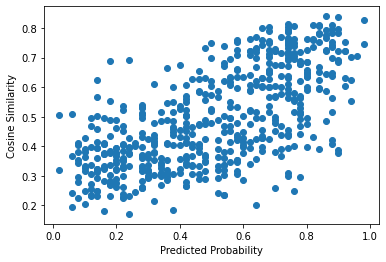

                           Metric     Value
0       Mean Absolute Error (MAE)  0.147404
1        Mean Squared Error (MSE)  0.033591
2  Root Mean Squared Error (RMSE)  0.183279
3                  R-squared (R2)  0.437276
Correlation between y_test, y_pred
         y_test   y_pred
y_test  1.00000  0.66296
y_pred  0.66296  1.00000
Pearsonův korelační koeficient: 0.6629595507269581
P-hodnota: 8.940452218925729e-70


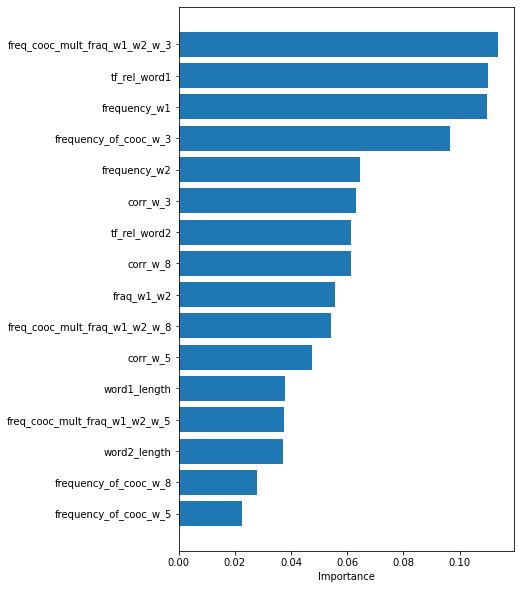

PDP
Plotting partial dependence for feature: corr_w_3


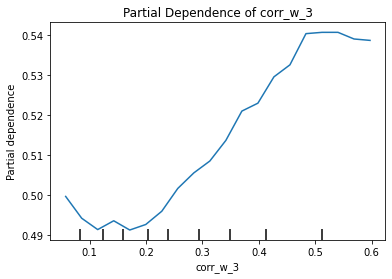

Plotting partial dependence for feature: frequency_of_cooc_w_3


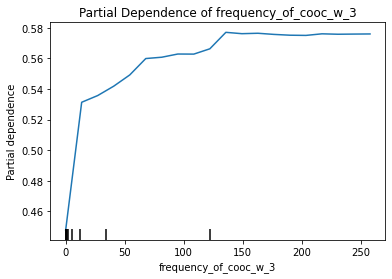

Plotting partial dependence for feature: frequency_of_cooc_w_5


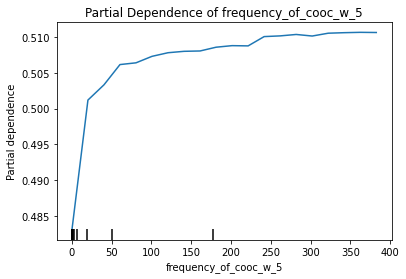

Plotting partial dependence for feature: corr_w_5


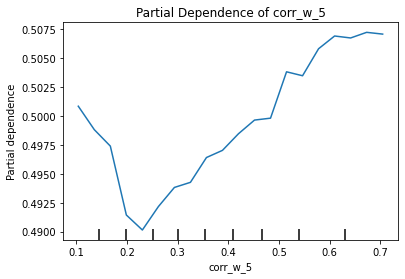

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


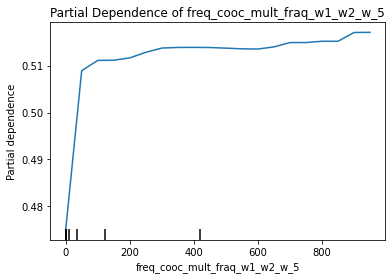

Plotting partial dependence for feature: frequency_of_cooc_w_8


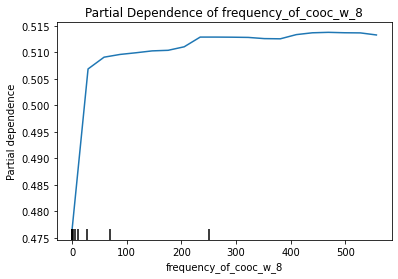

Plotting partial dependence for feature: corr_w_8


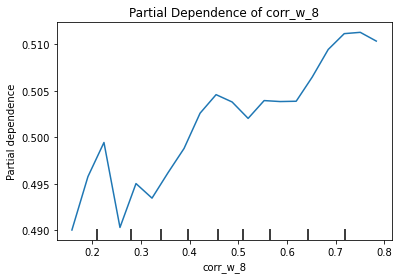

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


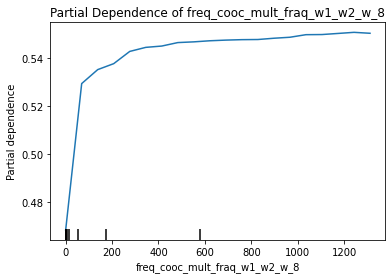

Plotting partial dependence for feature: frequency_w1


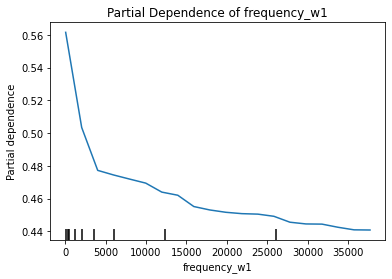

Plotting partial dependence for feature: frequency_w2


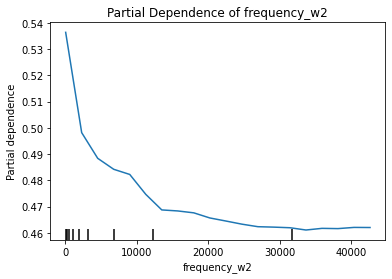

Plotting partial dependence for feature: tf_rel_word1


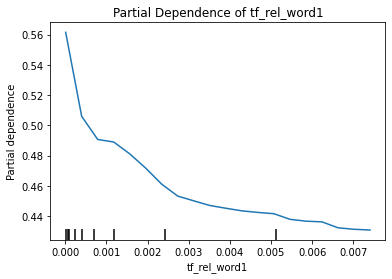

Plotting partial dependence for feature: tf_rel_word2


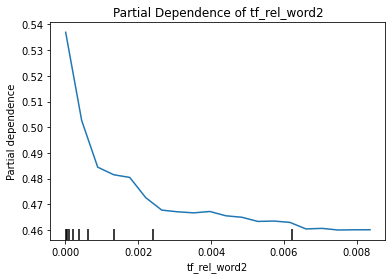

Plotting partial dependence for feature: word1_length


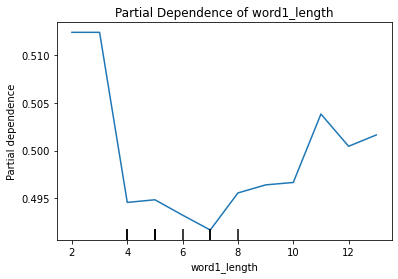

Plotting partial dependence for feature: word2_length


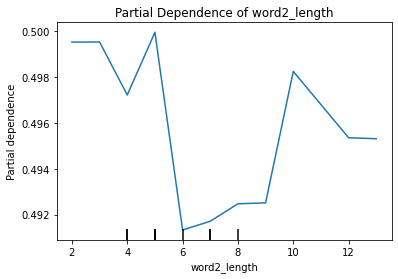

Plotting partial dependence for feature: fraq_w1_w2


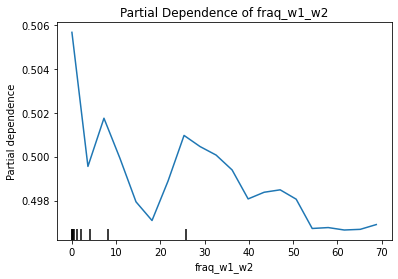

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


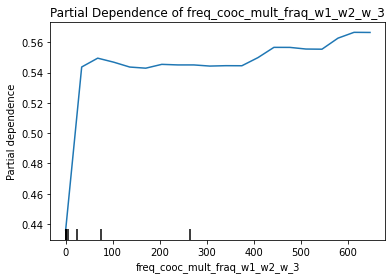

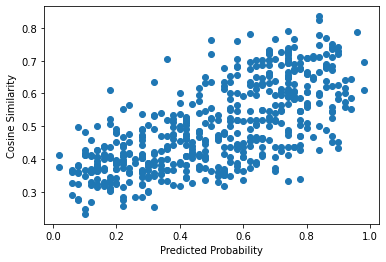

                           Metric     Value
0       Mean Absolute Error (MAE)  0.150879
1        Mean Squared Error (MSE)  0.033212
2  Root Mean Squared Error (RMSE)  0.182240
3                  R-squared (R2)  0.443634
Correlation between y_test, y_pred
          y_test    y_pred
y_test  1.000000  0.685733
y_pred  0.685733  1.000000
Pearsonův korelační koeficient: 0.6857334294180906
P-hodnota: 2.1895695226408492e-76


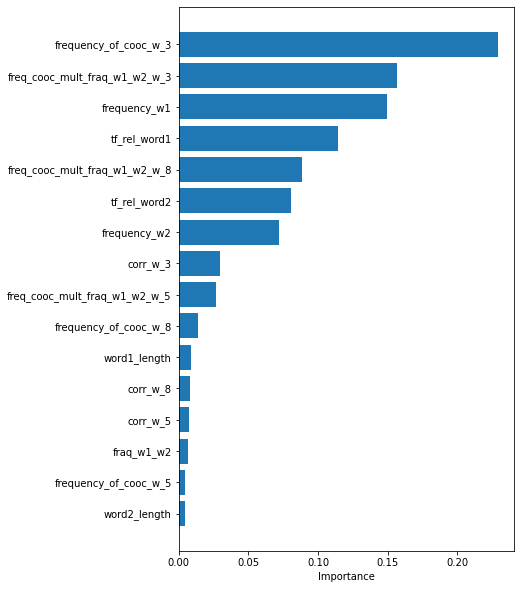

PDP
Plotting partial dependence for feature: corr_w_3


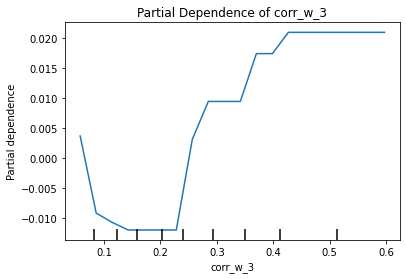

Plotting partial dependence for feature: frequency_of_cooc_w_3


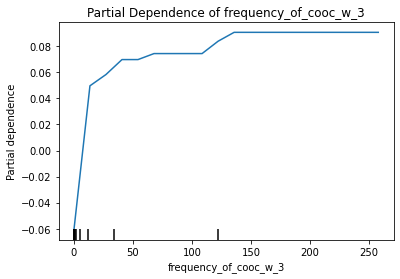

Plotting partial dependence for feature: frequency_of_cooc_w_5


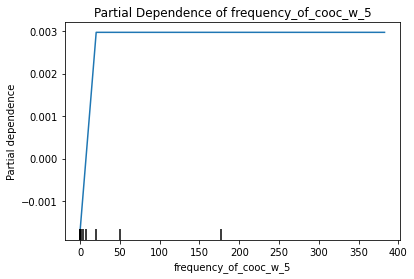

Plotting partial dependence for feature: corr_w_5


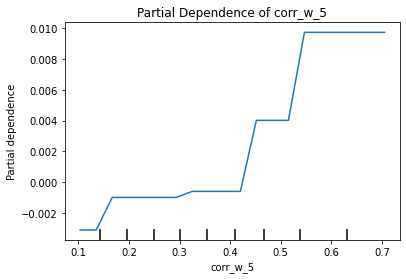

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_5


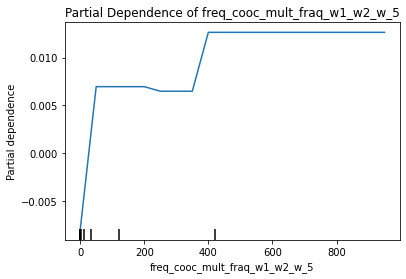

Plotting partial dependence for feature: frequency_of_cooc_w_8


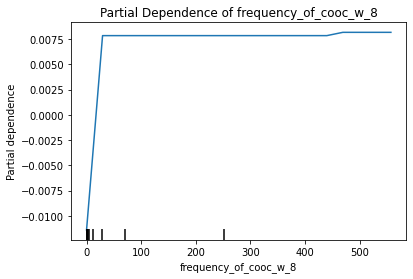

Plotting partial dependence for feature: corr_w_8


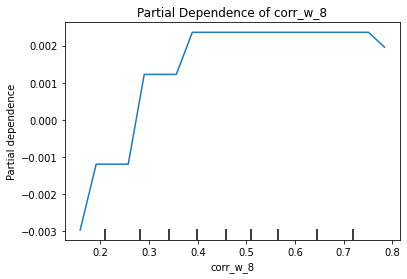

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_8


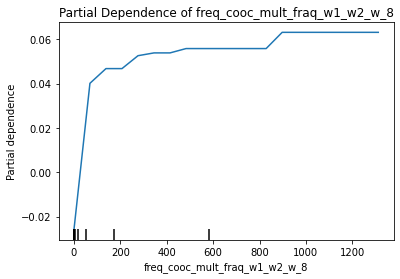

Plotting partial dependence for feature: frequency_w1


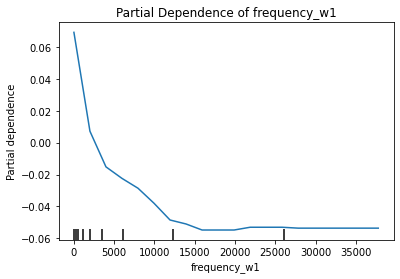

Plotting partial dependence for feature: frequency_w2


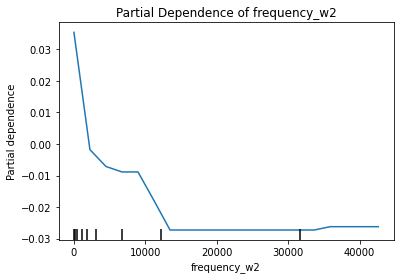

Plotting partial dependence for feature: tf_rel_word1


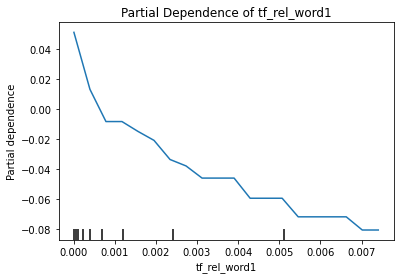

Plotting partial dependence for feature: tf_rel_word2


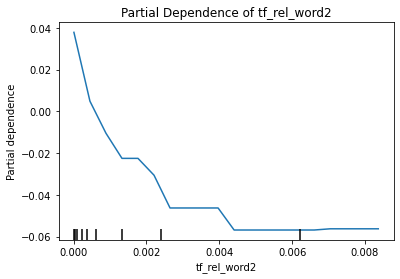

Plotting partial dependence for feature: word1_length


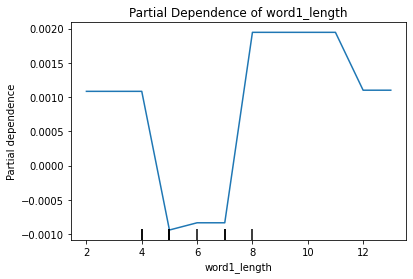

Plotting partial dependence for feature: word2_length


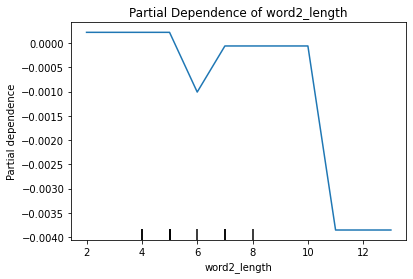

Plotting partial dependence for feature: fraq_w1_w2


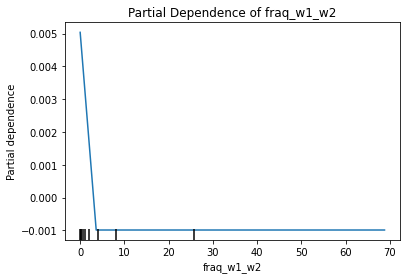

Plotting partial dependence for feature: freq_cooc_mult_fraq_w1_w2_w_3


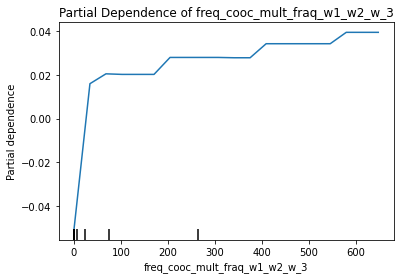

In [20]:
y = df["score"]
models = [RandomForestRegressor(n_estimators = 40,random_state=42),GradientBoostingRegressor(n_estimators = 40,random_state=42)]
for model in models:
    model_functions.reg_model_results(y,X_statistical,model)

In [31]:
df_an = df.copy()
df_an["diff_similarity_humanscore"] = df_an["score"]-df_an["similarity"]
df_an = df_an.sort_values("diff_similarity_humanscore",ascending=False)
words_emb_sim_lower = df_an[:20].index
df_an[:20][["similarity","score","score_prediction"]]

,similarity,score,score_prediction
first_second,,,
buds_flowers,0.086873,0.92,0.432916
leaf_nature,0.061078,0.86,0.391446
goose_birds,0.105611,0.86,0.412213
river_water,0.237033,0.98,0.609354
water_shore,0.160883,0.90,0.491683
blossom_buds,0.184567,0.92,0.479924
twigs_branch,0.177114,0.90,0.398848
feathers_eagle,0.162240,0.88,0.437986
subway_station,0.225025,0.94,0.615864


In [37]:
df_an[["similarity","score","score_prediction"]].corr()

,similarity,score,score_prediction
similarity,1.000000,0.630571,0.716044
score,0.630571,1.000000,0.706287
score_prediction,0.716044,0.706287,1.000000


In [34]:
df_an = df.copy()
df_an["diff_similarity_humanscore"] = df_an["similarity"]-df_an["score"]
df_an = df_an.sort_values("diff_similarity_humanscore",ascending=True)
words_emb_sim_lower = df_an[:20].index
df_an[:20][["similarity","score","score_prediction"]]

,similarity,score,score_prediction
first_second,,,
buds_flowers,0.086873,0.92,0.432916
leaf_nature,0.061078,0.86,0.391446
goose_birds,0.105611,0.86,0.412213
river_water,0.237033,0.98,0.609354
water_shore,0.160883,0.90,0.491683
blossom_buds,0.184567,0.92,0.479924
twigs_branch,0.177114,0.90,0.398848
feathers_eagle,0.162240,0.88,0.437986
subway_station,0.225025,0.94,0.615864
